## DCGAN (TensorFlow 2)


## GAN 논문 소개
Generative Adversarial Networks (GANs)은 최근 딥러닝 방법론 중 가장 각광받고 생성 네트웍이다. Ian Goodfellow가 NIPS 2014 학술대회를 통해 발표한 이 기법은 기존의 생성 네트워크와는 달리 고품질 출력을 얻을 수 있는 것이 특징이다. 지난 4-5년 동안 GAN에 대한 수많은 연구가 이루어졌으며, 최근의 GAN 기법들은 그래픽스 렌더링을 한 것과 같은 매우 우수한 품질을 가지는 결과물도 얻어내고 있다. 

## GAN의 기본 아이디어

GAN의 기본 아이디어는 원 논문에서 다음과 같이 소개하고 있다.
> The generative model can be thought of as analogous to a team of counterfeiters, trying to produce face currency and use it without detection, while the discriminative model is analogous to the police, trying to detect the counterfeit currency. Competition in this game drives both teams to improve their methods until the ounterfeits are indistiguishable from the genuine articles. - Goodfellow et al. NIPS 2014.

GAN은 generator(생성자, 이하 G)와 discriminator(판별자, 이하 D)라는 두 네트웍이 경쟁적 관계 속에 학습한다. 

생성자 G와 판별자 D는 게임이론(game theory)에 기반한 2인 플레이 최적화 게임 방식으로 학습하는데, 각자 게임에서 좋은 평가를 받는 방식은 서로 다르다. 생성자 G는 판별자 D의 실수를 최대한 많이 유도하는 데이터를 만들어내면 좋은 평가를 받는 반면, 판별자 D는 생성자 G가 만들어낸 데이터(generated data)와 진실 데이터(ground-truth data)를 잘 구분하면 좋은 평가를 받는다. 

이런 종류의 문제를 **minmax two-play game**이라 한다. 

## GAN 네트웍 구조

![GAN](https://cdn-images-1.medium.com/max/800/1*XKanAdkjQbg1eDDMF2-4ow.png)

[이미지 출처: Branko Blagojevic's Medium Post](https://medium.com/ml-everything/generating-letters-using-generative-adversarial-networks-gans-161b0be3c229)


### Generator (생성자, G)
생성자 G의 목표는 데이터 $x$를 만들어내는 확률 모델 $p_g$를 학습해 내는 것이다. 

입력으로 다음과 같이 어떤 확률분포를 따르는 노이즈 $z$가 있다고 하면,
$$z \sim p_z(z)$$
생성자 G는 다음과 같이 노이즈 $z$를 입력으로 받아 생성 데이터를 만들어 내는 함수로 볼 수 있다.
$$ G(z; \theta_g) $$

생성자 G에 대한 함수는 딥네트웍으로 모델링 가능하며, 학습은 파라메터 $\theta_g$를 생성자의 목표에 맞게 최적화 시키는 과정으로 볼 수 있다.

### Discriminator (판별자, D)
판별자 D는 입력으로 데이터 $x$를 받고 이에 대한 판별을 한다. 
$$ D(x; \theta_d)$$

우리가 판별자에게 기대하는 바는 

* 입력 데이터 $x$가 진실 데이터로부터 나왔으면 판별자 D가 1을 리턴해 주고,
* 입력 데이터 $x$가 생성자 G가 만들어낸 것이라면 판별자 D는 0을 리턴해 주는 것이다.

판별자 D에 대한 함수는 딥네트웍으로 모델링 가능하며, 학습은 파라메터 $\theta_d$를 판별자의 목표에 맞게 최적화 시키는 과정으로 볼 수 있다.





### GAN 목적함수
I. Goodfellow는 GAN 논문에서 이와 같은 minmax two-play game을 두개의 적대적 네트웍으로 모델링하고 턴제 게임 방식의 훈련법을 제시하였다.

다음은 GAN 학습단계의 목적함수이다.

$$
\begin{align}
    \min_{G}\max_{D} V(G, D) = \mathbb{E}_{\mathbf{x} \sim p_{\textit{data}}(\mathbf{x})}[\log D(\mathbf{x})] + \mathbb{E}_{\mathbf{z} \sim p_\mathbf{z}(\mathbf{z})}[\log(1 - D(G(\mathbf{z})))]
\end{align}
$$


판별자 D가 똑똑하게 훈련된다면 
* 진실 데이터를 봤을 때의 기대값, 즉 $\mathbb{E}_{\mathbf{x} \sim p_{\textit{data}}(\mathbf{x})}[\log D(\mathbf{x})] = 0$이 되어야 한다.
* 생성자 G가 만들어낸 데이터를 봤을 때의 기대값, 즉 $\mathbb{E}_{\mathbf{z} \sim p_\mathbf{z}(\mathbf{z})}[\log(1 - D(G(\mathbf{z})))] = 0$이 되어야 한다.

따라서, 판별자 D 입장에서 게임의 목표는 목적함수를 최대화 하는 것이다.


생성자 G가 똑똑하게 훈련되었다면
* 판별자 D를 속일만큼 양질의 데이터가 만들어졌기 때문에 $D(G(\mathbf{z})) = 1$이 되어야 하므로, 기대값 $\mathbb{E}_{\mathbf{z} \sim p_\mathbf{z}(\mathbf{z})}[\log(1 - D(G(\mathbf{z})))] = -\infty$이 된다.

따라서, 생성자 G 입장에서 게임의 목표는 목적함수를 최소화 하는 것이다.


### GAN v.s. VAE

학습 단계에서 VAE와 GAN은 다음 차이점이 있다.

* VAE에서 latent variable은 backprop에 참여하는 반면, visible unit (예: 영상)은 backprop에 참여하지 않는다.
* GAN에서 latent variable은 backprop에 참여하지 않는 반면, visible unit (예: 영상)은 backprop에 참여한다.

In [ ]:
import sys
import time
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf                       # 텐서플로우 임포트
import tensorflow_probability as tfp

from tensorflow.keras import models, layers   # 케라스 관련 모듈 임포트

print("Python:", sys.version)
print("Numpy:", np.__version__)

print("Tensorflow: ", tf.__version__)        # 텐서플로우 버전을 확인하도록 한다.
print("Keras: ", tf.keras.__version__)  # 케라스 버전을 확인한다.

print("Tensorflow Probability: ", tfp.__version__)       # TFP 버젼을 확인한다.

Python: 3.7.10 (default, Feb 20 2021, 21:17:23) 
[GCC 7.5.0]
Numpy: 1.19.5
Tensorflow:  2.4.1
Keras:  2.4.0
Tensorflow Probability:  0.12.1


In [ ]:
# MNIST 데이터 로딩
mnist = tf.keras.datasets.mnist

(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

# Normalize the images to [-1, 1] (* tanh을 거친 값과 비교해야 하기 때문...)
train_images = (train_images - 127.5) / 127.5
test_images = (test_images - 127.5) / 127.5

# tensorflow probablity layer가 float32를 입력을 받기 때문에 float64를 float32로 캐스팅
train_images = train_images.astype('float32')
test_images = test_images.astype('float32')

# 데이터가 [-1, 1] 사이로 정규화 되었는지 확인
print(np.amin(train_images), np.amax(train_images))


print(train_images.shape)
print(test_images.shape)
print(train_images[0].shape)
print(train_images[0][0][0].dtype)
print(train_labels[0].dtype)

11493376/11490434 [==============================] - 0s 0us/step
-1.0 1.0
(60000, 28, 28)
(10000, 28, 28)
(28, 28)
float32
uint8


In [ ]:
num_classes = 10
BUFFER_SIZE = 60000
BATCH_SIZE = 256


train_label_onehots = tf.keras.utils.to_categorical(train_labels, num_classes)
test_label_onehots = tf.keras.utils.to_categorical(test_labels, num_classes)

print(train_label_onehots.shape)
print(test_label_onehots.shape)

(60000, 10)
(10000, 10)


In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_label_onehots)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE) # image와 label을 묶어서 dataset으로 생성
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_label_onehots)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
next(iter(train_dataset))

(<tf.Tensor: shape=(256, 28, 28), dtype=float32, numpy=
 array([[[-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         ...,
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.]],
 
        [[-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         ...,
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.]],
 
        [[-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         ...,
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.],
         [-1., -1., -1., ..., -1., -1., -1.]],
 
        ...,
 
        [[-1., -1., -1., ..., -1., -1., -1.],
    

![GAN](https://cdn-images-1.medium.com/max/800/1*XKanAdkjQbg1eDDMF2-4ow.png)

[이미지 출처: Branko Blagojevic's Medium Post](https://medium.com/ml-everything/generating-letters-using-generative-adversarial-networks-gans-161b0be3c229)

## Convolution
https://github.com/vdumoulin/conv_arithmetic

### Convolution
* kernel size = 3
* padding = 1
* stride = 2

![대체 텍스트](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides.gif)


### Conv2DTranspose
* kernel size = 3
* padding = 1
* stride = 2

![대체 텍스트](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_transposed.gif)

In [ ]:
input_z = tf.keras.Input(shape = (100,))
#z = tf.keras.layers.Dense(128, use_bias = False)(input_z)
#z = tf.keras.layers.BatchNormalization()(z)
#z = tf.keras.layers.LeakyReLU(alpha = 0.2)(z) # 논문에서는 0.2로 줌 defalut alpha = 0.3


input_con = tf.keras.Input(shape = (10,))
#con = tf.keras.layers.Dense(128, use_bias = False)(input_con)
#con = tf.keras.layers.BatchNormalization()(con)
#con = tf.keras.layers.LeakyReLU(alpha = 0.2)(con)

gen = tf.keras.layers.Concatenate()([input_z, input_con])
gen = tf.keras.layers.Dense(256, use_bias=False)(gen)
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen)
gen = tf.keras.layers.Dense(512, use_bias = False)(gen)
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen)
gen = tf.keras.layers.Dense(1024, use_bias=False)(gen)
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Dense(28*28 , use_bias=False, activation = 'tanh')(gen)
gen_out = tf.keras.layers.Reshape(target_shape=(28,28))(gen)

G = tf.keras.Model(inputs = [input_z , input_con], outputs = gen_out)

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
concatenate_2 (Concatenate)     (None, 110)          0           input_5[0][0]                    
                                                                 input_6[0][0]                    
__________________________________________________________________________________________________
dense_8 (Dense)                 (None, 256)          28160       concatenate_2[0][0]        

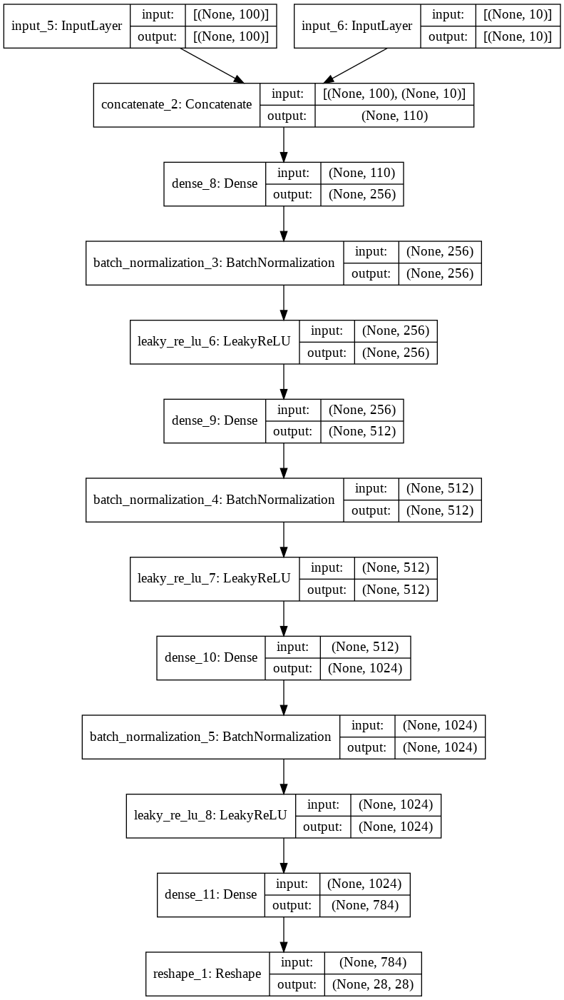

In [ ]:
G.summary()
tf.keras.utils.plot_model(G, show_shapes=True)

In [ ]:
input_img = tf.keras.Input(shape = (28,28))
flatten_img = tf.keras.layers.Flatten()(input_img)


input_con = tf.keras.Input(shape = (10,))

dis = tf.keras.layers.Concatenate()([flatten_img, input_con])
dis = tf.keras.layers.Dense(256, use_bias = False)(dis)
dis = tf.keras.layers.LeakyReLU(alpha = 0.2)(dis)
dis = tf.keras.layers.Dense(512, use_bias = False)(dis)
dis = tf.keras.layers.LeakyReLU(alpha = 0.2)(dis)
dis = tf.keras.layers.Dense(512, use_bias=False)(dis)
dis = tf.keras.layers.LeakyReLU(alpha = 0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis_out = tf.keras.layers.Dense(1 , use_bias = False, activation = 'sigmoid')(dis)


D = tf.keras.Model(inputs = [input_img , input_con], outputs = dis_out)

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 28, 28)]     0                                            
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 784)          0           input_7[0][0]                    
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
concatenate_3 (Concatenate)     (None, 794)          0           flatten_1[0][0]                  
                                                                 input_8[0][0]              

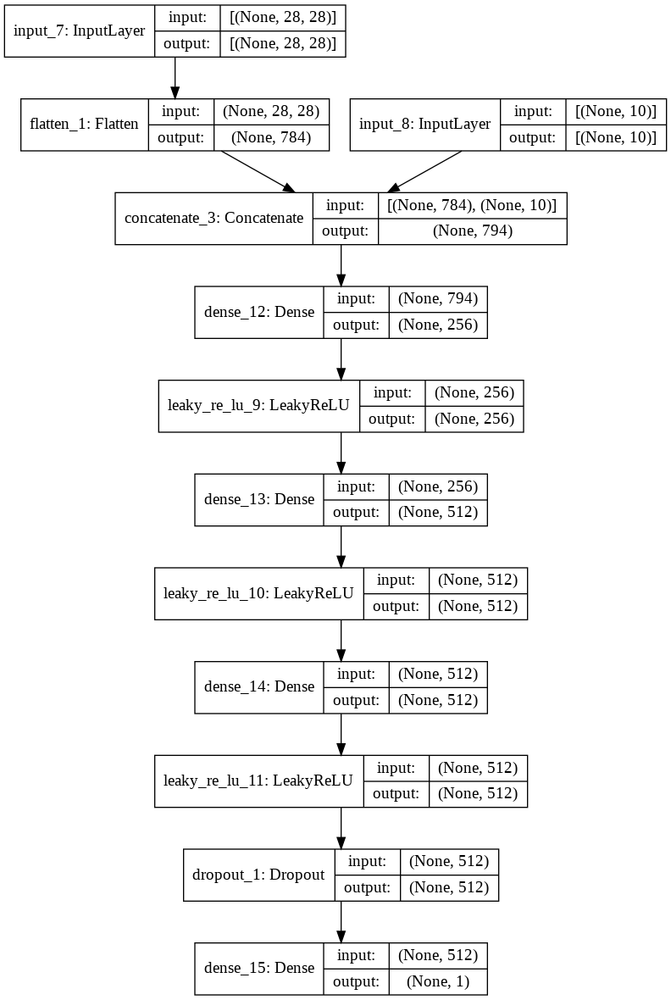

In [ ]:
D.summary()
tf.keras.utils.plot_model(D, show_shapes=True)

test condition : 7


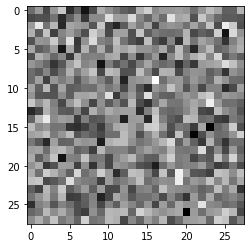

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기
test_noise = tf.random.normal([1, 100])
test_number = tf.random.uniform(shape=(1,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)
fake_image_test = G([test_noise,test_con], training=False)  # 생성자 G를 함수로 쓸 때는 training=False로 설정해야 함.


print(f'test condition : {test_number[0]}')
plt.imshow(fake_image_test[0], cmap='gray')
plt.show()

In [ ]:
# Discriminator에게 generator가 만든 노이즈 영상을 보여주고, 판단을 내릴 수 있는 테스트 함.

decision = D([fake_image_test, test_con], training=False)  # 판별자 D를 함수로 쓸 때는 training=False로 설정해야 함.
print(decision)


tf.Tensor([[0.47236973]], shape=(1, 1), dtype=float32)


## GAN 목적함수
GAN의 목적함수는 다음과 같다.

$$
\begin{align}
    \min_{G}\max_{D} V(G, D) = \mathbb{E}_{\mathbf{x} \sim p_{\textit{data}}(\mathbf{x})}[\log D(\mathbf{x})] + \mathbb{E}_{\mathbf{z} \sim p_\mathbf{z}(\mathbf{z})}[\log(1 - D(G(\mathbf{z})))]
\end{align}
$$

### Discriminator Loss
판별자 D 입장에서는 GAN 목적함수를 다음과 같이 해석하고, 최대화 문제를 풀고자 한다.
$$
\begin{align}
    \max_{D} V(D) = \mathbb{E}_{\mathbf{x} \sim p_{\textit{data}}(\mathbf{x})}[\log D(\mathbf{x})] + \mathbb{E}_{\mathbf{z} \sim p_\mathbf{z}(\mathbf{z})}[\log(1 - D(\mathbf{x}_{\textrm{fake}}))]
\end{align}
$$

### Generator Loss
생성자 G 입장에서는 GAN 목적함수를 다음과 같이 해석하고, 최소화 문제를 풀고자 한다.
$$
\begin{align}
    \min_{G} V(G) = \mathbb{E}_{\mathbf{z} \sim p_\mathbf{z}(\mathbf{z})}[\log(1 - D(G(\mathbf{z})))]
\end{align}
$$

In [ ]:
# GAN 트레이닝에 쓰일 cross-entropy fuctor 정의

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Discriminator loss 정의

def D_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

In [ ]:
# Generator loss 정의

def G_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
# GAN 트레이닝에 쓰일 optimizer 정의

G_optimizer = tf.keras.optimizers.Adam(1e-4)
D_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
# 학습 루프 설정

EPOCHS = 100
noise_dim = 100

seed = tf.random.normal([BATCH_SIZE, noise_dim])

![GAN](https://cdn-images-1.medium.com/max/800/1*XKanAdkjQbg1eDDMF2-4ow.png)

[이미지 출처: Branko Blagojevic's Medium Post](https://medium.com/ml-everything/generating-letters-using-generative-adversarial-networks-gans-161b0be3c229)

In [ ]:
# 배치단위 학습 함수 설정 (* AutoGraph 기능 쓰기!)

@tf.function
def train_step(real_images, real_labels):  
  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as dsc_tape:
    fake_images = G([noises,real_labels], training=True)
    
    real_output = D([real_images, real_labels], training=True)
    fake_output = D([fake_images, real_labels], training=True)
    
    gen_loss = G_loss(fake_output)
    dsc_loss = D_loss(real_output, fake_output)
    
  gen_gradients = gen_tape.gradient(gen_loss, G.trainable_variables)
  dsc_gradients = dsc_tape.gradient(dsc_loss, D.trainable_variables)
  
  G_optimizer.apply_gradients(zip(gen_gradients, G.trainable_variables))
  D_optimizer.apply_gradients(zip(dsc_gradients, D.trainable_variables)) 

  return gen_loss, dsc_loss

In [ ]:
def test_step(real_images, real_labels):  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  fake_images = G([noises, real_labels], training=False)
  
  real_output = D([real_images, real_labels], training=False)
  fake_output = D([fake_images,real_labels], training=False)    
  
  gen_loss = G_loss(fake_output)
  dsc_loss = D_loss(real_output, fake_output)
  
  print("Generator loss:", gen_loss.numpy(), "Discriminator loss:", dsc_loss.numpy())

In [ ]:
# 학습 함수

def train(dataset, epochs):
  train_g_losses, train_d_losses = [], []

  test_noise = tf.random.normal([4, 100])
  test_number = tf.random.uniform(shape=(4,), minval=0, maxval=9, dtype=tf.int32).numpy()
  test_con = tf.keras.utils.to_categorical(test_number, 10)

  for epoch in range(epochs):
    start = time.time()
    
    for i, (image_batch, label_batch) in enumerate(dataset):
      gen_loss, dsc_loss = train_step(image_batch, label_batch)
      if i%200 == 0:
        f, axes = plt.subplots(1,4 , figsize = (7,5))

        fake_image_test = G([test_noise,test_con], training=False) 
        print(f'epoch {epoch} & {i}/{len(dataset)} Result') 

        for j,fake_img in enumerate(fake_image_test) :
          axes[j].imshow(fake_img, cmap='gray')
          axes[j].set_title(f'label : {test_number[j]}')
          axes[j].axis('off')
        plt.show()

        test_step(image_batch, label_batch)  

      train_g_losses.append(gen_loss.numpy())
      train_d_losses.append(dsc_loss.numpy())
      
    print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))   
  return train_g_losses, train_d_losses  

## Training


epoch 0 & 0/235 Result


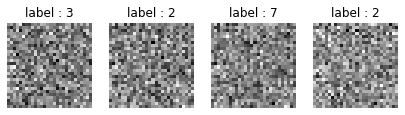

Generator loss: 0.6990597 Discriminator loss: 1.2323492
epoch 0 & 200/235 Result


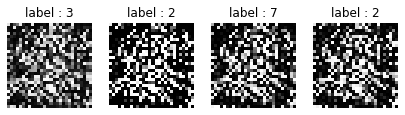

Generator loss: 12.379803 Discriminator loss: 0.016499933
Time for epoch 1 is 3.7966644763946533 sec
epoch 1 & 0/235 Result


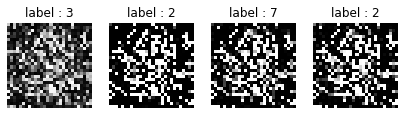

Generator loss: 11.992868 Discriminator loss: 0.020121485
epoch 1 & 200/235 Result


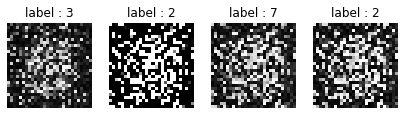

Generator loss: 13.5546465 Discriminator loss: 0.01606991
Time for epoch 2 is 1.600618600845337 sec
epoch 2 & 0/235 Result


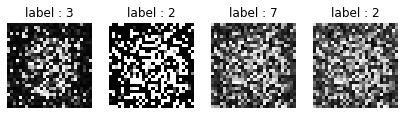

Generator loss: 12.579373 Discriminator loss: 0.0074224775
epoch 2 & 200/235 Result


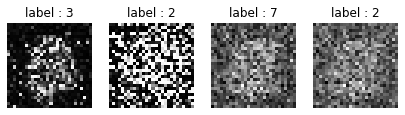

Generator loss: 8.262282 Discriminator loss: 0.043156907
Time for epoch 3 is 1.6433112621307373 sec
epoch 3 & 0/235 Result


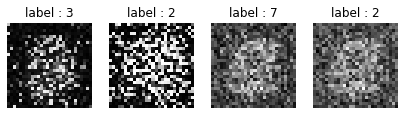

Generator loss: 6.986393 Discriminator loss: 0.0418027
epoch 3 & 200/235 Result


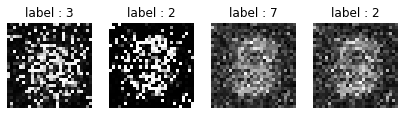

Generator loss: 10.731674 Discriminator loss: 0.016115904
Time for epoch 4 is 1.6206459999084473 sec
epoch 4 & 0/235 Result


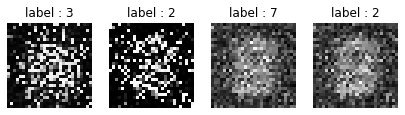

Generator loss: 6.324794 Discriminator loss: 0.06848569
epoch 4 & 200/235 Result


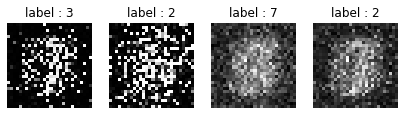

Generator loss: 6.4217863 Discriminator loss: 0.0662062
Time for epoch 5 is 1.608276128768921 sec
epoch 5 & 0/235 Result


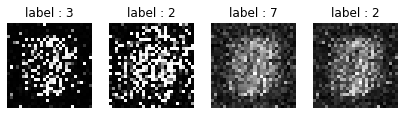

Generator loss: 8.543261 Discriminator loss: 0.2287545
epoch 5 & 200/235 Result


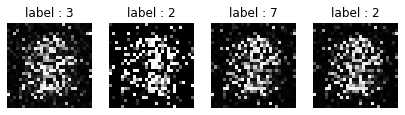

Generator loss: 28.93945 Discriminator loss: 0.14707133
Time for epoch 6 is 1.6380574703216553 sec
epoch 6 & 0/235 Result


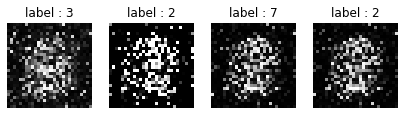

Generator loss: 17.204576 Discriminator loss: 0.11666145
epoch 6 & 200/235 Result


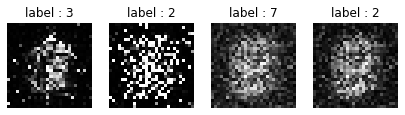

Generator loss: 7.414432 Discriminator loss: 0.19950645
Time for epoch 7 is 1.7702350616455078 sec
epoch 7 & 0/235 Result


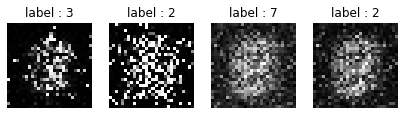

Generator loss: 6.93592 Discriminator loss: 0.05022218
epoch 7 & 200/235 Result


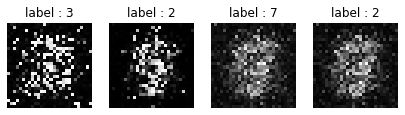

Generator loss: 5.5688396 Discriminator loss: 0.19325298
Time for epoch 8 is 1.5915279388427734 sec
epoch 8 & 0/235 Result


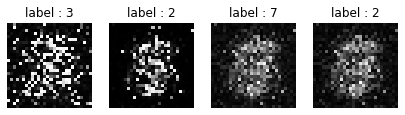

Generator loss: 8.22248 Discriminator loss: 0.09852262
epoch 8 & 200/235 Result


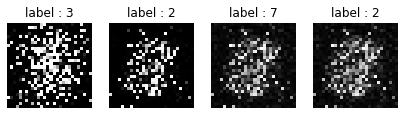

Generator loss: 10.532625 Discriminator loss: 0.07626522
Time for epoch 9 is 1.5659456253051758 sec
epoch 9 & 0/235 Result


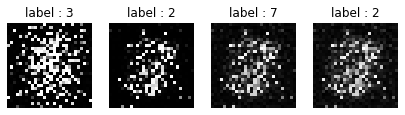

Generator loss: 12.539303 Discriminator loss: 0.08878259
epoch 9 & 200/235 Result


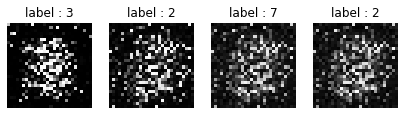

Generator loss: 8.909422 Discriminator loss: 0.1271921
Time for epoch 10 is 1.5947446823120117 sec
epoch 10 & 0/235 Result


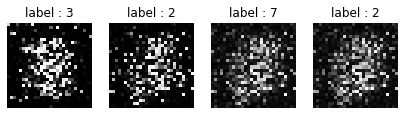

Generator loss: 8.681379 Discriminator loss: 0.19152443
epoch 10 & 200/235 Result


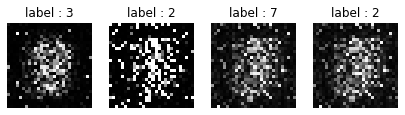

Generator loss: 8.980316 Discriminator loss: 0.15497538
Time for epoch 11 is 1.6094367504119873 sec
epoch 11 & 0/235 Result


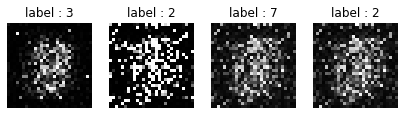

Generator loss: 7.8745184 Discriminator loss: 0.043504134
epoch 11 & 200/235 Result


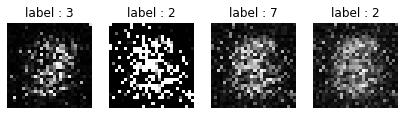

Generator loss: 4.184746 Discriminator loss: 0.25527775
Time for epoch 12 is 1.7932839393615723 sec
epoch 12 & 0/235 Result


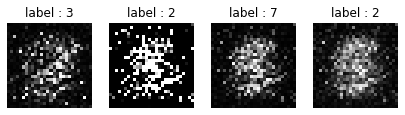

Generator loss: 5.8434763 Discriminator loss: 0.14904803
epoch 12 & 200/235 Result


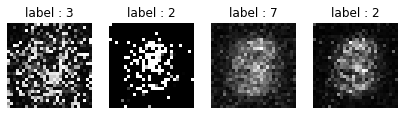

Generator loss: 8.226933 Discriminator loss: 0.11436821
Time for epoch 13 is 1.6194696426391602 sec
epoch 13 & 0/235 Result


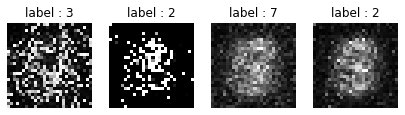

Generator loss: 7.972263 Discriminator loss: 0.08066655
epoch 13 & 200/235 Result


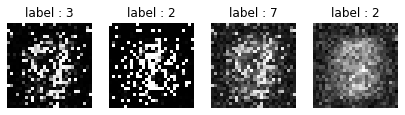

Generator loss: 10.201821 Discriminator loss: 0.19403161
Time for epoch 14 is 1.624603509902954 sec
epoch 14 & 0/235 Result


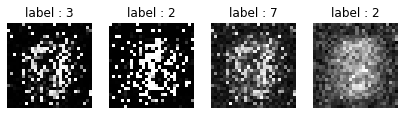

Generator loss: 11.283939 Discriminator loss: 0.10235143
epoch 14 & 200/235 Result


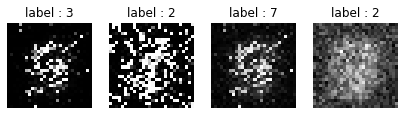

Generator loss: 7.458375 Discriminator loss: 0.09479201
Time for epoch 15 is 1.6051337718963623 sec
epoch 15 & 0/235 Result


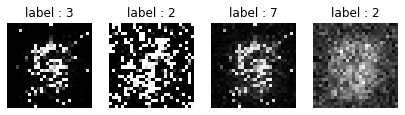

Generator loss: 8.441225 Discriminator loss: 0.084327936
epoch 15 & 200/235 Result


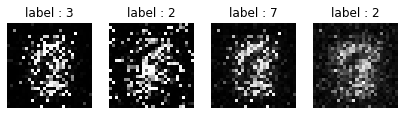

Generator loss: 10.841454 Discriminator loss: 0.12394888
Time for epoch 16 is 1.606654167175293 sec
epoch 16 & 0/235 Result


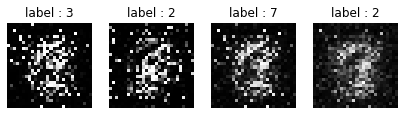

Generator loss: 8.315699 Discriminator loss: 0.1058142
epoch 16 & 200/235 Result


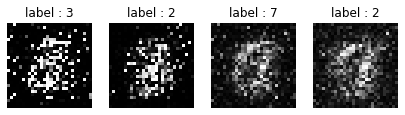

Generator loss: 7.461824 Discriminator loss: 0.0105358865
Time for epoch 17 is 1.7639572620391846 sec
epoch 17 & 0/235 Result


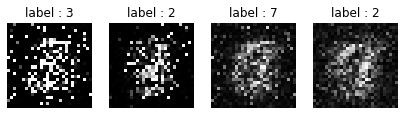

Generator loss: 7.9902244 Discriminator loss: 0.1033137
epoch 17 & 200/235 Result


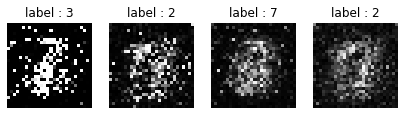

Generator loss: 9.801272 Discriminator loss: 0.19391072
Time for epoch 18 is 1.6347696781158447 sec
epoch 18 & 0/235 Result


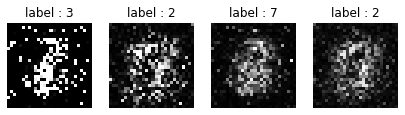

Generator loss: 9.320043 Discriminator loss: 0.058037356
epoch 18 & 200/235 Result


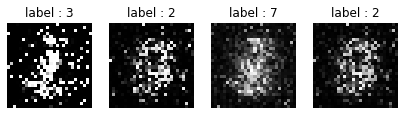

Generator loss: 9.072361 Discriminator loss: 0.16941655
Time for epoch 19 is 1.6321933269500732 sec
epoch 19 & 0/235 Result


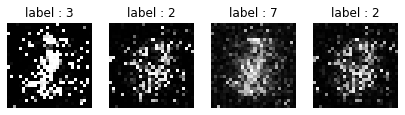

Generator loss: 8.651275 Discriminator loss: 0.11156495
epoch 19 & 200/235 Result


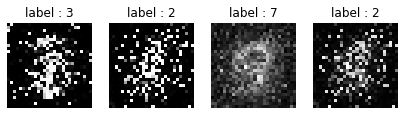

Generator loss: 8.128402 Discriminator loss: 0.14416829
Time for epoch 20 is 1.628047227859497 sec
epoch 20 & 0/235 Result


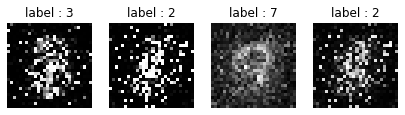

Generator loss: 11.813421 Discriminator loss: 0.1665195
epoch 20 & 200/235 Result


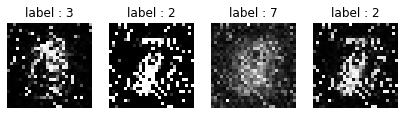

Generator loss: 8.366342 Discriminator loss: 0.061167777
Time for epoch 21 is 1.6442904472351074 sec
epoch 21 & 0/235 Result


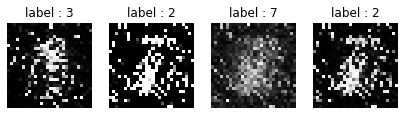

Generator loss: 7.60156 Discriminator loss: 0.120633245
epoch 21 & 200/235 Result


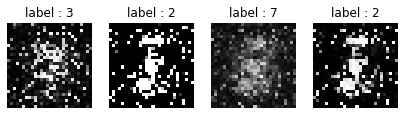

Generator loss: 9.447146 Discriminator loss: 0.13502394
Time for epoch 22 is 1.650163173675537 sec
epoch 22 & 0/235 Result


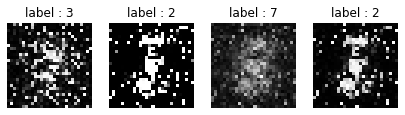

Generator loss: 6.2363167 Discriminator loss: 0.26489696
epoch 22 & 200/235 Result


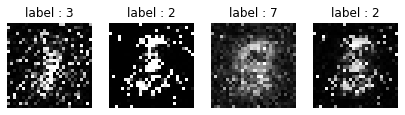

Generator loss: 8.477873 Discriminator loss: 0.06573179
Time for epoch 23 is 1.8388347625732422 sec
epoch 23 & 0/235 Result


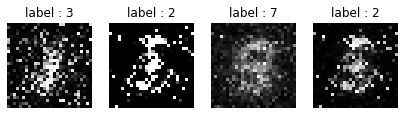

Generator loss: 7.8614144 Discriminator loss: 0.06046358
epoch 23 & 200/235 Result


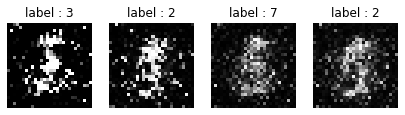

Generator loss: 13.152646 Discriminator loss: 0.11098643
Time for epoch 24 is 1.6358721256256104 sec
epoch 24 & 0/235 Result


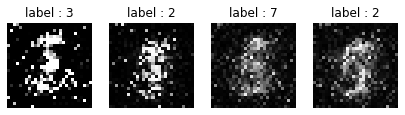

Generator loss: 9.175781 Discriminator loss: 0.23628886
epoch 24 & 200/235 Result


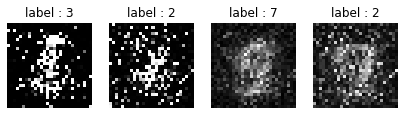

Generator loss: 7.114999 Discriminator loss: 0.14362301
Time for epoch 25 is 1.6681430339813232 sec
epoch 25 & 0/235 Result


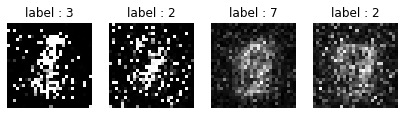

Generator loss: 6.9645886 Discriminator loss: 0.1447215
epoch 25 & 200/235 Result


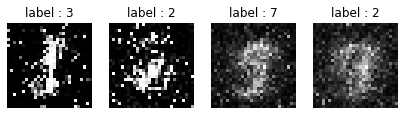

Generator loss: 10.725304 Discriminator loss: 0.118088126
Time for epoch 26 is 1.643876314163208 sec
epoch 26 & 0/235 Result


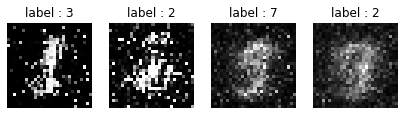

Generator loss: 6.5761256 Discriminator loss: 0.24333858
epoch 26 & 200/235 Result


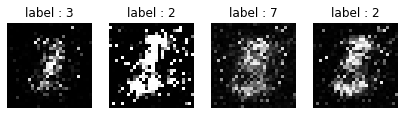

Generator loss: 21.622456 Discriminator loss: 0.20603183
Time for epoch 27 is 1.6541919708251953 sec
epoch 27 & 0/235 Result


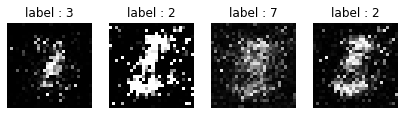

Generator loss: 11.85685 Discriminator loss: 0.15491858
epoch 27 & 200/235 Result


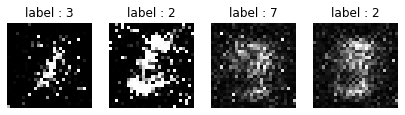

Generator loss: 8.689001 Discriminator loss: 0.1801103
Time for epoch 28 is 1.8289461135864258 sec
epoch 28 & 0/235 Result


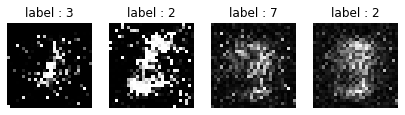

Generator loss: 7.8023148 Discriminator loss: 0.17366545
epoch 28 & 200/235 Result


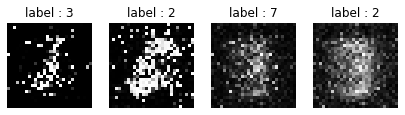

Generator loss: 7.6208677 Discriminator loss: 0.06718399
Time for epoch 29 is 1.6572539806365967 sec
epoch 29 & 0/235 Result


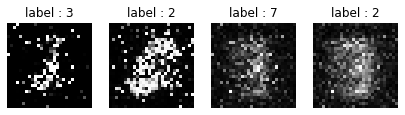

Generator loss: 7.4620337 Discriminator loss: 0.1606311
epoch 29 & 200/235 Result


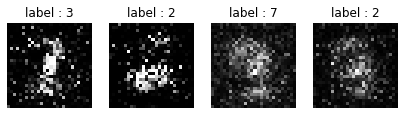

Generator loss: 7.7574115 Discriminator loss: 0.235293
Time for epoch 30 is 1.660815954208374 sec
epoch 30 & 0/235 Result


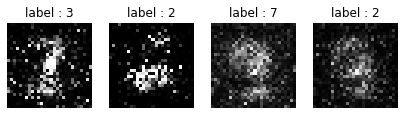

Generator loss: 6.9079533 Discriminator loss: 0.18095797
epoch 30 & 200/235 Result


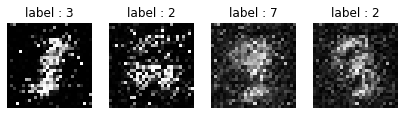

Generator loss: 8.660464 Discriminator loss: 0.16091757
Time for epoch 31 is 1.659886360168457 sec
epoch 31 & 0/235 Result


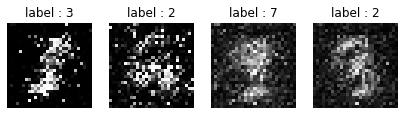

Generator loss: 7.2105913 Discriminator loss: 0.14573249
epoch 31 & 200/235 Result


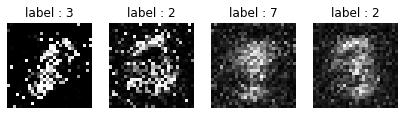

Generator loss: 8.834845 Discriminator loss: 0.11838769
Time for epoch 32 is 1.6280944347381592 sec
epoch 32 & 0/235 Result


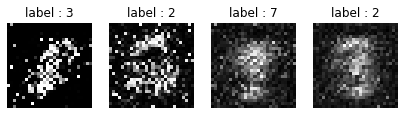

Generator loss: 10.963889 Discriminator loss: 0.18237324
epoch 32 & 200/235 Result


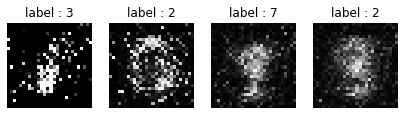

Generator loss: 9.6948395 Discriminator loss: 0.18178691
Time for epoch 33 is 1.634272575378418 sec
epoch 33 & 0/235 Result


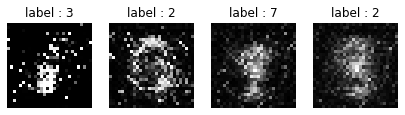

Generator loss: 6.8895435 Discriminator loss: 0.21347974
epoch 33 & 200/235 Result


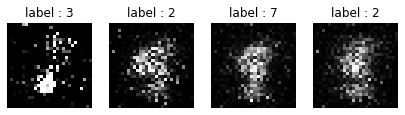

Generator loss: 8.083187 Discriminator loss: 0.4701535
Time for epoch 34 is 1.7861557006835938 sec
epoch 34 & 0/235 Result


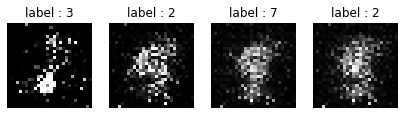

Generator loss: 6.603685 Discriminator loss: 0.20534724
epoch 34 & 200/235 Result


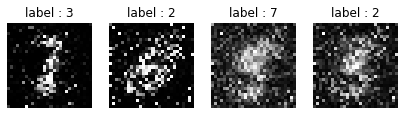

Generator loss: 8.659277 Discriminator loss: 0.0787591
Time for epoch 35 is 1.6280274391174316 sec
epoch 35 & 0/235 Result


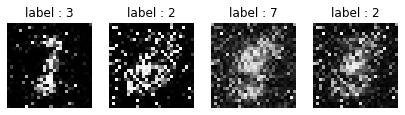

Generator loss: 8.414399 Discriminator loss: 0.115211405
epoch 35 & 200/235 Result


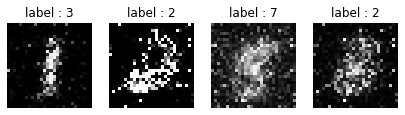

Generator loss: 7.8408313 Discriminator loss: 0.16320996
Time for epoch 36 is 1.649831771850586 sec
epoch 36 & 0/235 Result


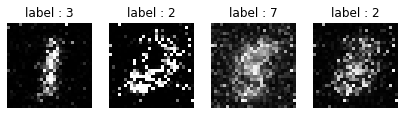

Generator loss: 7.8223805 Discriminator loss: 0.12721317
epoch 36 & 200/235 Result


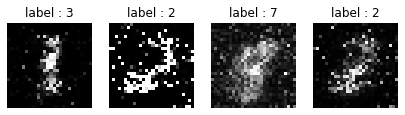

Generator loss: 6.8348136 Discriminator loss: 0.08806815
Time for epoch 37 is 1.626969575881958 sec
epoch 37 & 0/235 Result


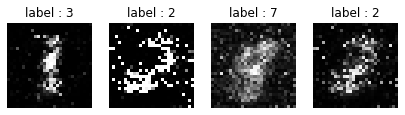

Generator loss: 7.3389015 Discriminator loss: 0.13499945
epoch 37 & 200/235 Result


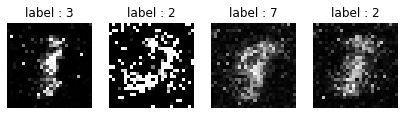

Generator loss: 6.194018 Discriminator loss: 0.13434444
Time for epoch 38 is 1.6435625553131104 sec
epoch 38 & 0/235 Result


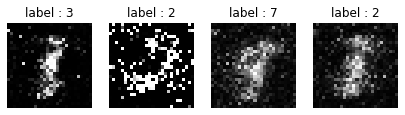

Generator loss: 7.827995 Discriminator loss: 0.18723634
epoch 38 & 200/235 Result


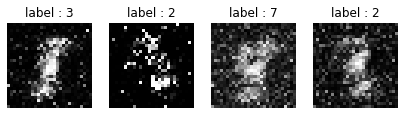

Generator loss: 11.536417 Discriminator loss: 0.30106497
Time for epoch 39 is 1.800276279449463 sec
epoch 39 & 0/235 Result


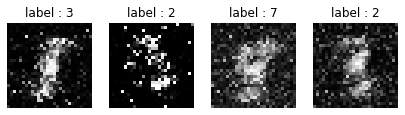

Generator loss: 6.98487 Discriminator loss: 0.20062795
epoch 39 & 200/235 Result


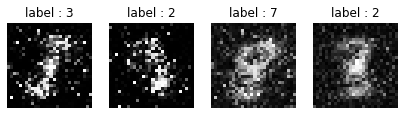

Generator loss: 7.2822623 Discriminator loss: 0.11368141
Time for epoch 40 is 1.6501388549804688 sec
epoch 40 & 0/235 Result


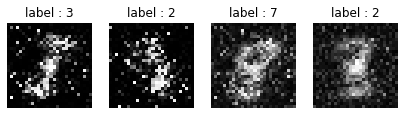

Generator loss: 7.985252 Discriminator loss: 0.13321127
epoch 40 & 200/235 Result


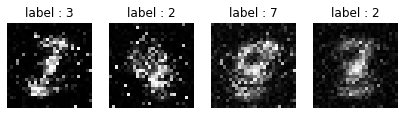

Generator loss: 6.05725 Discriminator loss: 0.13473731
Time for epoch 41 is 1.6552526950836182 sec
epoch 41 & 0/235 Result


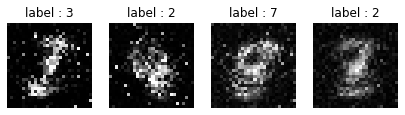

Generator loss: 5.546987 Discriminator loss: 0.130452
epoch 41 & 200/235 Result


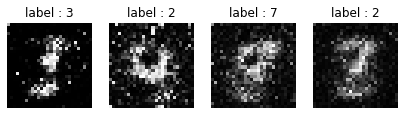

Generator loss: 5.7431736 Discriminator loss: 0.54287803
Time for epoch 42 is 1.6794860363006592 sec
epoch 42 & 0/235 Result


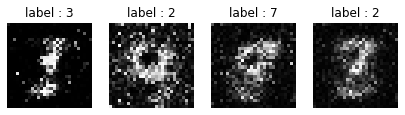

Generator loss: 6.899999 Discriminator loss: 0.18173827
epoch 42 & 200/235 Result


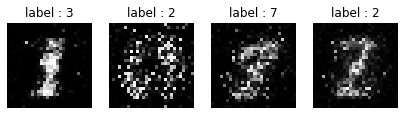

Generator loss: 4.7423983 Discriminator loss: 0.27497566
Time for epoch 43 is 1.704394817352295 sec
epoch 43 & 0/235 Result


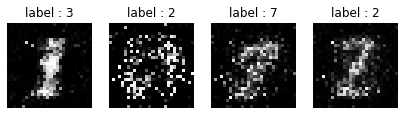

Generator loss: 5.384492 Discriminator loss: 0.25727773
epoch 43 & 200/235 Result


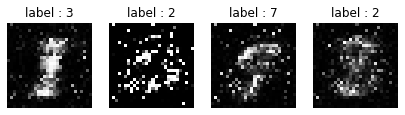

Generator loss: 4.6831365 Discriminator loss: 0.23905367
Time for epoch 44 is 1.6677477359771729 sec
epoch 44 & 0/235 Result


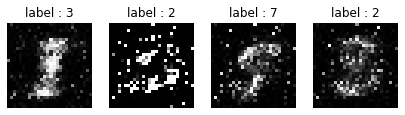

Generator loss: 5.636229 Discriminator loss: 0.19754764
epoch 44 & 200/235 Result


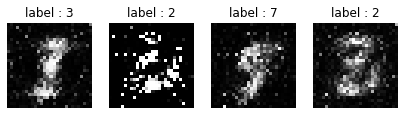

Generator loss: 3.7953029 Discriminator loss: 0.3735186
Time for epoch 45 is 1.8143274784088135 sec
epoch 45 & 0/235 Result


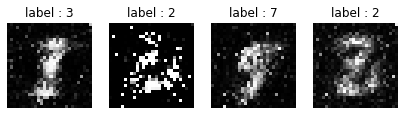

Generator loss: 5.192397 Discriminator loss: 0.19589867
epoch 45 & 200/235 Result


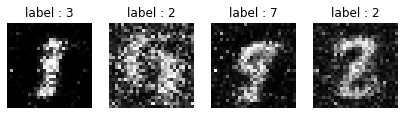

Generator loss: 5.200696 Discriminator loss: 0.31559446
Time for epoch 46 is 1.679853916168213 sec
epoch 46 & 0/235 Result


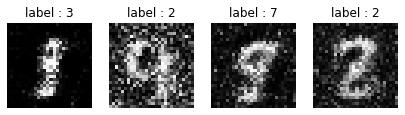

Generator loss: 5.107271 Discriminator loss: 0.28354278
epoch 46 & 200/235 Result


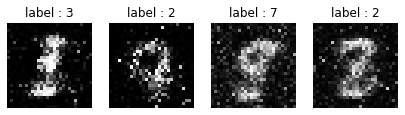

Generator loss: 4.689871 Discriminator loss: 0.2822911
Time for epoch 47 is 1.646486759185791 sec
epoch 47 & 0/235 Result


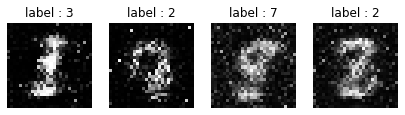

Generator loss: 7.0539374 Discriminator loss: 0.21008106
epoch 47 & 200/235 Result


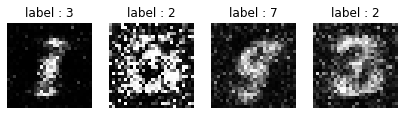

Generator loss: 5.8734684 Discriminator loss: 0.16095269
Time for epoch 48 is 1.6430554389953613 sec
epoch 48 & 0/235 Result


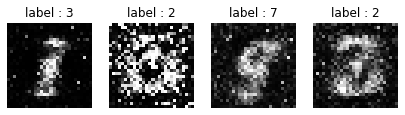

Generator loss: 5.800352 Discriminator loss: 0.32164425
epoch 48 & 200/235 Result


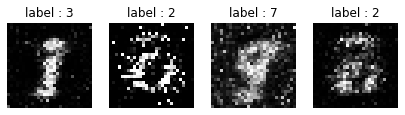

Generator loss: 4.5464983 Discriminator loss: 0.23096478
Time for epoch 49 is 1.6116559505462646 sec
epoch 49 & 0/235 Result


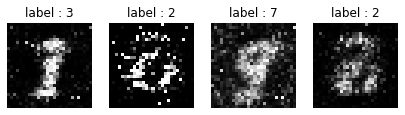

Generator loss: 6.092776 Discriminator loss: 0.18507616
epoch 49 & 200/235 Result


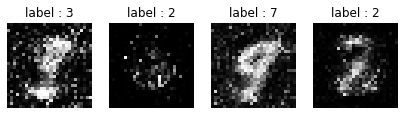

Generator loss: 4.8489823 Discriminator loss: 0.45686767
Time for epoch 50 is 1.7905025482177734 sec
epoch 50 & 0/235 Result


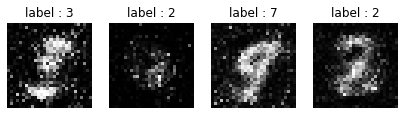

Generator loss: 5.062038 Discriminator loss: 0.28211772
epoch 50 & 200/235 Result


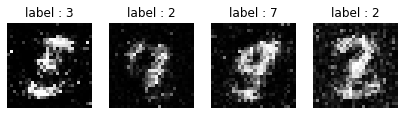

Generator loss: 5.1738796 Discriminator loss: 0.34859002
Time for epoch 51 is 1.6317317485809326 sec
epoch 51 & 0/235 Result


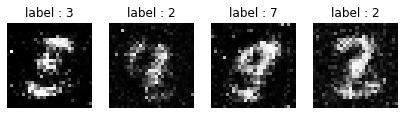

Generator loss: 4.794768 Discriminator loss: 0.2051208
epoch 51 & 200/235 Result


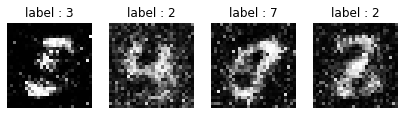

Generator loss: 3.8649607 Discriminator loss: 0.3260821
Time for epoch 52 is 1.6074988842010498 sec
epoch 52 & 0/235 Result


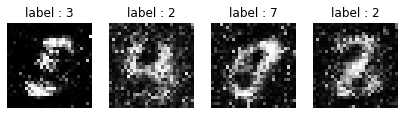

Generator loss: 5.0446677 Discriminator loss: 0.1954559
epoch 52 & 200/235 Result


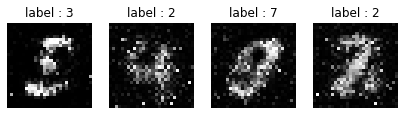

Generator loss: 5.5622096 Discriminator loss: 0.24186286
Time for epoch 53 is 1.630659580230713 sec
epoch 53 & 0/235 Result


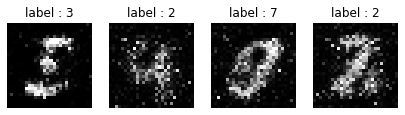

Generator loss: 6.052304 Discriminator loss: 0.1393274
epoch 53 & 200/235 Result


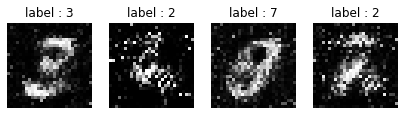

Generator loss: 3.9661546 Discriminator loss: 0.32501093
Time for epoch 54 is 1.6464753150939941 sec
epoch 54 & 0/235 Result


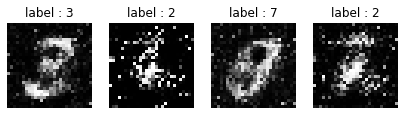

Generator loss: 4.6008964 Discriminator loss: 0.14249733
epoch 54 & 200/235 Result


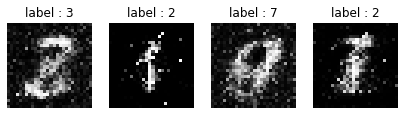

Generator loss: 5.384124 Discriminator loss: 0.2893563
Time for epoch 55 is 1.6498217582702637 sec
epoch 55 & 0/235 Result


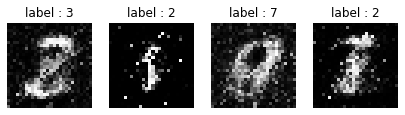

Generator loss: 3.9448714 Discriminator loss: 0.2791916
epoch 55 & 200/235 Result


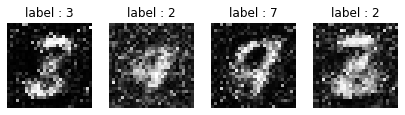

Generator loss: 5.873139 Discriminator loss: 0.19865835
Time for epoch 56 is 1.8138000965118408 sec
epoch 56 & 0/235 Result


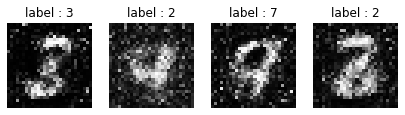

Generator loss: 5.067912 Discriminator loss: 0.26827252
epoch 56 & 200/235 Result


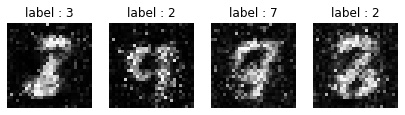

Generator loss: 4.6730294 Discriminator loss: 0.3369115
Time for epoch 57 is 1.6822643280029297 sec
epoch 57 & 0/235 Result


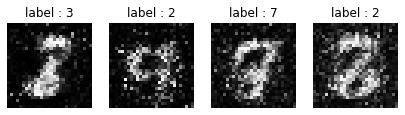

Generator loss: 5.2514434 Discriminator loss: 0.4100614
epoch 57 & 200/235 Result


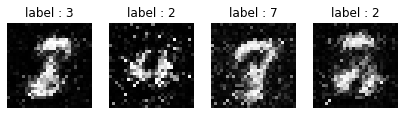

Generator loss: 4.7196174 Discriminator loss: 0.29980898
Time for epoch 58 is 1.6675403118133545 sec
epoch 58 & 0/235 Result


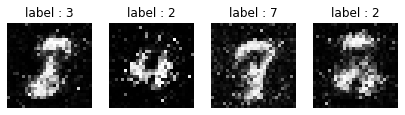

Generator loss: 3.0081968 Discriminator loss: 0.4061393
epoch 58 & 200/235 Result


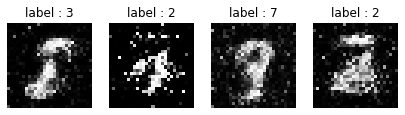

Generator loss: 5.4761877 Discriminator loss: 0.28531307
Time for epoch 59 is 1.629957675933838 sec
epoch 59 & 0/235 Result


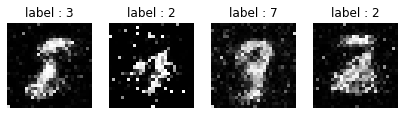

Generator loss: 5.006608 Discriminator loss: 0.18671474
epoch 59 & 200/235 Result


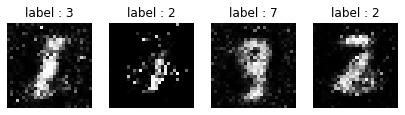

Generator loss: 5.1942945 Discriminator loss: 0.31955364
Time for epoch 60 is 1.6326355934143066 sec
epoch 60 & 0/235 Result


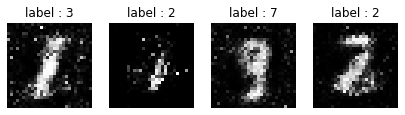

Generator loss: 3.7878108 Discriminator loss: 0.34408408
epoch 60 & 200/235 Result


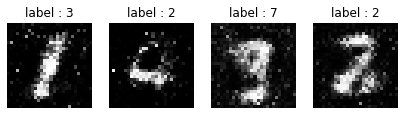

Generator loss: 3.7455502 Discriminator loss: 0.33594415
Time for epoch 61 is 1.7982127666473389 sec
epoch 61 & 0/235 Result


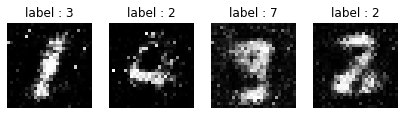

Generator loss: 4.3532953 Discriminator loss: 0.25763574
epoch 61 & 200/235 Result


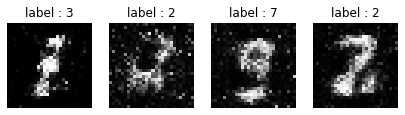

Generator loss: 3.3679008 Discriminator loss: 0.38792348
Time for epoch 62 is 1.7771925926208496 sec
epoch 62 & 0/235 Result


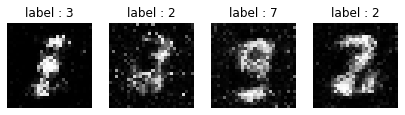

Generator loss: 3.2456422 Discriminator loss: 0.37015083
epoch 62 & 200/235 Result


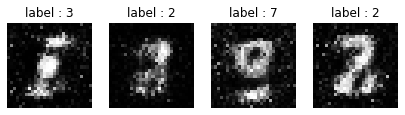

Generator loss: 4.327963 Discriminator loss: 0.3712008
Time for epoch 63 is 1.6897656917572021 sec
epoch 63 & 0/235 Result


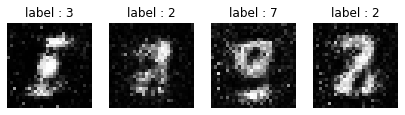

Generator loss: 3.5865083 Discriminator loss: 0.30964482
epoch 63 & 200/235 Result


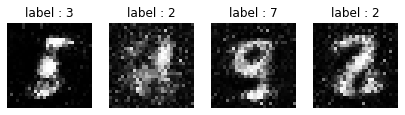

Generator loss: 2.6918154 Discriminator loss: 0.4460387
Time for epoch 64 is 1.7032229900360107 sec
epoch 64 & 0/235 Result


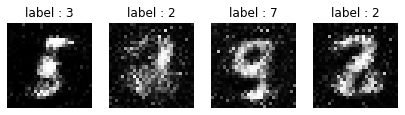

Generator loss: 3.7034817 Discriminator loss: 0.4163155
epoch 64 & 200/235 Result


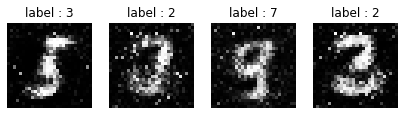

Generator loss: 3.458116 Discriminator loss: 0.3002937
Time for epoch 65 is 1.6879396438598633 sec
epoch 65 & 0/235 Result


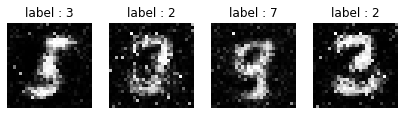

Generator loss: 3.4166198 Discriminator loss: 0.36915654
epoch 65 & 200/235 Result


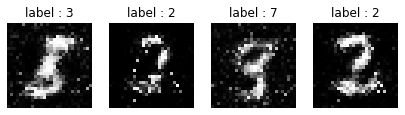

Generator loss: 2.9290314 Discriminator loss: 0.42353034
Time for epoch 66 is 1.6461596488952637 sec
epoch 66 & 0/235 Result


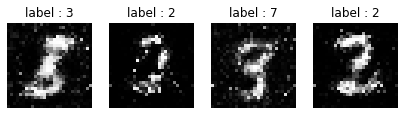

Generator loss: 3.596364 Discriminator loss: 0.38972908
epoch 66 & 200/235 Result


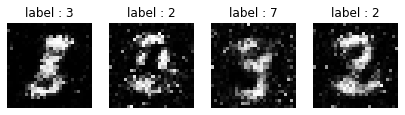

Generator loss: 3.0328748 Discriminator loss: 0.50528586
Time for epoch 67 is 1.8517227172851562 sec
epoch 67 & 0/235 Result


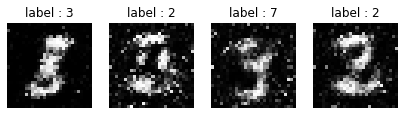

Generator loss: 3.038131 Discriminator loss: 0.31129384
epoch 67 & 200/235 Result


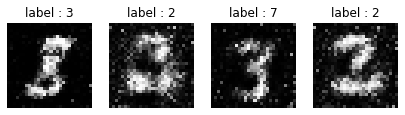

Generator loss: 3.5587704 Discriminator loss: 0.36997724
Time for epoch 68 is 1.638833999633789 sec
epoch 68 & 0/235 Result


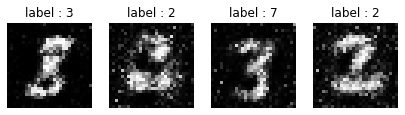

Generator loss: 2.8242214 Discriminator loss: 0.5249775
epoch 68 & 200/235 Result


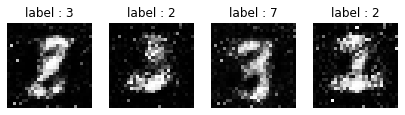

Generator loss: 3.0756552 Discriminator loss: 0.521647
Time for epoch 69 is 1.6568400859832764 sec
epoch 69 & 0/235 Result


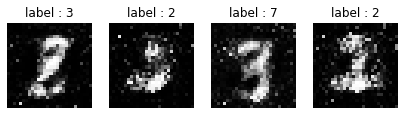

Generator loss: 2.7534223 Discriminator loss: 0.48270327
epoch 69 & 200/235 Result


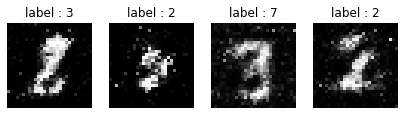

Generator loss: 3.2928739 Discriminator loss: 0.55643845
Time for epoch 70 is 1.6326029300689697 sec
epoch 70 & 0/235 Result


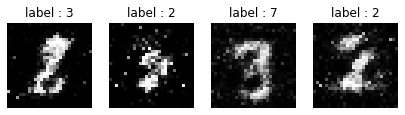

Generator loss: 3.6268704 Discriminator loss: 0.35576057
epoch 70 & 200/235 Result


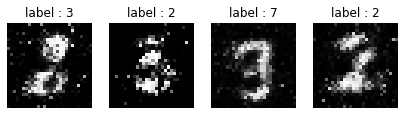

Generator loss: 3.37167 Discriminator loss: 0.3695618
Time for epoch 71 is 1.69411301612854 sec
epoch 71 & 0/235 Result


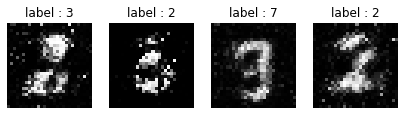

Generator loss: 3.176786 Discriminator loss: 0.30447018
epoch 71 & 200/235 Result


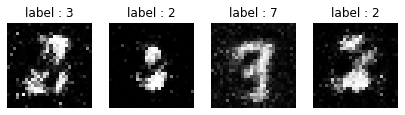

Generator loss: 4.0059185 Discriminator loss: 0.4268781
Time for epoch 72 is 1.85725998878479 sec
epoch 72 & 0/235 Result


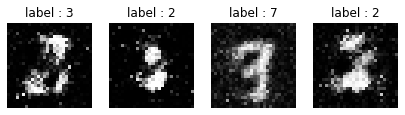

Generator loss: 4.219333 Discriminator loss: 0.3080573
epoch 72 & 200/235 Result


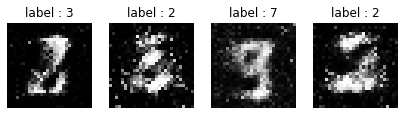

Generator loss: 2.8119721 Discriminator loss: 0.4790351
Time for epoch 73 is 1.738274335861206 sec
epoch 73 & 0/235 Result


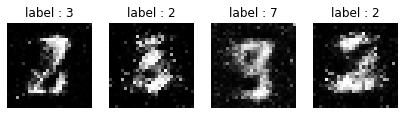

Generator loss: 3.001877 Discriminator loss: 0.39100498
epoch 73 & 200/235 Result


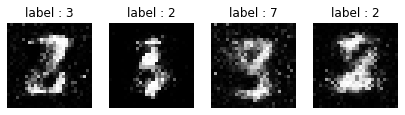

Generator loss: 3.3603654 Discriminator loss: 0.45818555
Time for epoch 74 is 1.6774818897247314 sec
epoch 74 & 0/235 Result


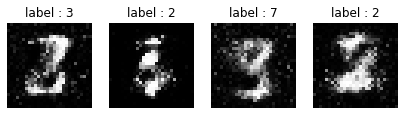

Generator loss: 2.9071774 Discriminator loss: 0.40534928
epoch 74 & 200/235 Result


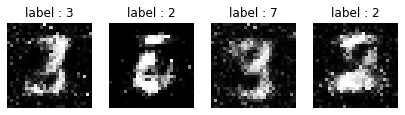

Generator loss: 3.3148923 Discriminator loss: 0.43425643
Time for epoch 75 is 1.7046403884887695 sec
epoch 75 & 0/235 Result


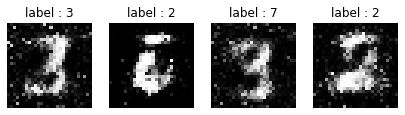

Generator loss: 3.5097728 Discriminator loss: 0.39880696
epoch 75 & 200/235 Result


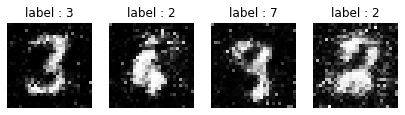

Generator loss: 3.4274056 Discriminator loss: 0.41468173
Time for epoch 76 is 1.6569969654083252 sec
epoch 76 & 0/235 Result


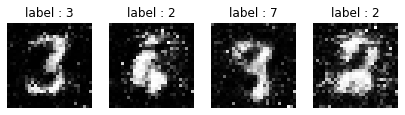

Generator loss: 3.1935241 Discriminator loss: 0.33787122
epoch 76 & 200/235 Result


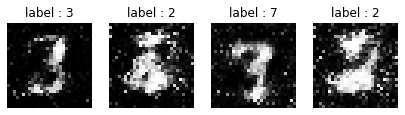

Generator loss: 3.7698126 Discriminator loss: 0.4012831
Time for epoch 77 is 1.6581385135650635 sec
epoch 77 & 0/235 Result


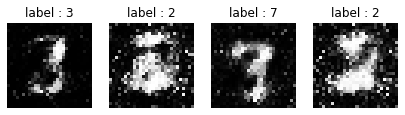

Generator loss: 3.6042125 Discriminator loss: 0.48622975
epoch 77 & 200/235 Result


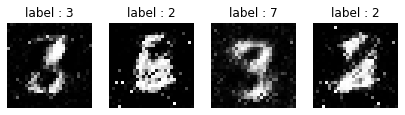

Generator loss: 2.4372308 Discriminator loss: 0.4014989
Time for epoch 78 is 1.8494689464569092 sec
epoch 78 & 0/235 Result


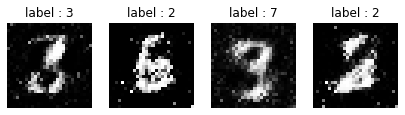

Generator loss: 3.0304215 Discriminator loss: 0.50209224
epoch 78 & 200/235 Result


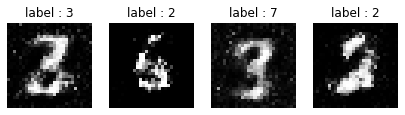

Generator loss: 2.5231752 Discriminator loss: 0.62889445
Time for epoch 79 is 1.6702783107757568 sec
epoch 79 & 0/235 Result


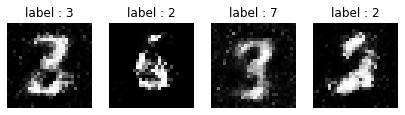

Generator loss: 2.691404 Discriminator loss: 0.49148142
epoch 79 & 200/235 Result


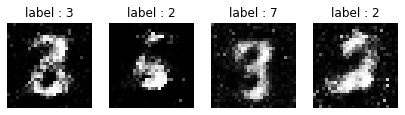

Generator loss: 2.642385 Discriminator loss: 0.5649271
Time for epoch 80 is 1.6918036937713623 sec
epoch 80 & 0/235 Result


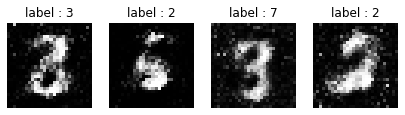

Generator loss: 2.427536 Discriminator loss: 0.5388183
epoch 80 & 200/235 Result


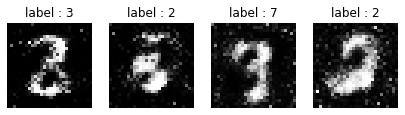

Generator loss: 2.665246 Discriminator loss: 0.74502444
Time for epoch 81 is 1.6573715209960938 sec
epoch 81 & 0/235 Result


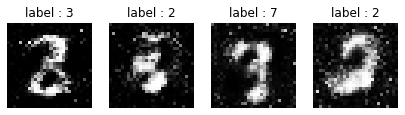

Generator loss: 2.5947886 Discriminator loss: 0.5866704
epoch 81 & 200/235 Result


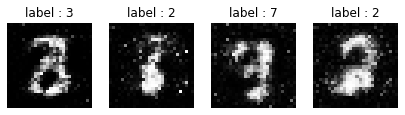

Generator loss: 2.5578728 Discriminator loss: 0.5617237
Time for epoch 82 is 1.678657054901123 sec
epoch 82 & 0/235 Result


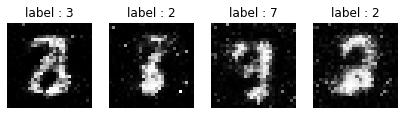

Generator loss: 2.5709229 Discriminator loss: 0.54554546
epoch 82 & 200/235 Result


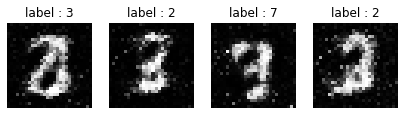

Generator loss: 2.8339899 Discriminator loss: 0.55267817
Time for epoch 83 is 1.8260159492492676 sec
epoch 83 & 0/235 Result


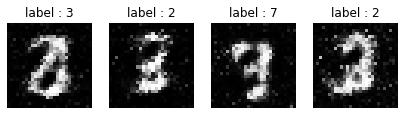

Generator loss: 2.5206993 Discriminator loss: 0.5538114
epoch 83 & 200/235 Result


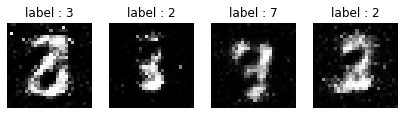

Generator loss: 3.36495 Discriminator loss: 0.49518153
Time for epoch 84 is 1.605527400970459 sec
epoch 84 & 0/235 Result


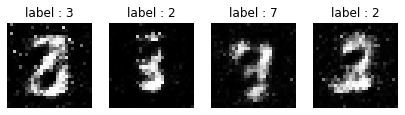

Generator loss: 2.013018 Discriminator loss: 0.72378683
epoch 84 & 200/235 Result


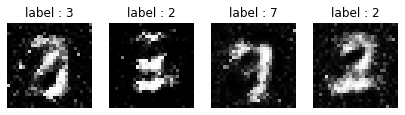

Generator loss: 2.582158 Discriminator loss: 0.48367536
Time for epoch 85 is 1.603501796722412 sec
epoch 85 & 0/235 Result


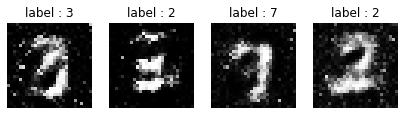

Generator loss: 2.52215 Discriminator loss: 0.53194076
epoch 85 & 200/235 Result


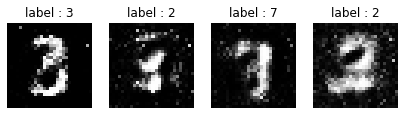

Generator loss: 2.3962204 Discriminator loss: 0.6690612
Time for epoch 86 is 1.5740461349487305 sec
epoch 86 & 0/235 Result


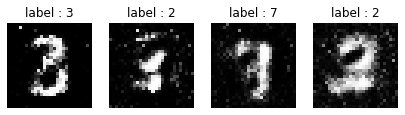

Generator loss: 2.8214402 Discriminator loss: 0.59862983
epoch 86 & 200/235 Result


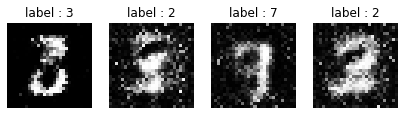

Generator loss: 2.6089163 Discriminator loss: 0.687255
Time for epoch 87 is 1.6096253395080566 sec
epoch 87 & 0/235 Result


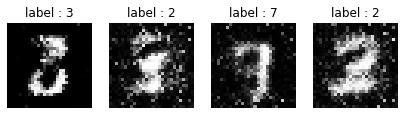

Generator loss: 2.510691 Discriminator loss: 0.5173947
epoch 87 & 200/235 Result


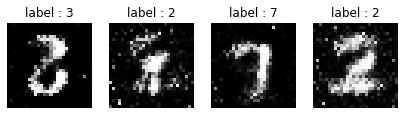

Generator loss: 3.2508814 Discriminator loss: 0.592602
Time for epoch 88 is 1.6547551155090332 sec
epoch 88 & 0/235 Result


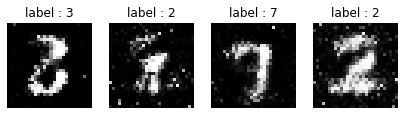

Generator loss: 1.9928755 Discriminator loss: 0.59865236
epoch 88 & 200/235 Result


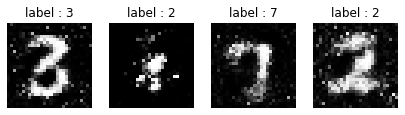

Generator loss: 3.113125 Discriminator loss: 0.4752365
Time for epoch 89 is 1.8301498889923096 sec
epoch 89 & 0/235 Result


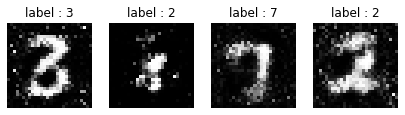

Generator loss: 3.3501594 Discriminator loss: 0.51387197
epoch 89 & 200/235 Result


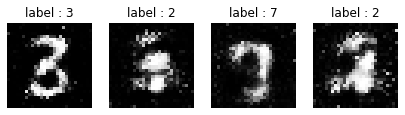

Generator loss: 2.0595145 Discriminator loss: 0.57196164
Time for epoch 90 is 1.6690750122070312 sec
epoch 90 & 0/235 Result


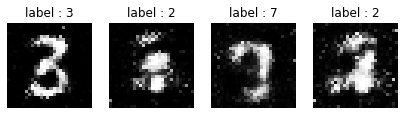

Generator loss: 2.2765539 Discriminator loss: 0.9341239
epoch 90 & 200/235 Result


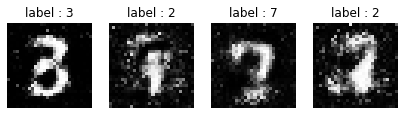

Generator loss: 2.465769 Discriminator loss: 0.5469129
Time for epoch 91 is 1.66731858253479 sec
epoch 91 & 0/235 Result


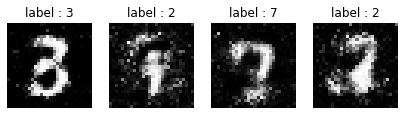

Generator loss: 2.4644766 Discriminator loss: 0.7255573
epoch 91 & 200/235 Result


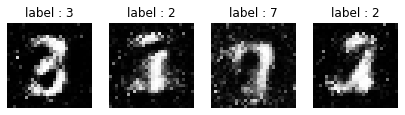

Generator loss: 2.2576292 Discriminator loss: 0.76978254
Time for epoch 92 is 1.676042079925537 sec
epoch 92 & 0/235 Result


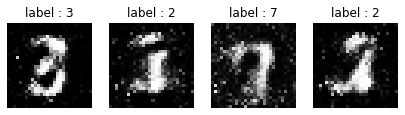

Generator loss: 2.2072544 Discriminator loss: 0.6568818
epoch 92 & 200/235 Result


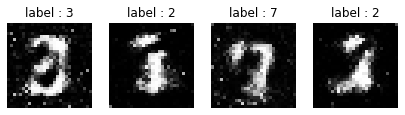

Generator loss: 2.666965 Discriminator loss: 0.66868895
Time for epoch 93 is 1.6874310970306396 sec
epoch 93 & 0/235 Result


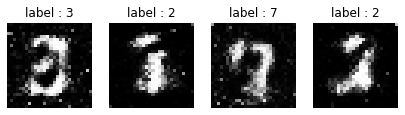

Generator loss: 2.604393 Discriminator loss: 0.46015424
epoch 93 & 200/235 Result


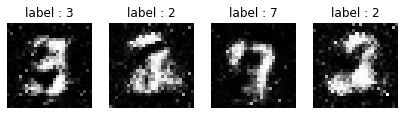

Generator loss: 2.326458 Discriminator loss: 0.7330221
Time for epoch 94 is 1.8378193378448486 sec
epoch 94 & 0/235 Result


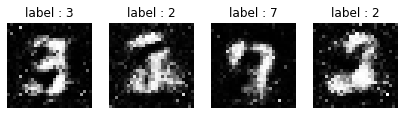

Generator loss: 2.6864998 Discriminator loss: 0.5581162
epoch 94 & 200/235 Result


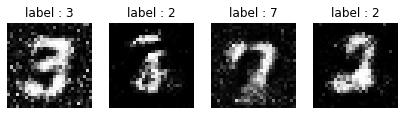

Generator loss: 2.4113338 Discriminator loss: 0.7840948
Time for epoch 95 is 1.6798865795135498 sec
epoch 95 & 0/235 Result


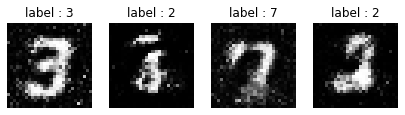

Generator loss: 2.4891195 Discriminator loss: 0.7029735
epoch 95 & 200/235 Result


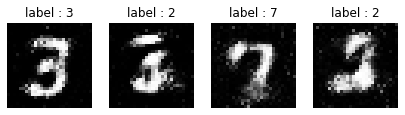

Generator loss: 1.6662698 Discriminator loss: 0.8180902
Time for epoch 96 is 1.6730022430419922 sec
epoch 96 & 0/235 Result


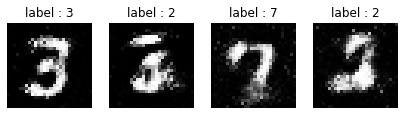

Generator loss: 1.8720646 Discriminator loss: 0.74424523
epoch 96 & 200/235 Result


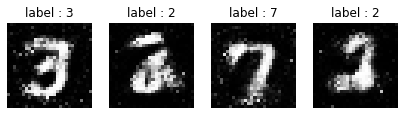

Generator loss: 2.425778 Discriminator loss: 0.74781054
Time for epoch 97 is 1.721790075302124 sec
epoch 97 & 0/235 Result


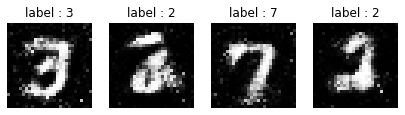

Generator loss: 1.9141188 Discriminator loss: 0.62762463
epoch 97 & 200/235 Result


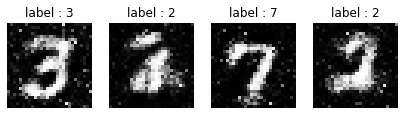

Generator loss: 2.335552 Discriminator loss: 0.5479689
Time for epoch 98 is 1.6685810089111328 sec
epoch 98 & 0/235 Result


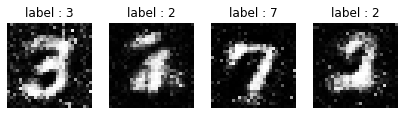

Generator loss: 2.2311397 Discriminator loss: 0.5507121
epoch 98 & 200/235 Result


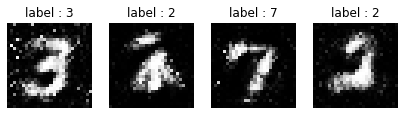

Generator loss: 1.888845 Discriminator loss: 0.60258263
Time for epoch 99 is 1.6421747207641602 sec
epoch 99 & 0/235 Result


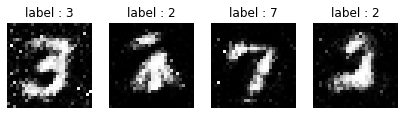

Generator loss: 2.1174016 Discriminator loss: 0.64500356
epoch 99 & 200/235 Result


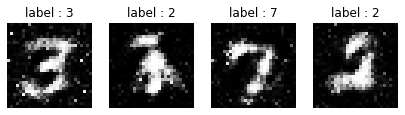

Generator loss: 2.37608 Discriminator loss: 0.61402655
Time for epoch 100 is 2.0093462467193604 sec
CPU times: user 2min 56s, sys: 20.8 s, total: 3min 16s
Wall time: 2min 50s


In [ ]:
# 학습!!!
%%time

g_losses, d_losses = train(train_dataset, EPOCHS)

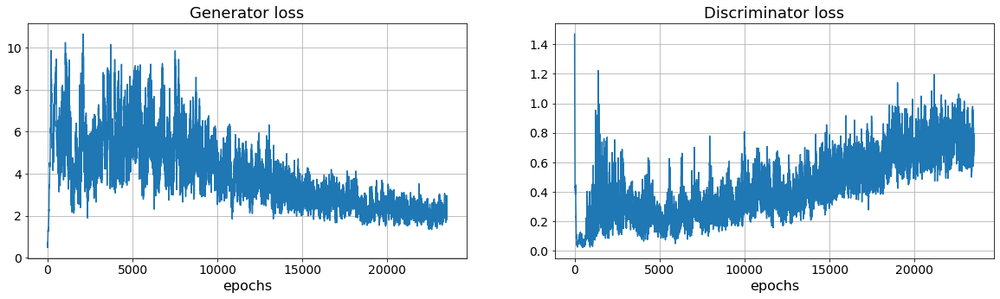

In [ ]:
import matplotlib.pyplot as plt 

plt.figure(figsize= (20,5)) 
plt.subplots_adjust(wspace = 0.2)

plt.subplot(1,2,1)  
plt.title("Generator loss",fontsize = 18) 
plt.plot(g_losses) 
plt.grid() 
plt.xlabel("epochs", fontsize = 16)          
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)


plt.subplot(1,2,2)
plt.title("Discriminator loss", fontsize = 18)
plt.plot(d_losses)
plt.grid()
plt.xlabel("epochs", fontsize = 16)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

plt.show()

- 결과를 확인해 보면 3과 7은 어느정도 모양이 보인다. 
- loss를 확인해보면  Generator loss는 줄어드는 방향으로 움직이고 Discriminator loss는 커지는 방향으로 움직인다.

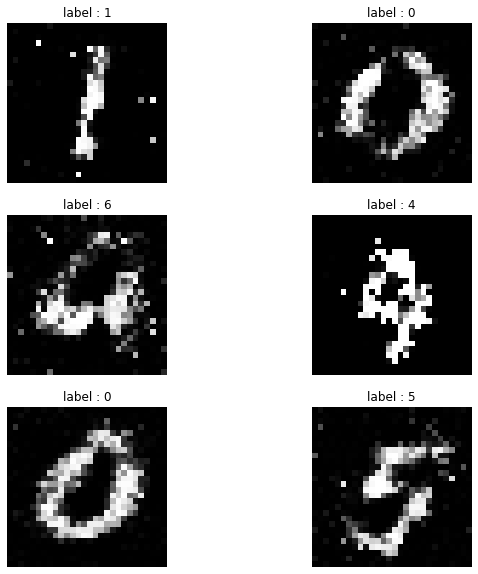

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기

import matplotlib.pyplot as plt

noises = tf.random.normal([50, 100])
test_number = tf.random.uniform(shape=(50,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)

generated_image = G([noises,test_con], training=False)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,10))

for ax in axes.flat:
  ax.axis('off')

axes[0,0].imshow(generated_image[0], cmap='gray')
axes[0,0].set_title(f'label : {test_number[0]}')
axes[0,1].imshow(generated_image[1], cmap='gray')
axes[0,1].set_title(f'label : {test_number[1]}')
axes[1,0].imshow(generated_image[2], cmap='gray')
axes[1,0].set_title(f'label : {test_number[2]}')
axes[1,1].imshow(generated_image[3], cmap='gray')
axes[1,1].set_title(f'label : {test_number[3]}')
axes[2,0].imshow(generated_image[4], cmap='gray')
axes[2,0].set_title(f'label : {test_number[4]}')
axes[2,1].imshow(generated_image[5], cmap='gray')
axes[2,1].set_title(f'label : {test_number[5]}')

plt.show()

- 1 , 0 , 5 는 어느정도 모습이 보인다.

## Convolution layer model

In [ ]:
input_z = tf.keras.Input(shape = (100,))

input_con = tf.keras.Input(shape = (10,))

gen = tf.keras.layers.Concatenate()([input_z, input_con])
gen = tf.keras.layers.Dense(7 * 7 * 256, use_bias = False)(gen)   
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Reshape(target_shape=(7, 7 ,256))(gen)         
gen = tf.keras.layers.Conv2DTranspose(128, (5,5), strides=(1,1), padding='same', use_bias =False)(gen)  
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias =False)(gen)     
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Conv2DTranspose(1, (5,5), strides=(2,2), padding='same', use_bias =False, activation='tanh')(gen)  
gen_out = tf.keras.layers.Reshape(target_shape=(28, 28))(gen)   # 28x28 크기 gray 영상으로 크기 변환

G = tf.keras.Model(inputs = [input_z , input_con], outputs = gen_out)

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_14 (InputLayer)           [(None, 10)]         0                                            
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 110)          0           input_13[0][0]                   
                                                                 input_14[0][0]                   
__________________________________________________________________________________________________
dense_17 (Dense)                (None, 12544)        1379840     concatenate_6[0][0]        

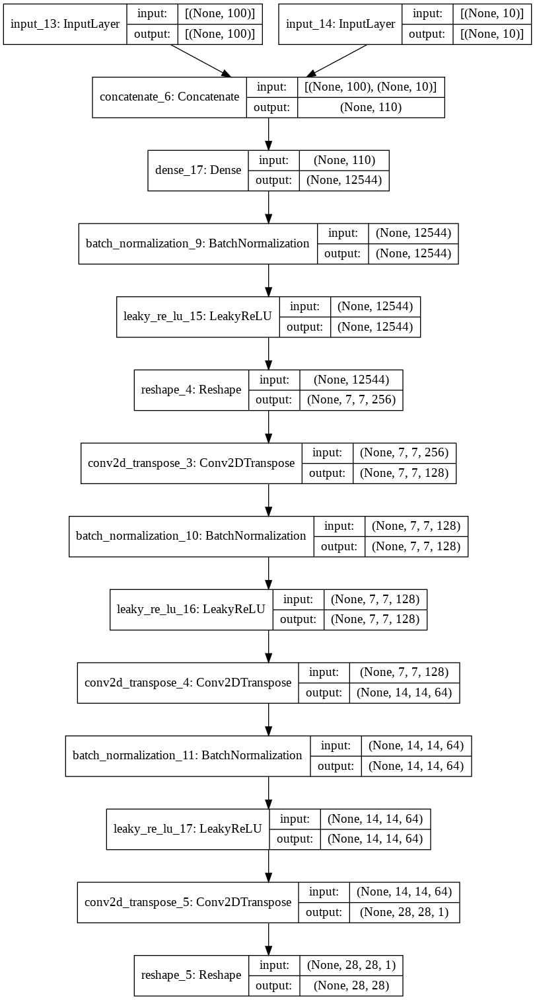

In [ ]:
G.summary()
tf.keras.utils.plot_model(G, show_shapes=True)

In [ ]:
input_img = tf.keras.Input(shape = (28,28))
reshape_img = tf.keras.layers.Reshape(target_shape = (28,28,1))(input_img)


input_con = tf.keras.Input(shape = (10,))
reshape_con = tf.keras.layers.Dense(28*28, use_bias=False)(input_con)
reshape_con = tf.keras.layers.Reshape(target_shape=(28,28,1))(reshape_con)

dis = tf.keras.layers.Concatenate()([reshape_img, reshape_con])
dis = tf.keras.layers.Conv2D(64, (5,5), strides=(2, 2), padding='same')(dis)
dis = tf.keras.layers.LeakyReLU(alpha=0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis = tf.keras.layers.Conv2D(128, (5,5), strides=(2, 2), padding='same')(dis)
dis = tf.keras.layers.LeakyReLU(alpha=0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis = tf.keras.layers.Flatten()(dis)
dis_out = tf.keras.layers.Dense(1, activation = 'sigmoid')(dis)


D = tf.keras.Model(inputs = [input_img , input_con], outputs = dis_out)

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           [(None, 10)]         0                                            
__________________________________________________________________________________________________
input_25 (InputLayer)           [(None, 28, 28)]     0                                            
__________________________________________________________________________________________________
dense_23 (Dense)                (None, 784)          7840        input_26[0][0]                   
__________________________________________________________________________________________________
reshape_9 (Reshape)             (None, 28, 28, 1)    0           input_25[0][0]                   
____________________________________________________________________________________________

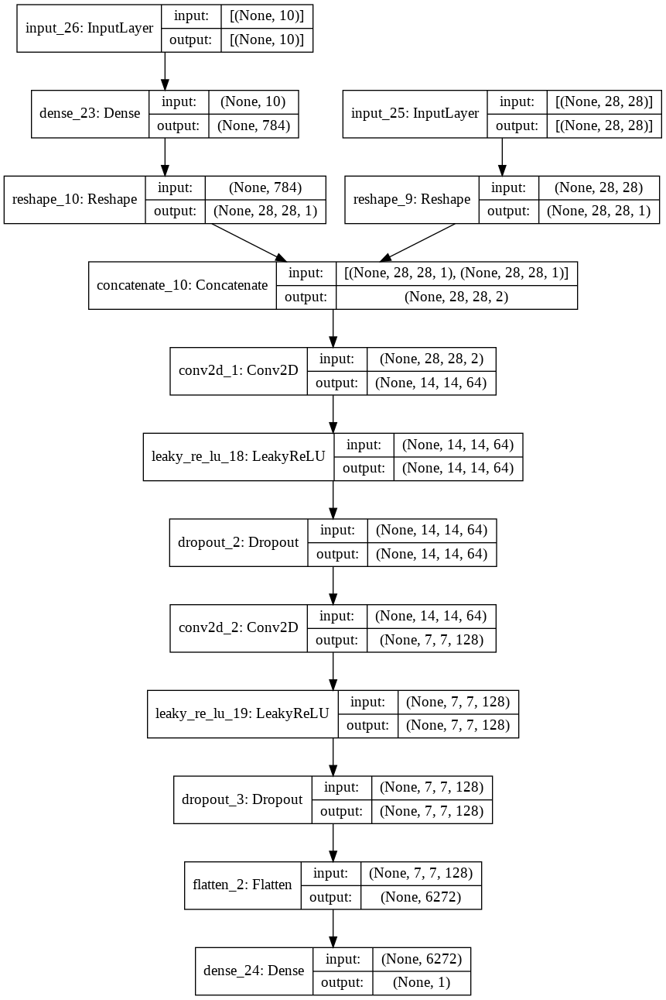

In [ ]:
D.summary()
tf.keras.utils.plot_model(D, show_shapes=True)

test condition : 4


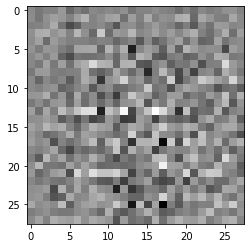

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기
test_noise = tf.random.normal([1, 100])
test_number = tf.random.uniform(shape=(1,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)
fake_image_test = G([test_noise,test_con], training=False)  # 생성자 G를 함수로 쓸 때는 training=False로 설정해야 함.


print(f'test condition : {test_number[0]}')
plt.imshow(fake_image_test[0], cmap='gray')
plt.show()

In [ ]:
# Discriminator에게 generator가 만든 노이즈 영상을 보여주고, 판단을 내릴 수 있는 테스트 함.

decision = D([fake_image_test, test_con], training=False)  # 판별자 D를 함수로 쓸 때는 training=False로 설정해야 함.
print(decision)

tf.Tensor([[0.50119096]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

G_optimizer = tf.keras.optimizers.Adam(1e-4)
D_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
# 배치단위 학습 함수 설정 (* AutoGraph 기능 쓰기!)

@tf.function
def train_step(real_images, real_labels):  
  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as dsc_tape:
    fake_images = G([noises,real_labels], training=True)
    
    real_output = D([real_images, real_labels], training=True)
    fake_output = D([fake_images, real_labels], training=True)
    
    gen_loss = G_loss(fake_output)
    dsc_loss = D_loss(real_output, fake_output)
    
  gen_gradients = gen_tape.gradient(gen_loss, G.trainable_variables)
  dsc_gradients = dsc_tape.gradient(dsc_loss, D.trainable_variables)
  
  G_optimizer.apply_gradients(zip(gen_gradients, G.trainable_variables))
  D_optimizer.apply_gradients(zip(dsc_gradients, D.trainable_variables)) 

  return gen_loss, dsc_loss

In [ ]:
def test_step(real_images, real_labels):  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  fake_images = G([noises, real_labels], training=False)
  
  real_output = D([real_images, real_labels], training=False)
  fake_output = D([fake_images,real_labels], training=False)    
  
  gen_loss = G_loss(fake_output)
  dsc_loss = D_loss(real_output, fake_output)
  
  print("Generator loss:", gen_loss.numpy(), "Discriminator loss:", dsc_loss.numpy())

In [ ]:
EPOCHS = 100
noise_dim = 100

seed = tf.random.normal([BATCH_SIZE, noise_dim])

epoch 0 & 0/235 Result


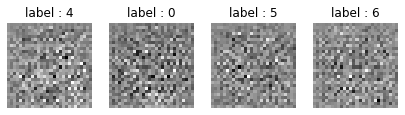

Generator loss: 0.69201493 Discriminator loss: 1.3191695
epoch 0 & 200/235 Result


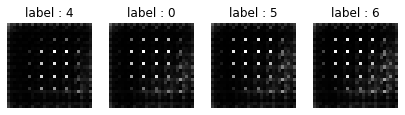

Generator loss: 0.075359546 Discriminator loss: 2.9591887
Time for epoch 1 is 15.121163129806519 sec
epoch 1 & 0/235 Result


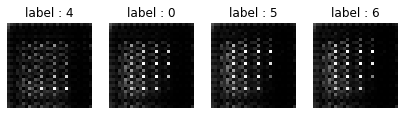

Generator loss: 0.8987932 Discriminator loss: 0.889516
epoch 1 & 200/235 Result


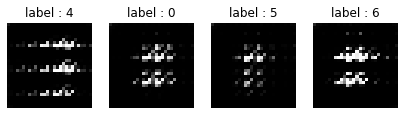

Generator loss: 0.09231567 Discriminator loss: 3.3370833
Time for epoch 2 is 12.718717575073242 sec
epoch 2 & 0/235 Result


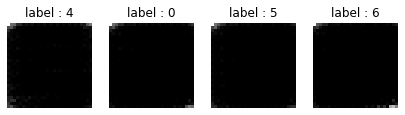

Generator loss: 1.3834485 Discriminator loss: 0.5654155
epoch 2 & 200/235 Result


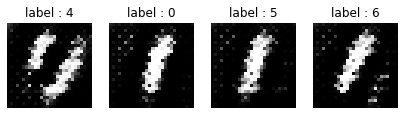

Generator loss: 1.400521 Discriminator loss: 0.8278829
Time for epoch 3 is 12.84340500831604 sec
epoch 3 & 0/235 Result


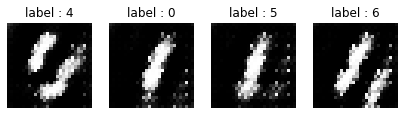

Generator loss: 1.4856564 Discriminator loss: 0.8421143
epoch 3 & 200/235 Result


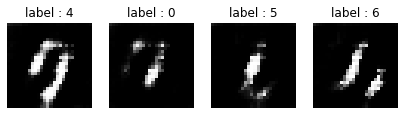

Generator loss: 0.92450285 Discriminator loss: 1.0474375
Time for epoch 4 is 13.12958025932312 sec
epoch 4 & 0/235 Result


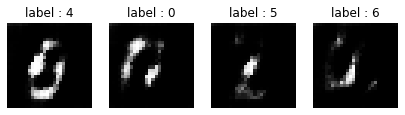

Generator loss: 1.3388228 Discriminator loss: 0.8641003
epoch 4 & 200/235 Result


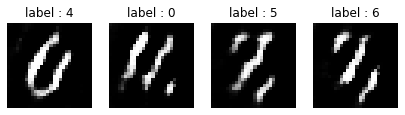

Generator loss: 0.3804849 Discriminator loss: 1.9210113
Time for epoch 5 is 13.06429386138916 sec
epoch 5 & 0/235 Result


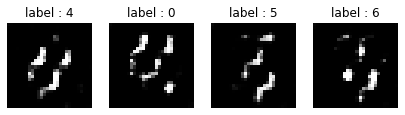

Generator loss: 1.7021817 Discriminator loss: 0.6700673
epoch 5 & 200/235 Result


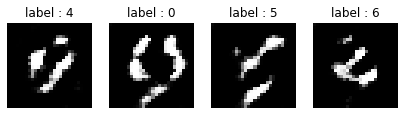

Generator loss: 0.48232934 Discriminator loss: 1.9647187
Time for epoch 6 is 13.1620454788208 sec
epoch 6 & 0/235 Result


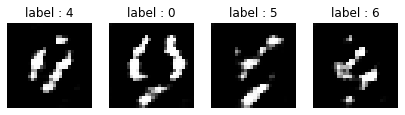

Generator loss: 0.8599017 Discriminator loss: 1.206399
epoch 6 & 200/235 Result


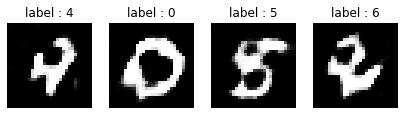

Generator loss: 0.9724753 Discriminator loss: 1.1121397
Time for epoch 7 is 13.262789011001587 sec
epoch 7 & 0/235 Result


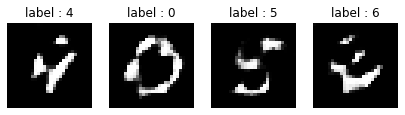

Generator loss: 0.6253934 Discriminator loss: 1.5443611
epoch 7 & 200/235 Result


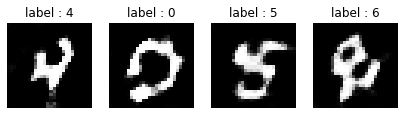

Generator loss: 0.70293987 Discriminator loss: 1.370323
Time for epoch 8 is 13.351849794387817 sec
epoch 8 & 0/235 Result


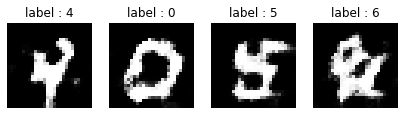

Generator loss: 0.86359024 Discriminator loss: 1.2530992
epoch 8 & 200/235 Result


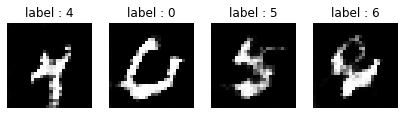

Generator loss: 0.7975296 Discriminator loss: 1.3839738
Time for epoch 9 is 13.43985366821289 sec
epoch 9 & 0/235 Result


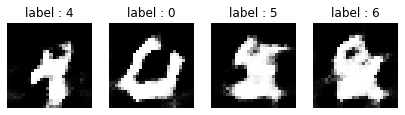

Generator loss: 0.9884189 Discriminator loss: 1.1382459
epoch 9 & 200/235 Result


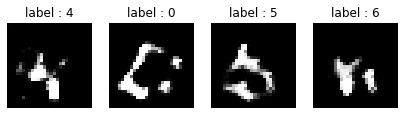

Generator loss: 0.6908307 Discriminator loss: 1.3065615
Time for epoch 10 is 13.75936245918274 sec
epoch 10 & 0/235 Result


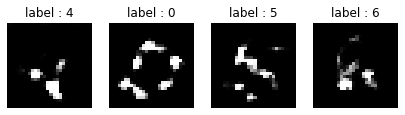

Generator loss: 1.107533 Discriminator loss: 0.99297583
epoch 10 & 200/235 Result


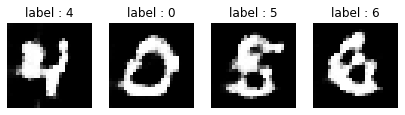

Generator loss: 0.95850724 Discriminator loss: 1.0836973
Time for epoch 11 is 13.599310398101807 sec
epoch 11 & 0/235 Result


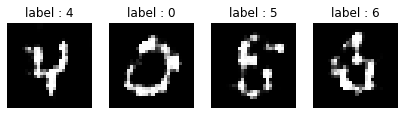

Generator loss: 0.6646128 Discriminator loss: 1.5485878
epoch 11 & 200/235 Result


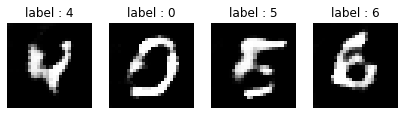

Generator loss: 0.89201427 Discriminator loss: 1.1856058
Time for epoch 12 is 13.561351299285889 sec
epoch 12 & 0/235 Result


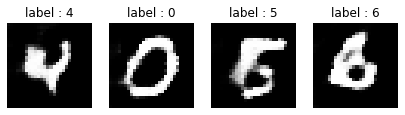

Generator loss: 0.8665968 Discriminator loss: 1.1407502
epoch 12 & 200/235 Result


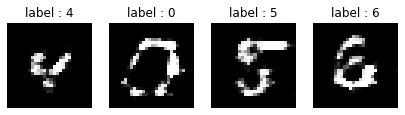

Generator loss: 0.94288677 Discriminator loss: 1.1102556
Time for epoch 13 is 13.517851114273071 sec
epoch 13 & 0/235 Result


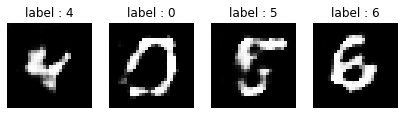

Generator loss: 0.79230756 Discriminator loss: 1.3271902
epoch 13 & 200/235 Result


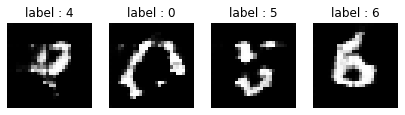

Generator loss: 0.6943629 Discriminator loss: 1.3633478
Time for epoch 14 is 13.513497352600098 sec
epoch 14 & 0/235 Result


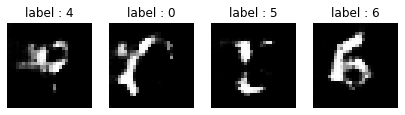

Generator loss: 1.1361697 Discriminator loss: 1.0416913
epoch 14 & 200/235 Result


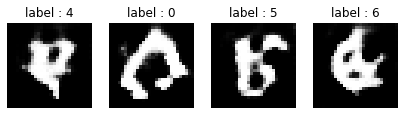

Generator loss: 1.0014607 Discriminator loss: 1.1973987
Time for epoch 15 is 13.52049207687378 sec
epoch 15 & 0/235 Result


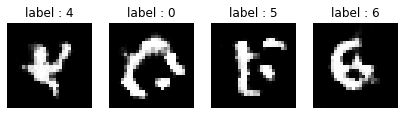

Generator loss: 0.8932343 Discriminator loss: 1.2927082
epoch 15 & 200/235 Result


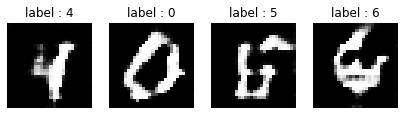

Generator loss: 0.9413892 Discriminator loss: 1.0928366
Time for epoch 16 is 13.563658237457275 sec
epoch 16 & 0/235 Result


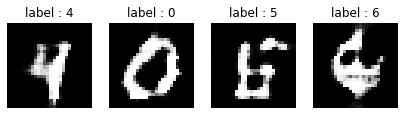

Generator loss: 1.222596 Discriminator loss: 0.8683942
epoch 16 & 200/235 Result


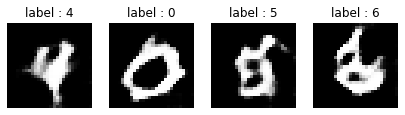

Generator loss: 0.680706 Discriminator loss: 1.5287685
Time for epoch 17 is 13.762694120407104 sec
epoch 17 & 0/235 Result


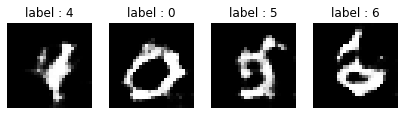

Generator loss: 0.78793395 Discriminator loss: 1.3264115
epoch 17 & 200/235 Result


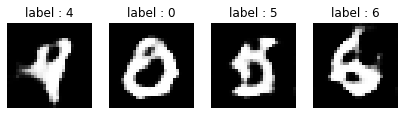

Generator loss: 0.86673737 Discriminator loss: 1.1960418
Time for epoch 18 is 13.524799346923828 sec
epoch 18 & 0/235 Result


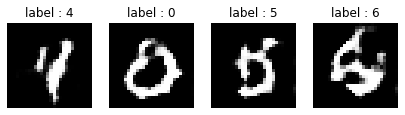

Generator loss: 1.08355 Discriminator loss: 1.1603116
epoch 18 & 200/235 Result


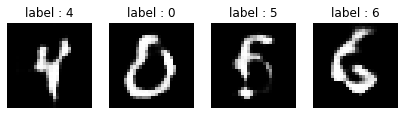

Generator loss: 0.8270343 Discriminator loss: 1.3580762
Time for epoch 19 is 13.520279169082642 sec
epoch 19 & 0/235 Result


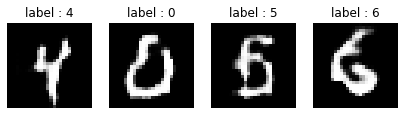

Generator loss: 0.9872037 Discriminator loss: 1.0217319
epoch 19 & 200/235 Result


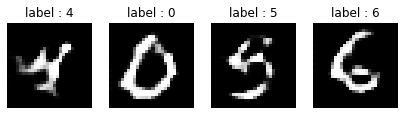

Generator loss: 0.86165106 Discriminator loss: 1.173722
Time for epoch 20 is 13.55303406715393 sec
epoch 20 & 0/235 Result


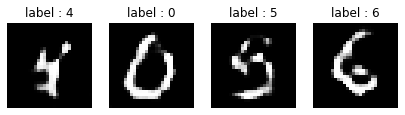

Generator loss: 0.8913788 Discriminator loss: 1.1961341
epoch 20 & 200/235 Result


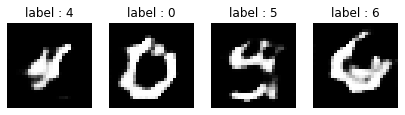

Generator loss: 0.98003274 Discriminator loss: 1.1230118
Time for epoch 21 is 13.557763576507568 sec
epoch 21 & 0/235 Result


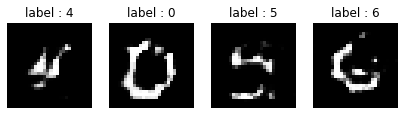

Generator loss: 1.1532024 Discriminator loss: 0.9438632
epoch 21 & 200/235 Result


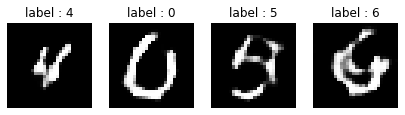

Generator loss: 0.78348607 Discriminator loss: 1.3430479
Time for epoch 22 is 13.550719738006592 sec
epoch 22 & 0/235 Result


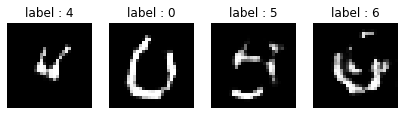

Generator loss: 1.3192198 Discriminator loss: 0.863847
epoch 22 & 200/235 Result


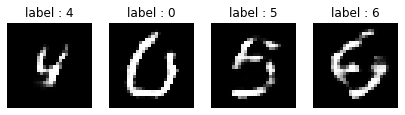

Generator loss: 1.1553148 Discriminator loss: 1.2242322
Time for epoch 23 is 13.815057754516602 sec
epoch 23 & 0/235 Result


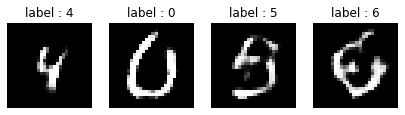

Generator loss: 1.3970746 Discriminator loss: 0.87470466
epoch 23 & 200/235 Result


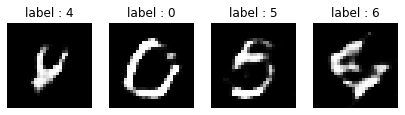

Generator loss: 1.0390207 Discriminator loss: 1.0414547
Time for epoch 24 is 13.60606837272644 sec
epoch 24 & 0/235 Result


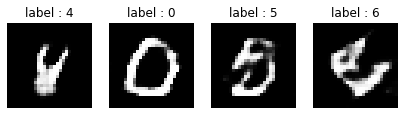

Generator loss: 0.9766854 Discriminator loss: 1.0878649
epoch 24 & 200/235 Result


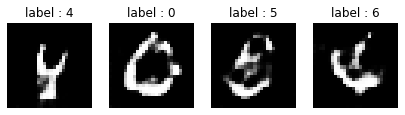

Generator loss: 0.85653025 Discriminator loss: 1.2590033
Time for epoch 25 is 13.592155933380127 sec
epoch 25 & 0/235 Result


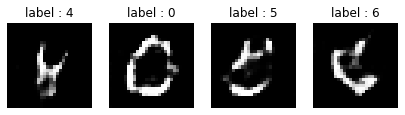

Generator loss: 1.0644797 Discriminator loss: 1.0457019
epoch 25 & 200/235 Result


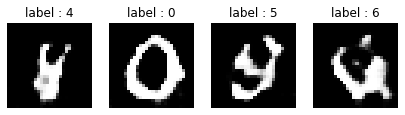

Generator loss: 1.2903231 Discriminator loss: 1.0029073
Time for epoch 26 is 13.579002618789673 sec
epoch 26 & 0/235 Result


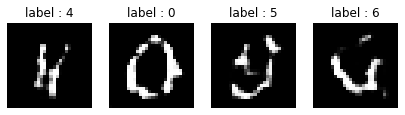

Generator loss: 1.1411246 Discriminator loss: 0.94199187
epoch 26 & 200/235 Result


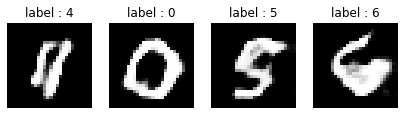

Generator loss: 1.1306787 Discriminator loss: 0.9011402
Time for epoch 27 is 13.564815044403076 sec
epoch 27 & 0/235 Result


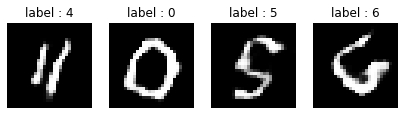

Generator loss: 0.99634117 Discriminator loss: 1.2572494
epoch 27 & 200/235 Result


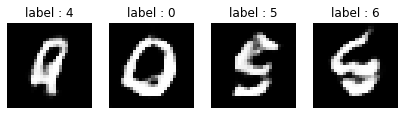

Generator loss: 0.9125934 Discriminator loss: 1.1750575
Time for epoch 28 is 13.561091184616089 sec
epoch 28 & 0/235 Result


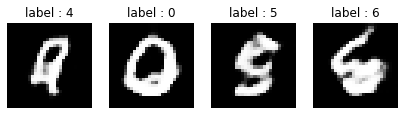

Generator loss: 1.0748494 Discriminator loss: 0.9786986
epoch 28 & 200/235 Result


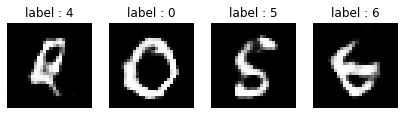

Generator loss: 1.1379724 Discriminator loss: 0.9556061
Time for epoch 29 is 13.60626482963562 sec
epoch 29 & 0/235 Result


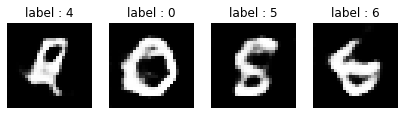

Generator loss: 1.1280799 Discriminator loss: 1.0991797
epoch 29 & 200/235 Result


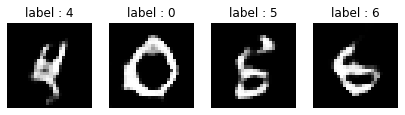

Generator loss: 1.0343331 Discriminator loss: 1.1170464
Time for epoch 30 is 13.76804256439209 sec
epoch 30 & 0/235 Result


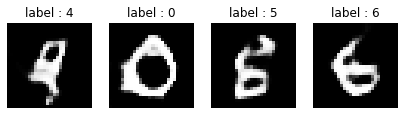

Generator loss: 0.9807914 Discriminator loss: 1.0113156
epoch 30 & 200/235 Result


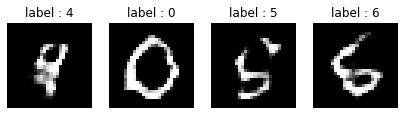

Generator loss: 1.0458393 Discriminator loss: 1.1620835
Time for epoch 31 is 13.5390145778656 sec
epoch 31 & 0/235 Result


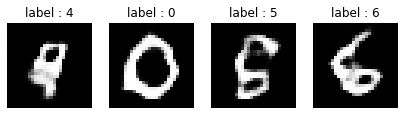

Generator loss: 0.809953 Discriminator loss: 1.1607792
epoch 31 & 200/235 Result


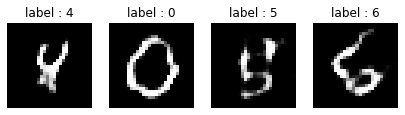

Generator loss: 1.2005917 Discriminator loss: 0.9979857
Time for epoch 32 is 13.577780961990356 sec
epoch 32 & 0/235 Result


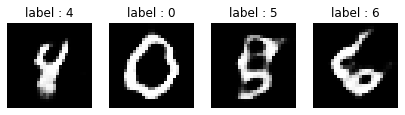

Generator loss: 0.9137532 Discriminator loss: 1.1235576
epoch 32 & 200/235 Result


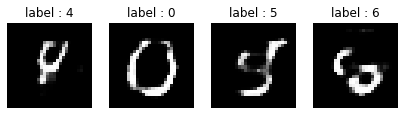

Generator loss: 1.0781925 Discriminator loss: 1.0769116
Time for epoch 33 is 13.565321922302246 sec
epoch 33 & 0/235 Result


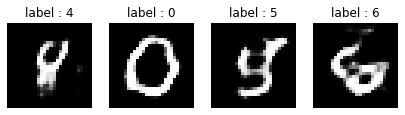

Generator loss: 0.9127745 Discriminator loss: 1.1858022
epoch 33 & 200/235 Result


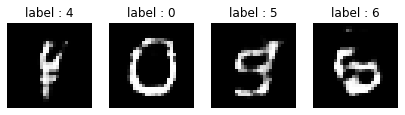

Generator loss: 0.96994174 Discriminator loss: 1.2807355
Time for epoch 34 is 13.56657338142395 sec
epoch 34 & 0/235 Result


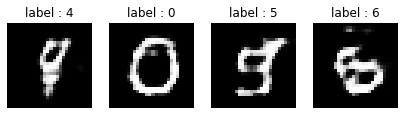

Generator loss: 0.79442614 Discriminator loss: 1.224649
epoch 34 & 200/235 Result


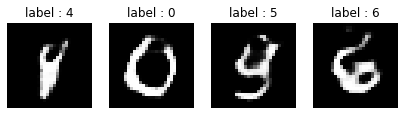

Generator loss: 0.85660833 Discriminator loss: 1.1983128
Time for epoch 35 is 13.6057448387146 sec
epoch 35 & 0/235 Result


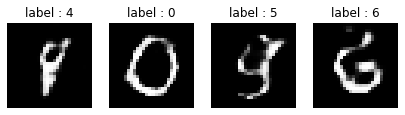

Generator loss: 0.8983557 Discriminator loss: 1.1877021
epoch 35 & 200/235 Result


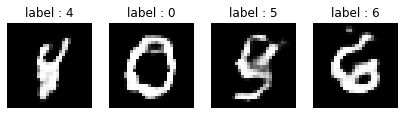

Generator loss: 1.0190332 Discriminator loss: 1.0797496
Time for epoch 36 is 13.791809320449829 sec
epoch 36 & 0/235 Result


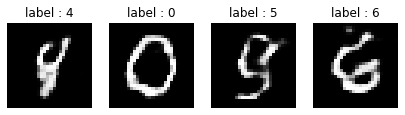

Generator loss: 1.0804628 Discriminator loss: 0.9627694
epoch 36 & 200/235 Result


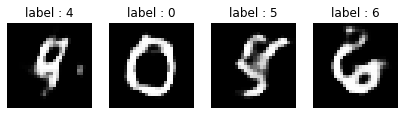

Generator loss: 0.9354185 Discriminator loss: 1.1618656
Time for epoch 37 is 13.60468316078186 sec
epoch 37 & 0/235 Result


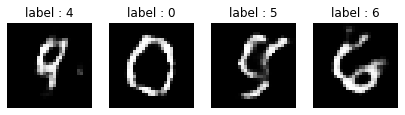

Generator loss: 1.2574733 Discriminator loss: 1.0426316
epoch 37 & 200/235 Result


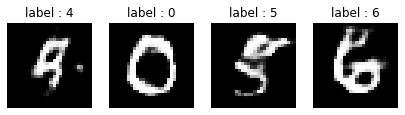

Generator loss: 1.0266756 Discriminator loss: 1.1295321
Time for epoch 38 is 13.593620300292969 sec
epoch 38 & 0/235 Result


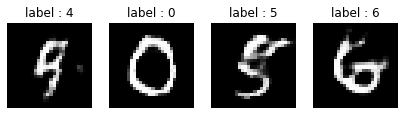

Generator loss: 1.1078808 Discriminator loss: 1.0124427
epoch 38 & 200/235 Result


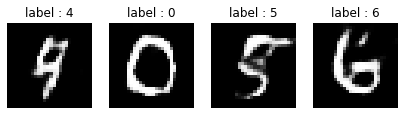

Generator loss: 0.990429 Discriminator loss: 1.2039216
Time for epoch 39 is 13.583630323410034 sec
epoch 39 & 0/235 Result


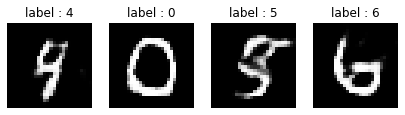

Generator loss: 0.8841416 Discriminator loss: 1.2001016
epoch 39 & 200/235 Result


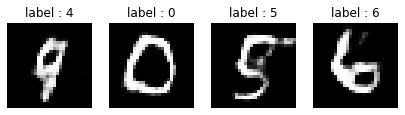

Generator loss: 0.87966686 Discriminator loss: 1.2276784
Time for epoch 40 is 13.577754020690918 sec
epoch 40 & 0/235 Result


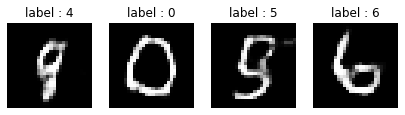

Generator loss: 0.9618609 Discriminator loss: 1.1357394
epoch 40 & 200/235 Result


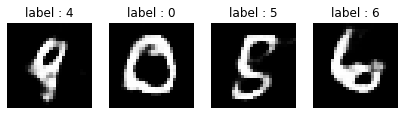

Generator loss: 0.939228 Discriminator loss: 1.1430674
Time for epoch 41 is 13.602623701095581 sec
epoch 41 & 0/235 Result


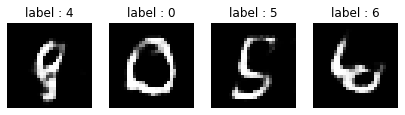

Generator loss: 0.96039015 Discriminator loss: 1.2242341
epoch 41 & 200/235 Result


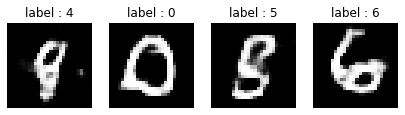

Generator loss: 0.94070554 Discriminator loss: 1.2074449
Time for epoch 42 is 13.627283573150635 sec
epoch 42 & 0/235 Result


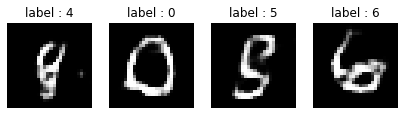

Generator loss: 0.9453389 Discriminator loss: 1.1545367
epoch 42 & 200/235 Result


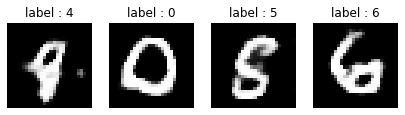

Generator loss: 0.93855673 Discriminator loss: 1.0910089
Time for epoch 43 is 13.824804544448853 sec
epoch 43 & 0/235 Result


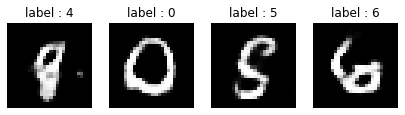

Generator loss: 0.95047164 Discriminator loss: 1.3059083
epoch 43 & 200/235 Result


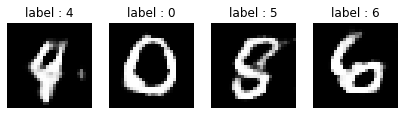

Generator loss: 0.7221756 Discriminator loss: 1.2891634
Time for epoch 44 is 13.559136867523193 sec
epoch 44 & 0/235 Result


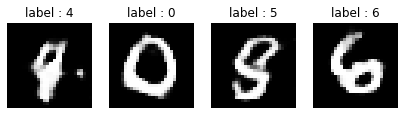

Generator loss: 1.0986469 Discriminator loss: 0.97931254
epoch 44 & 200/235 Result


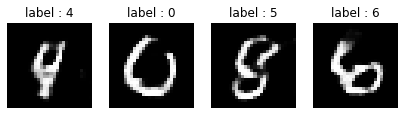

Generator loss: 0.9316433 Discriminator loss: 1.1563544
Time for epoch 45 is 13.567939043045044 sec
epoch 45 & 0/235 Result


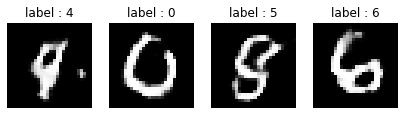

Generator loss: 0.80512977 Discriminator loss: 1.2941706
epoch 45 & 200/235 Result


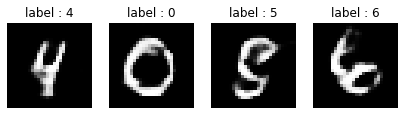

Generator loss: 0.9536496 Discriminator loss: 1.1792189
Time for epoch 46 is 13.57578706741333 sec
epoch 46 & 0/235 Result


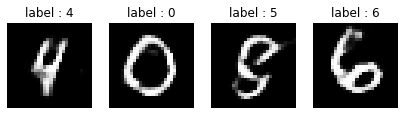

Generator loss: 0.86842066 Discriminator loss: 1.2047676
epoch 46 & 200/235 Result


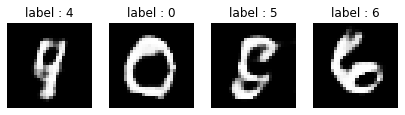

Generator loss: 0.86046916 Discriminator loss: 1.161672
Time for epoch 47 is 13.605948686599731 sec
epoch 47 & 0/235 Result


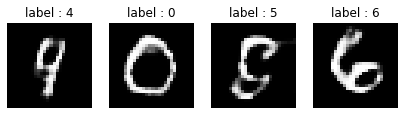

Generator loss: 0.859233 Discriminator loss: 1.156389
epoch 47 & 200/235 Result


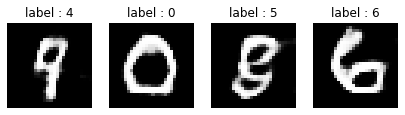

Generator loss: 0.8043989 Discriminator loss: 1.1930114
Time for epoch 48 is 13.551463603973389 sec
epoch 48 & 0/235 Result


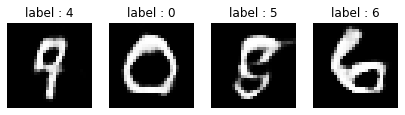

Generator loss: 0.9524079 Discriminator loss: 1.2276028
epoch 48 & 200/235 Result


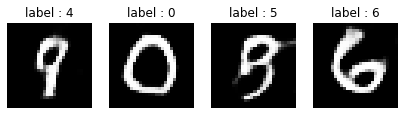

Generator loss: 0.76691866 Discriminator loss: 1.3600059
Time for epoch 49 is 13.86331844329834 sec
epoch 49 & 0/235 Result


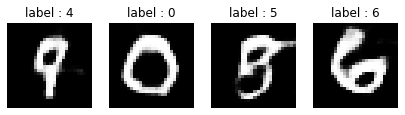

Generator loss: 0.9520414 Discriminator loss: 1.0915611
epoch 49 & 200/235 Result


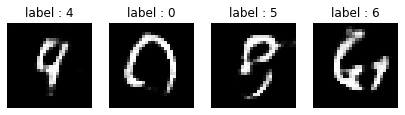

Generator loss: 0.868969 Discriminator loss: 1.152055
Time for epoch 50 is 13.621501922607422 sec
epoch 50 & 0/235 Result


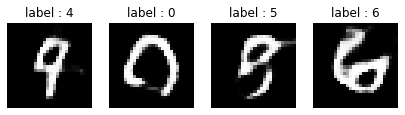

Generator loss: 0.7881071 Discriminator loss: 1.3173757
epoch 50 & 200/235 Result


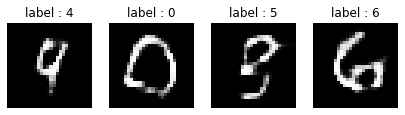

Generator loss: 0.7936572 Discriminator loss: 1.3490443
Time for epoch 51 is 13.598604917526245 sec
epoch 51 & 0/235 Result


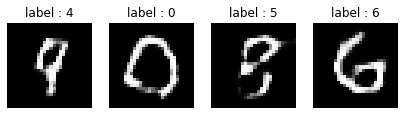

Generator loss: 0.89452374 Discriminator loss: 1.1680633
epoch 51 & 200/235 Result


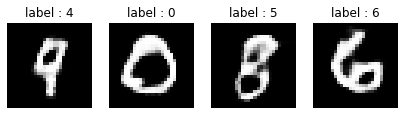

Generator loss: 0.84140813 Discriminator loss: 1.2415695
Time for epoch 52 is 13.557521104812622 sec
epoch 52 & 0/235 Result


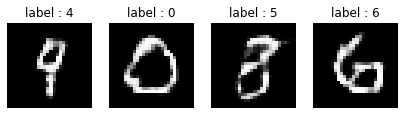

Generator loss: 0.8385113 Discriminator loss: 1.2900023
epoch 52 & 200/235 Result


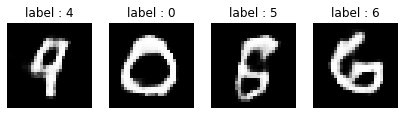

Generator loss: 0.73240435 Discriminator loss: 1.3079147
Time for epoch 53 is 13.589053392410278 sec
epoch 53 & 0/235 Result


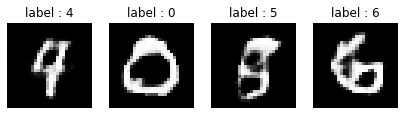

Generator loss: 0.7952357 Discriminator loss: 1.1867391
epoch 53 & 200/235 Result


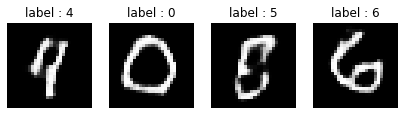

Generator loss: 0.88029426 Discriminator loss: 1.2647648
Time for epoch 54 is 13.571391582489014 sec
epoch 54 & 0/235 Result


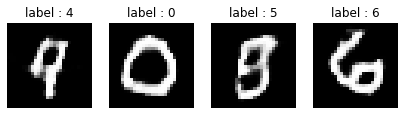

Generator loss: 0.7441229 Discriminator loss: 1.3040231
epoch 54 & 200/235 Result


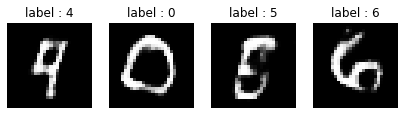

Generator loss: 0.8931719 Discriminator loss: 1.2432013
Time for epoch 55 is 13.615145921707153 sec
epoch 55 & 0/235 Result


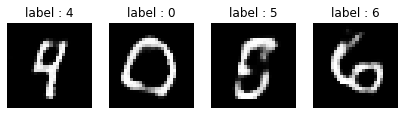

Generator loss: 0.8176909 Discriminator loss: 1.180835
epoch 55 & 200/235 Result


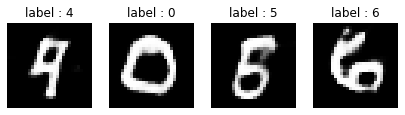

Generator loss: 0.94077635 Discriminator loss: 1.0853784
Time for epoch 56 is 13.829902410507202 sec
epoch 56 & 0/235 Result


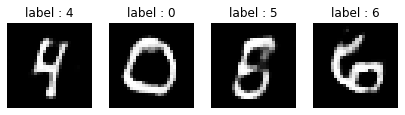

Generator loss: 0.8303876 Discriminator loss: 1.2751977
epoch 56 & 200/235 Result


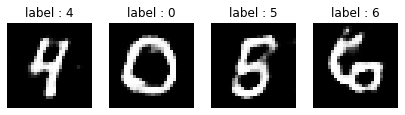

Generator loss: 0.73368114 Discriminator loss: 1.2863748
Time for epoch 57 is 13.566847324371338 sec
epoch 57 & 0/235 Result


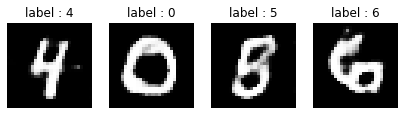

Generator loss: 0.85180724 Discriminator loss: 1.1388509
epoch 57 & 200/235 Result


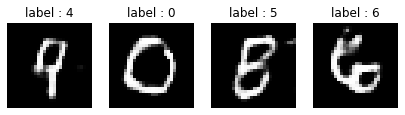

Generator loss: 0.899145 Discriminator loss: 1.2327156
Time for epoch 58 is 13.551373481750488 sec
epoch 58 & 0/235 Result


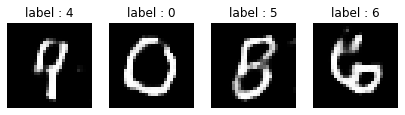

Generator loss: 0.8614664 Discriminator loss: 1.1448121
epoch 58 & 200/235 Result


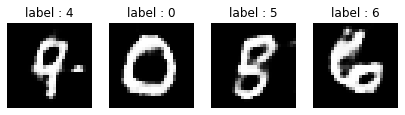

Generator loss: 0.87640107 Discriminator loss: 1.1913328
Time for epoch 59 is 13.595943927764893 sec
epoch 59 & 0/235 Result


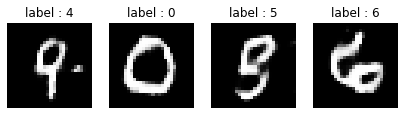

Generator loss: 0.9726618 Discriminator loss: 1.1579187
epoch 59 & 200/235 Result


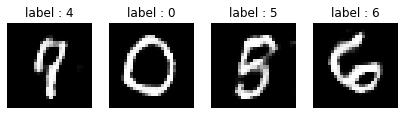

Generator loss: 0.918582 Discriminator loss: 1.2295688
Time for epoch 60 is 13.53955888748169 sec
epoch 60 & 0/235 Result


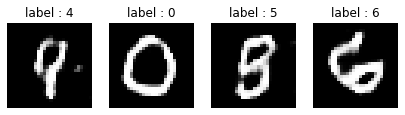

Generator loss: 0.76065797 Discriminator loss: 1.34867
epoch 60 & 200/235 Result


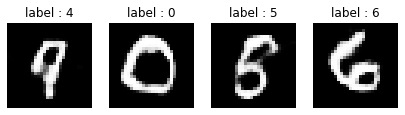

Generator loss: 1.0243936 Discriminator loss: 1.1541358
Time for epoch 61 is 13.574848413467407 sec
epoch 61 & 0/235 Result


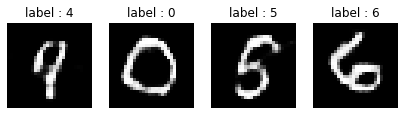

Generator loss: 0.8668046 Discriminator loss: 1.2874618
epoch 61 & 200/235 Result


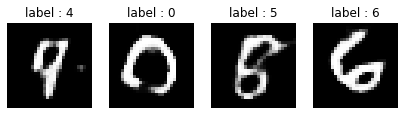

Generator loss: 0.8065569 Discriminator loss: 1.302067
Time for epoch 62 is 13.807096242904663 sec
epoch 62 & 0/235 Result


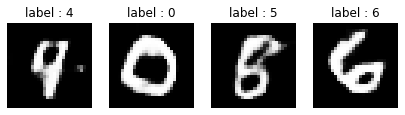

Generator loss: 0.9898909 Discriminator loss: 1.0385407
epoch 62 & 200/235 Result


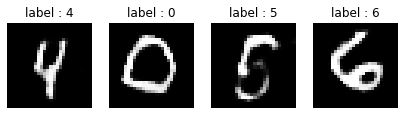

Generator loss: 0.8513556 Discriminator loss: 1.3555522
Time for epoch 63 is 13.616646766662598 sec
epoch 63 & 0/235 Result


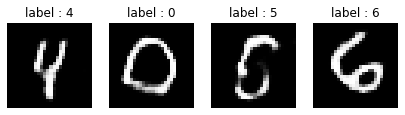

Generator loss: 0.8854287 Discriminator loss: 1.2109563
epoch 63 & 200/235 Result


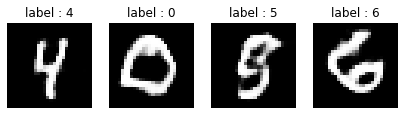

Generator loss: 0.75635177 Discriminator loss: 1.2375839
Time for epoch 64 is 13.591567039489746 sec
epoch 64 & 0/235 Result


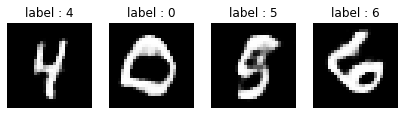

Generator loss: 0.9693954 Discriminator loss: 1.0872413
epoch 64 & 200/235 Result


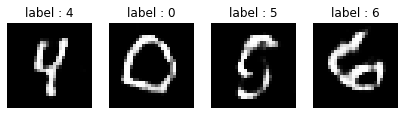

Generator loss: 0.9366086 Discriminator loss: 1.2099311
Time for epoch 65 is 13.570024490356445 sec
epoch 65 & 0/235 Result


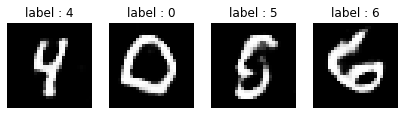

Generator loss: 0.83377415 Discriminator loss: 1.2362126
epoch 65 & 200/235 Result


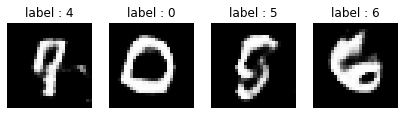

Generator loss: 0.9835308 Discriminator loss: 1.1401103
Time for epoch 66 is 13.588959693908691 sec
epoch 66 & 0/235 Result


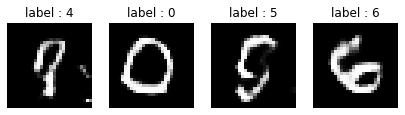

Generator loss: 0.8769805 Discriminator loss: 1.3024931
epoch 66 & 200/235 Result


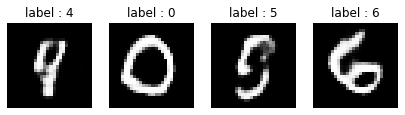

Generator loss: 0.7862538 Discriminator loss: 1.297117
Time for epoch 67 is 13.623063325881958 sec
epoch 67 & 0/235 Result


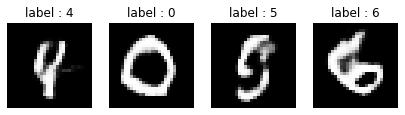

Generator loss: 0.76526386 Discriminator loss: 1.2267823
epoch 67 & 200/235 Result


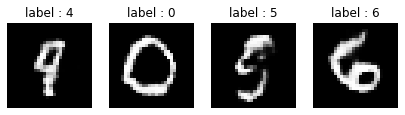

Generator loss: 0.90942204 Discriminator loss: 1.2701203
Time for epoch 68 is 13.597058773040771 sec
epoch 68 & 0/235 Result


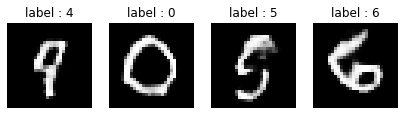

Generator loss: 0.9086733 Discriminator loss: 1.1375775
epoch 68 & 200/235 Result


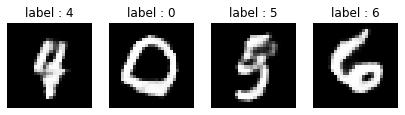

Generator loss: 0.8534908 Discriminator loss: 1.2203131
Time for epoch 69 is 13.79583477973938 sec
epoch 69 & 0/235 Result


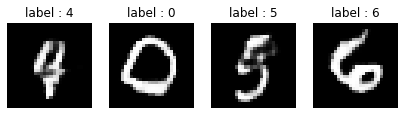

Generator loss: 0.9073325 Discriminator loss: 1.2237548
epoch 69 & 200/235 Result


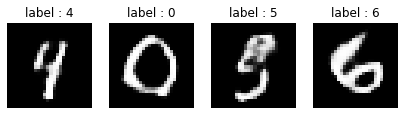

Generator loss: 0.8183755 Discriminator loss: 1.2261219
Time for epoch 70 is 13.57751727104187 sec
epoch 70 & 0/235 Result


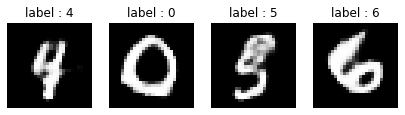

Generator loss: 0.7464634 Discriminator loss: 1.2989289
epoch 70 & 200/235 Result


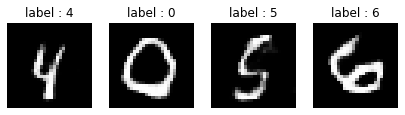

Generator loss: 0.89974046 Discriminator loss: 1.3184897
Time for epoch 71 is 13.571584224700928 sec
epoch 71 & 0/235 Result


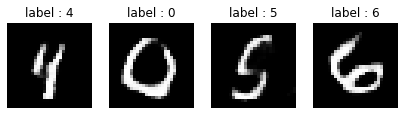

Generator loss: 0.8988863 Discriminator loss: 1.1393962
epoch 71 & 200/235 Result


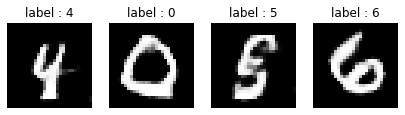

Generator loss: 0.7500301 Discriminator loss: 1.3555341
Time for epoch 72 is 13.573981285095215 sec
epoch 72 & 0/235 Result


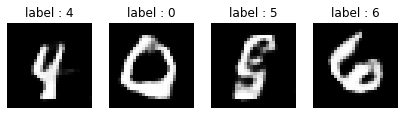

Generator loss: 0.9372705 Discriminator loss: 1.0938725
epoch 72 & 200/235 Result


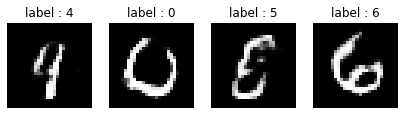

Generator loss: 0.9667147 Discriminator loss: 1.1582885
Time for epoch 73 is 13.592801570892334 sec
epoch 73 & 0/235 Result


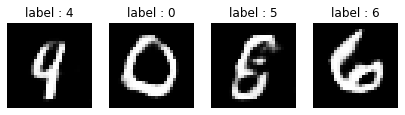

Generator loss: 0.77621245 Discriminator loss: 1.319947
epoch 73 & 200/235 Result


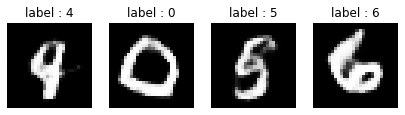

Generator loss: 0.7784503 Discriminator loss: 1.3030448
Time for epoch 74 is 13.55807900428772 sec
epoch 74 & 0/235 Result


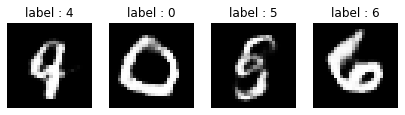

Generator loss: 0.98909706 Discriminator loss: 1.1482127
epoch 74 & 200/235 Result


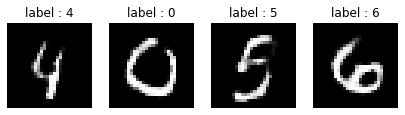

Generator loss: 0.81730133 Discriminator loss: 1.3450873
Time for epoch 75 is 13.87635087966919 sec
epoch 75 & 0/235 Result


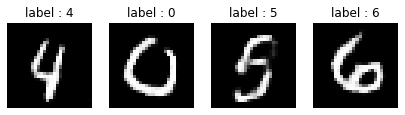

Generator loss: 0.9006061 Discriminator loss: 1.1475816
epoch 75 & 200/235 Result


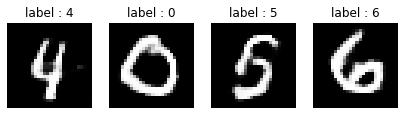

Generator loss: 0.8092744 Discriminator loss: 1.2479899
Time for epoch 76 is 13.630797624588013 sec
epoch 76 & 0/235 Result


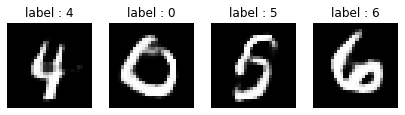

Generator loss: 0.96882784 Discriminator loss: 1.1402118
epoch 76 & 200/235 Result


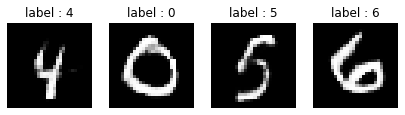

Generator loss: 0.8157448 Discriminator loss: 1.3042306
Time for epoch 77 is 13.55832290649414 sec
epoch 77 & 0/235 Result


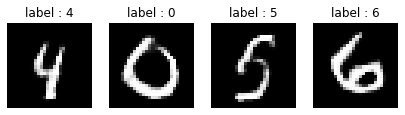

Generator loss: 0.86609447 Discriminator loss: 1.2667117
epoch 77 & 200/235 Result


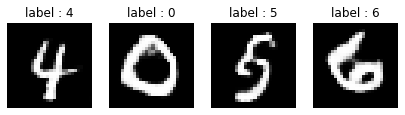

Generator loss: 0.7349109 Discriminator loss: 1.3347397
Time for epoch 78 is 13.528303623199463 sec
epoch 78 & 0/235 Result


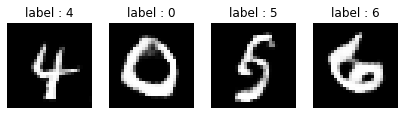

Generator loss: 0.9901004 Discriminator loss: 1.1480601
epoch 78 & 200/235 Result


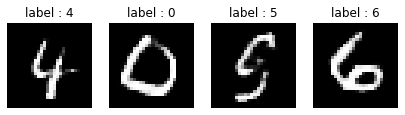

Generator loss: 0.8926412 Discriminator loss: 1.2364578
Time for epoch 79 is 13.54780888557434 sec
epoch 79 & 0/235 Result


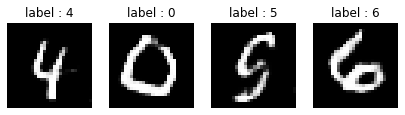

Generator loss: 0.7804292 Discriminator loss: 1.2936608
epoch 79 & 200/235 Result


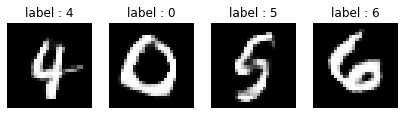

Generator loss: 0.7132757 Discriminator loss: 1.3512712
Time for epoch 80 is 13.556676626205444 sec
epoch 80 & 0/235 Result


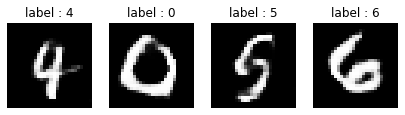

Generator loss: 0.9929445 Discriminator loss: 1.0981772
epoch 80 & 200/235 Result


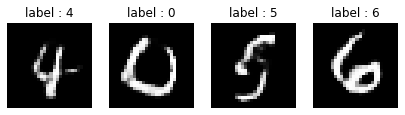

Generator loss: 0.80895805 Discriminator loss: 1.3469841
Time for epoch 81 is 13.573192834854126 sec
epoch 81 & 0/235 Result


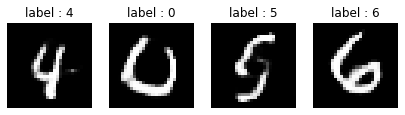

Generator loss: 0.8797217 Discriminator loss: 1.175034
epoch 81 & 200/235 Result


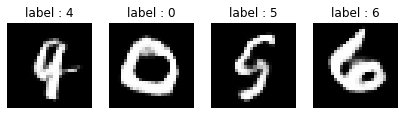

Generator loss: 0.78276837 Discriminator loss: 1.2539599
Time for epoch 82 is 13.849913120269775 sec
epoch 82 & 0/235 Result


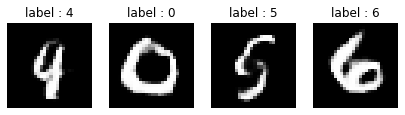

Generator loss: 0.8611655 Discriminator loss: 1.2873876
epoch 82 & 200/235 Result


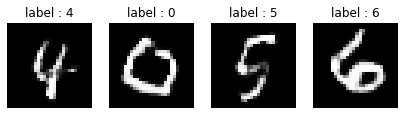

Generator loss: 0.9560239 Discriminator loss: 1.2603117
Time for epoch 83 is 13.577816009521484 sec
epoch 83 & 0/235 Result


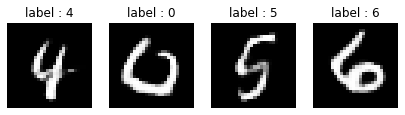

Generator loss: 0.77816427 Discriminator loss: 1.2515723
epoch 83 & 200/235 Result


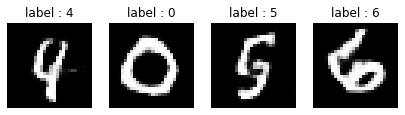

Generator loss: 0.70980465 Discriminator loss: 1.3902369
Time for epoch 84 is 13.608257293701172 sec
epoch 84 & 0/235 Result


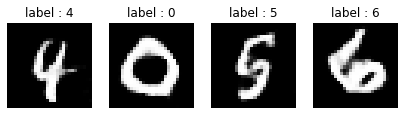

Generator loss: 0.88284177 Discriminator loss: 1.1540151
epoch 84 & 200/235 Result


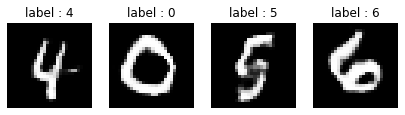

Generator loss: 0.9112729 Discriminator loss: 1.1617553
Time for epoch 85 is 13.58821988105774 sec
epoch 85 & 0/235 Result


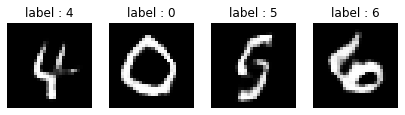

Generator loss: 0.77971065 Discriminator loss: 1.3383249
epoch 85 & 200/235 Result


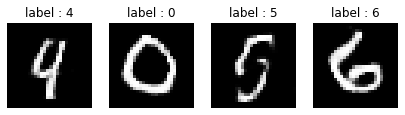

Generator loss: 0.8147561 Discriminator loss: 1.3050969
Time for epoch 86 is 13.602604627609253 sec
epoch 86 & 0/235 Result


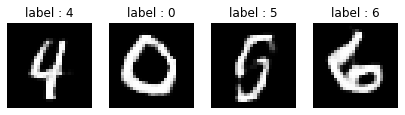

Generator loss: 0.7768434 Discriminator loss: 1.3003371
epoch 86 & 200/235 Result


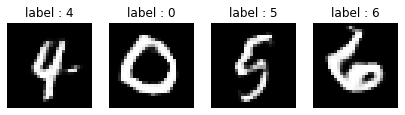

Generator loss: 0.8845543 Discriminator loss: 1.1765188
Time for epoch 87 is 13.65045714378357 sec
epoch 87 & 0/235 Result


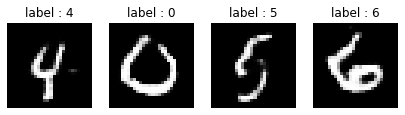

Generator loss: 0.7142781 Discriminator loss: 1.5001982
epoch 87 & 200/235 Result


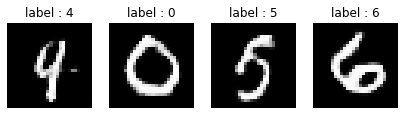

Generator loss: 0.7922299 Discriminator loss: 1.3062887
Time for epoch 88 is 13.923165321350098 sec
epoch 88 & 0/235 Result


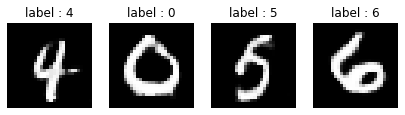

Generator loss: 0.8322098 Discriminator loss: 1.2089927
epoch 88 & 200/235 Result


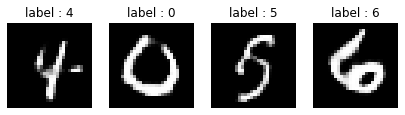

Generator loss: 0.837187 Discriminator loss: 1.3294022
Time for epoch 89 is 13.718838453292847 sec
epoch 89 & 0/235 Result


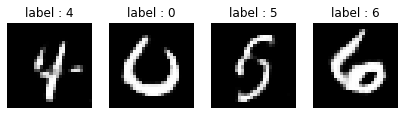

Generator loss: 0.8573251 Discriminator loss: 1.2483218
epoch 89 & 200/235 Result


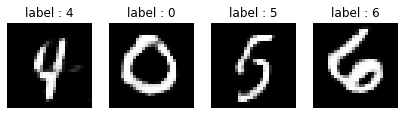

Generator loss: 0.79515773 Discriminator loss: 1.3203105
Time for epoch 90 is 13.597778558731079 sec
epoch 90 & 0/235 Result


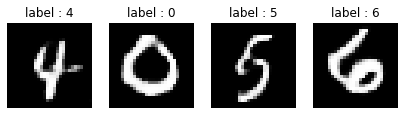

Generator loss: 0.8387513 Discriminator loss: 1.1841913
epoch 90 & 200/235 Result


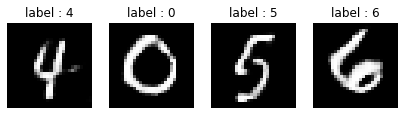

Generator loss: 0.86276895 Discriminator loss: 1.1983842
Time for epoch 91 is 13.59605097770691 sec
epoch 91 & 0/235 Result


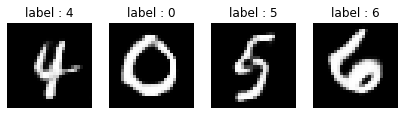

Generator loss: 0.7172842 Discriminator loss: 1.3177929
epoch 91 & 200/235 Result


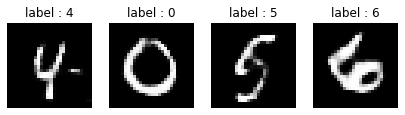

Generator loss: 0.89487904 Discriminator loss: 1.2529093
Time for epoch 92 is 13.610622882843018 sec
epoch 92 & 0/235 Result


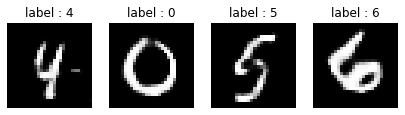

Generator loss: 0.8249485 Discriminator loss: 1.2543871
epoch 92 & 200/235 Result


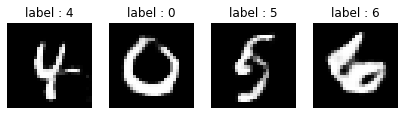

Generator loss: 0.861807 Discriminator loss: 1.2582172
Time for epoch 93 is 13.722315073013306 sec
epoch 93 & 0/235 Result


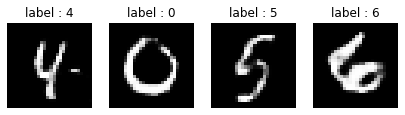

Generator loss: 0.96231127 Discriminator loss: 1.169912
epoch 93 & 200/235 Result


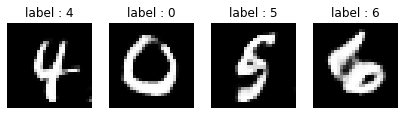

Generator loss: 0.75211734 Discriminator loss: 1.3589203
Time for epoch 94 is 13.647166967391968 sec
epoch 94 & 0/235 Result


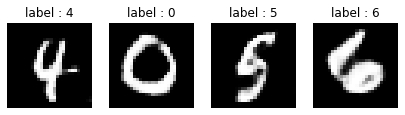

Generator loss: 0.96416324 Discriminator loss: 1.0543706
epoch 94 & 200/235 Result


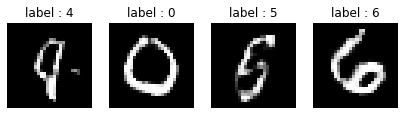

Generator loss: 0.89542246 Discriminator loss: 1.2561445
Time for epoch 95 is 13.931809425354004 sec
epoch 95 & 0/235 Result


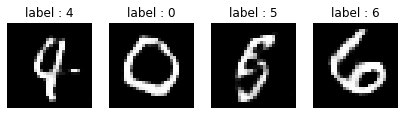

Generator loss: 0.7737354 Discriminator loss: 1.3045397
epoch 95 & 200/235 Result


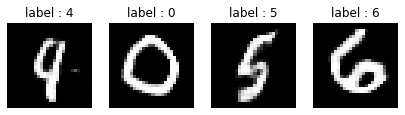

Generator loss: 0.76457167 Discriminator loss: 1.3032289
Time for epoch 96 is 13.61889934539795 sec
epoch 96 & 0/235 Result


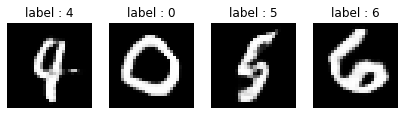

Generator loss: 0.8293622 Discriminator loss: 1.1973221
epoch 96 & 200/235 Result


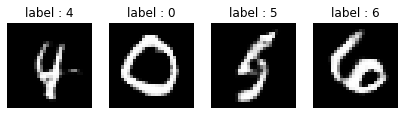

Generator loss: 0.9413077 Discriminator loss: 1.3291072
Time for epoch 97 is 13.651114463806152 sec
epoch 97 & 0/235 Result


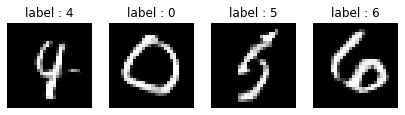

Generator loss: 0.8552555 Discriminator loss: 1.2526356
epoch 97 & 200/235 Result


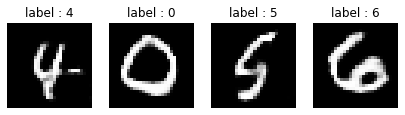

Generator loss: 0.82740706 Discriminator loss: 1.2534264
Time for epoch 98 is 13.598402976989746 sec
epoch 98 & 0/235 Result


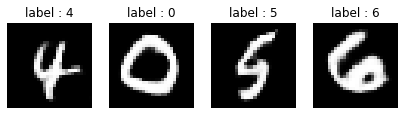

Generator loss: 0.67963964 Discriminator loss: 1.3701441
epoch 98 & 200/235 Result


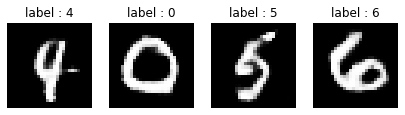

Generator loss: 0.84490764 Discriminator loss: 1.1105943
Time for epoch 99 is 13.599603414535522 sec
epoch 99 & 0/235 Result


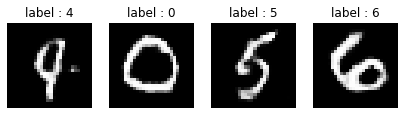

Generator loss: 0.83365977 Discriminator loss: 1.4084207
epoch 99 & 200/235 Result


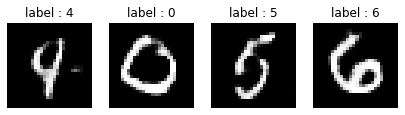

Generator loss: 0.79873794 Discriminator loss: 1.2310332
Time for epoch 100 is 13.600654125213623 sec
CPU times: user 13min 39s, sys: 9min 33s, total: 23min 12s
Wall time: 22min 39s


In [ ]:
# 학습!!!
%%time

g_losses, d_losses = train(train_dataset, EPOCHS)

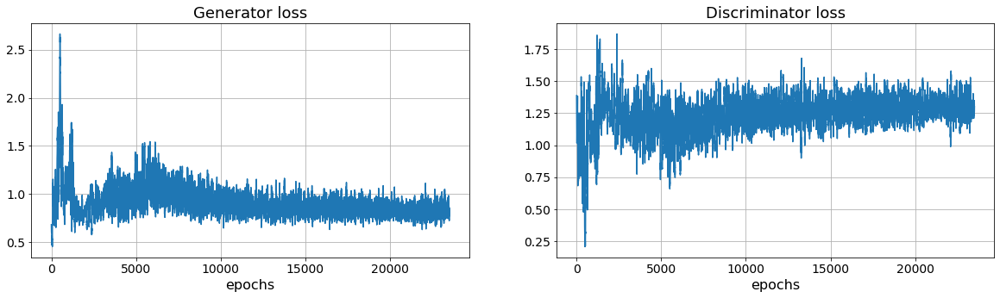

In [ ]:
import matplotlib.pyplot as plt 

plt.figure(figsize= (20,5)) 
plt.subplots_adjust(wspace = 0.2)

plt.subplot(1,2,1)  
plt.title("Generator loss",fontsize = 18) 
plt.plot(g_losses) 
plt.grid() 
plt.xlabel("epochs", fontsize = 16)          
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)


plt.subplot(1,2,2)
plt.title("Discriminator loss", fontsize = 18)
plt.plot(d_losses)
plt.grid()
plt.xlabel("epochs", fontsize = 16)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

plt.show()

- 기존 Dense 층에 비해 생성하는 이미지도 선명해 졌고 어느정도 잘 생성하는것을 확인할 수 있다. 또한 Dense 층에 비해 더욱 빠르게 특정 범위로 수렴하는것을 확인할 수 있다.

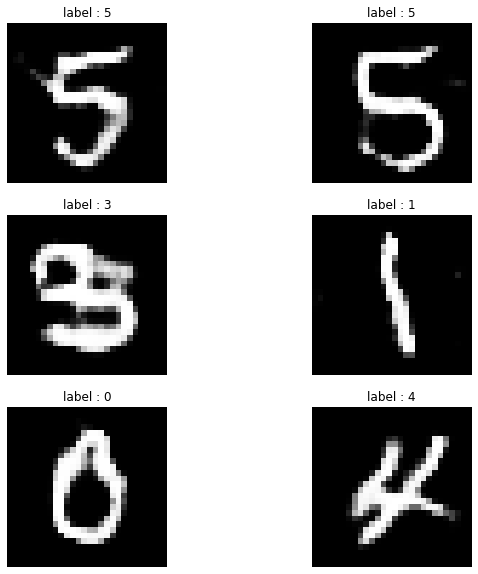

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기

import matplotlib.pyplot as plt

noises = tf.random.normal([50, 100])
test_number = tf.random.uniform(shape=(50,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)

generated_image = G([noises,test_con], training=False)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,10))

for ax in axes.flat:
  ax.axis('off')

axes[0,0].imshow(generated_image[0], cmap='gray')
axes[0,0].set_title(f'label : {test_number[0]}')
axes[0,1].imshow(generated_image[1], cmap='gray')
axes[0,1].set_title(f'label : {test_number[1]}')
axes[1,0].imshow(generated_image[2], cmap='gray')
axes[1,0].set_title(f'label : {test_number[2]}')
axes[1,1].imshow(generated_image[3], cmap='gray')
axes[1,1].set_title(f'label : {test_number[3]}')
axes[2,0].imshow(generated_image[4], cmap='gray')
axes[2,0].set_title(f'label : {test_number[4]}')
axes[2,1].imshow(generated_image[5], cmap='gray')
axes[2,1].set_title(f'label : {test_number[5]}')

plt.show()

- 생성한 이미지도 noise없이 어느정도 알아볼 수 있게 생성을 하는것을 확인할 수 있다.

In [ ]:
input_z = tf.keras.Input(shape = (50,))

input_con = tf.keras.Input(shape = (10,))
#con = tf.keras.layers.Dense(128, use_bias = False)(input_con)
#con = tf.keras.layers.BatchNormalization()(con)
#con = tf.keras.layers.LeakyReLU(alpha = 0.2)(con)

gen = tf.keras.layers.Concatenate()([input_z, input_con])
gen = tf.keras.layers.Dense(256, use_bias=False)(gen)
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen) # 논문에서는 0.2로 줌 defalut alpha = 0.3
gen = tf.keras.layers.Dense(512, use_bias = False)(gen)
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha=0.2)(gen)
gen = tf.keras.layers.Dense(1024, use_bias=False)(gen)
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Dense(28*28 , use_bias=False, activation = 'tanh')(gen)
gen_out = tf.keras.layers.Reshape(target_shape=(28,28))(gen)

G = tf.keras.Model(inputs = [input_z , input_con], outputs = gen_out)

In [ ]:
input_img = tf.keras.Input(shape = (28,28))
flatten_img = tf.keras.layers.Flatten()(input_img)


input_con = tf.keras.Input(shape = (10,))

dis = tf.keras.layers.Concatenate()([flatten_img, input_con])
dis = tf.keras.layers.Dense(256, use_bias = False)(dis)
dis = tf.keras.layers.LeakyReLU(alpha = 0.2)(dis)
dis = tf.keras.layers.Dense(512, use_bias = False)(dis)
dis = tf.keras.layers.LeakyReLU(alpha = 0.2)(dis)
dis = tf.keras.layers.Dense(512, use_bias=False)(dis)
dis = tf.keras.layers.LeakyReLU(alpha = 0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis_out = tf.keras.layers.Dense(1 , use_bias = False, activation = 'sigmoid')(dis)


D = tf.keras.Model(inputs = [input_img , input_con], outputs = dis_out)

In [ ]:
# GAN 트레이닝에 쓰일 cross-entropy fuctor 정의

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Discriminator loss 정의

def D_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

In [ ]:
# Generator loss 정의

def G_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
# GAN 트레이닝에 쓰일 optimizer 정의

G_optimizer = tf.keras.optimizers.Adam(1e-4)
D_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:

EPOCHS = 100
noise_dim = 50

seed = tf.random.normal([BATCH_SIZE, noise_dim])

In [ ]:
# 배치단위 학습 함수 설정 (* AutoGraph 기능 쓰기!)

@tf.function
def train_step(real_images, real_labels):  
  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as dsc_tape:
    fake_images = G([noises,real_labels], training=True)
    
    real_output = D([real_images, real_labels], training=True)
    fake_output = D([fake_images, real_labels], training=True)
    
    gen_loss = G_loss(fake_output)
    dsc_loss = D_loss(real_output, fake_output)
    
  gen_gradients = gen_tape.gradient(gen_loss, G.trainable_variables)
  dsc_gradients = dsc_tape.gradient(dsc_loss, D.trainable_variables)
  
  G_optimizer.apply_gradients(zip(gen_gradients, G.trainable_variables))
  D_optimizer.apply_gradients(zip(dsc_gradients, D.trainable_variables)) 

  return gen_loss, dsc_loss

In [ ]:
def test_step(real_images, real_labels):  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  fake_images = G([noises, real_labels], training=False)
  
  real_output = D([real_images, real_labels], training=False)
  fake_output = D([fake_images,real_labels], training=False)    
  
  gen_loss = G_loss(fake_output)
  dsc_loss = D_loss(real_output, fake_output)
  
  print("Generator loss:", gen_loss.numpy(), "Discriminator loss:", dsc_loss.numpy())

In [ ]:
# 학습 함수

def train(dataset, epochs):
  train_g_losses, train_d_losses = [], []

  test_noise = tf.random.normal([4, 50])
  test_number = tf.random.uniform(shape=(4,), minval=0, maxval=9, dtype=tf.int32).numpy()
  test_con = tf.keras.utils.to_categorical(test_number, 10)

  for epoch in range(epochs):
    start = time.time()
    
    for i, (image_batch, label_batch) in enumerate(dataset):
      gen_loss, dsc_loss = train_step(image_batch, label_batch)
      if i%200 == 0:
        f, axes = plt.subplots(1,4 , figsize = (7,5))

        fake_image_test = G([test_noise,test_con], training=False) 
        print(f'epoch {epoch} & {i}/{len(dataset)} Result') 

        for j,fake_img in enumerate(fake_image_test) :
          axes[j].imshow(fake_img, cmap='gray')
          axes[j].set_title(f'label : {test_number[j]}')
          axes[j].axis('off')
        plt.show()

        test_step(image_batch, label_batch)  

      train_g_losses.append(gen_loss.numpy())
      train_d_losses.append(dsc_loss.numpy())
      
    print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))   
  return train_g_losses, train_d_losses  

epoch 0 & 0/235 Result


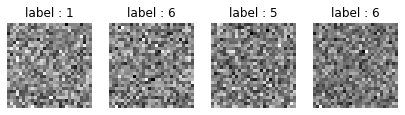

Generator loss: 0.7128618 Discriminator loss: 0.96722907
epoch 0 & 200/235 Result


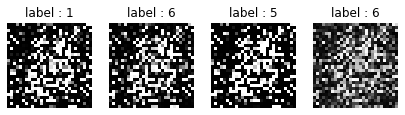

Generator loss: 10.011498 Discriminator loss: 0.032228097
Time for epoch 1 is 3.5971503257751465 sec
epoch 1 & 0/235 Result


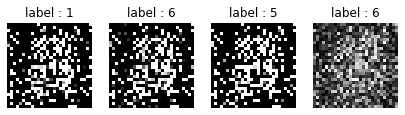

Generator loss: 8.197356 Discriminator loss: 0.03553927
epoch 1 & 200/235 Result


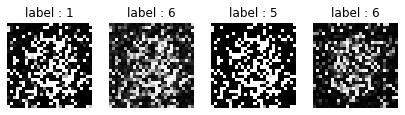

Generator loss: 10.487891 Discriminator loss: 0.018642915
Time for epoch 2 is 1.603675365447998 sec
epoch 2 & 0/235 Result


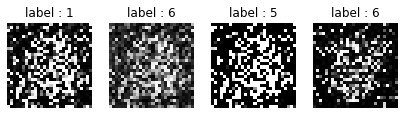

Generator loss: 11.027196 Discriminator loss: 0.009300738
epoch 2 & 200/235 Result


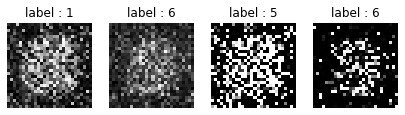

Generator loss: 9.890833 Discriminator loss: 0.018628743
Time for epoch 3 is 1.5917303562164307 sec
epoch 3 & 0/235 Result


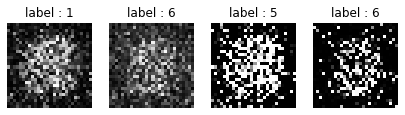

Generator loss: 8.863292 Discriminator loss: 0.11713765
epoch 3 & 200/235 Result


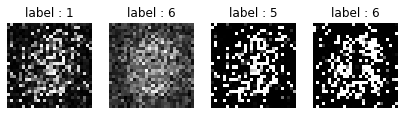

Generator loss: 9.888072 Discriminator loss: 0.0278029
Time for epoch 4 is 1.8137500286102295 sec
epoch 4 & 0/235 Result


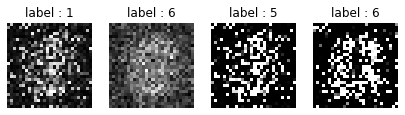

Generator loss: 7.58021 Discriminator loss: 0.11740818
epoch 4 & 200/235 Result


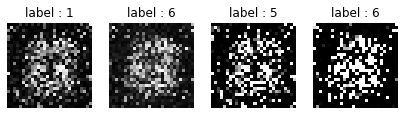

Generator loss: 9.15204 Discriminator loss: 0.21026805
Time for epoch 5 is 1.6141357421875 sec
epoch 5 & 0/235 Result


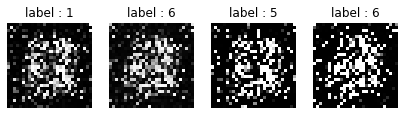

Generator loss: 24.135162 Discriminator loss: 0.15968254
epoch 5 & 200/235 Result


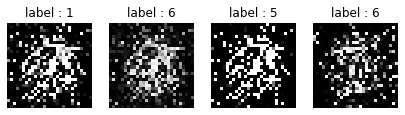

Generator loss: 6.3102045 Discriminator loss: 0.27224988
Time for epoch 6 is 1.6161541938781738 sec
epoch 6 & 0/235 Result


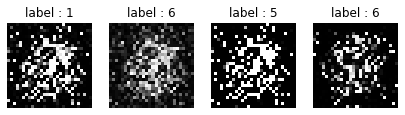

Generator loss: 10.212991 Discriminator loss: 0.1556216
epoch 6 & 200/235 Result


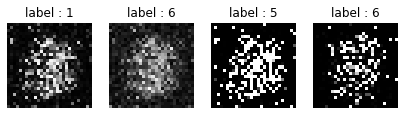

Generator loss: 7.875718 Discriminator loss: 0.058431547
Time for epoch 7 is 1.6105048656463623 sec
epoch 7 & 0/235 Result


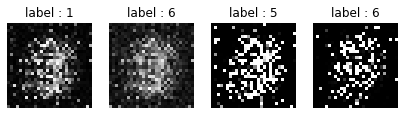

Generator loss: 6.3426533 Discriminator loss: 0.23309997
epoch 7 & 200/235 Result


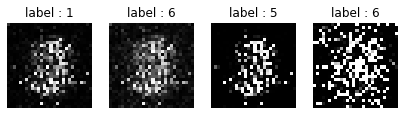

Generator loss: 6.941398 Discriminator loss: 0.23878703
Time for epoch 8 is 1.6052632331848145 sec
epoch 8 & 0/235 Result


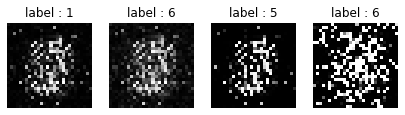

Generator loss: 7.1966677 Discriminator loss: 0.13979723
epoch 8 & 200/235 Result


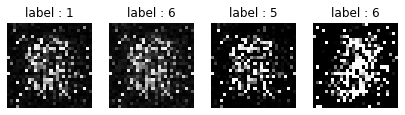

Generator loss: 10.9344425 Discriminator loss: 0.10122164
Time for epoch 9 is 1.79933500289917 sec
epoch 9 & 0/235 Result


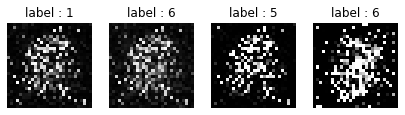

Generator loss: 9.898202 Discriminator loss: 0.08762482
epoch 9 & 200/235 Result


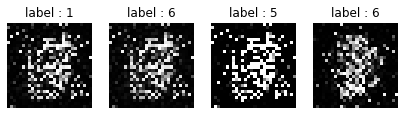

Generator loss: 6.94774 Discriminator loss: 0.33335748
Time for epoch 10 is 1.6149909496307373 sec
epoch 10 & 0/235 Result


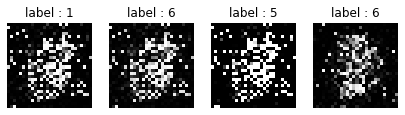

Generator loss: 8.261232 Discriminator loss: 0.110079825
epoch 10 & 200/235 Result


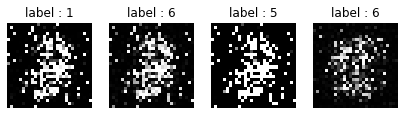

Generator loss: 6.206453 Discriminator loss: 0.05982883
Time for epoch 11 is 1.626251459121704 sec
epoch 11 & 0/235 Result


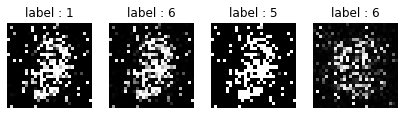

Generator loss: 6.625844 Discriminator loss: 0.11723579
epoch 11 & 200/235 Result


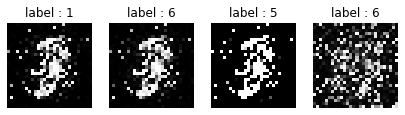

Generator loss: 6.6137466 Discriminator loss: 0.14894864
Time for epoch 12 is 1.631237506866455 sec
epoch 12 & 0/235 Result


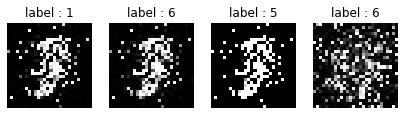

Generator loss: 9.112677 Discriminator loss: 0.24011731
epoch 12 & 200/235 Result


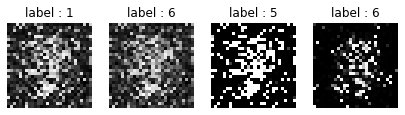

Generator loss: 7.8440566 Discriminator loss: 0.09394281
Time for epoch 13 is 1.630610466003418 sec
epoch 13 & 0/235 Result


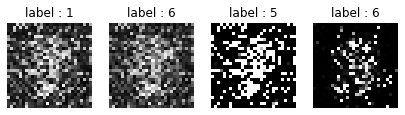

Generator loss: 7.570574 Discriminator loss: 0.09215835
epoch 13 & 200/235 Result


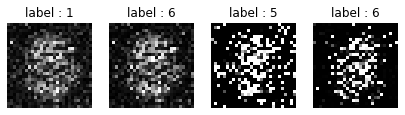

Generator loss: 6.9619174 Discriminator loss: 0.19351953
Time for epoch 14 is 1.6087572574615479 sec
epoch 14 & 0/235 Result


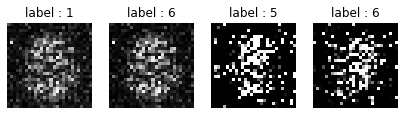

Generator loss: 9.316369 Discriminator loss: 0.16278543
epoch 14 & 200/235 Result


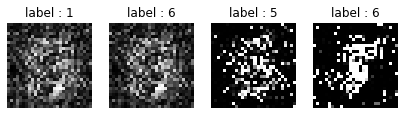

Generator loss: 9.047278 Discriminator loss: 0.14092836
Time for epoch 15 is 1.7963802814483643 sec
epoch 15 & 0/235 Result


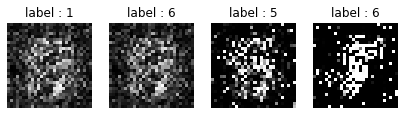

Generator loss: 10.883806 Discriminator loss: 0.104124404
epoch 15 & 200/235 Result


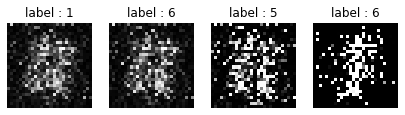

Generator loss: 5.1981206 Discriminator loss: 0.17410365
Time for epoch 16 is 1.6239402294158936 sec
epoch 16 & 0/235 Result


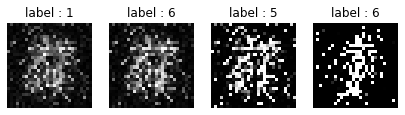

Generator loss: 6.4975905 Discriminator loss: 0.13326882
epoch 16 & 200/235 Result


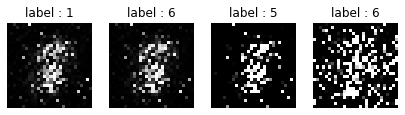

Generator loss: 5.978202 Discriminator loss: 0.19464895
Time for epoch 17 is 1.5923056602478027 sec
epoch 17 & 0/235 Result


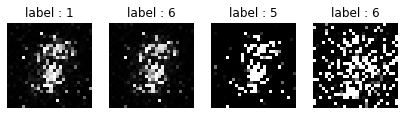

Generator loss: 7.175641 Discriminator loss: 0.23618653
epoch 17 & 200/235 Result


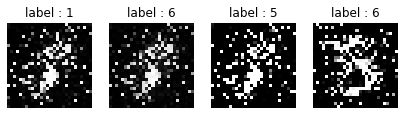

Generator loss: 6.342133 Discriminator loss: 0.06876205
Time for epoch 18 is 1.6174798011779785 sec
epoch 18 & 0/235 Result


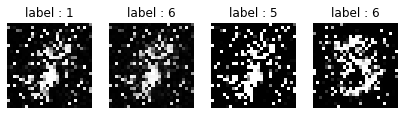

Generator loss: 6.537072 Discriminator loss: 0.15001144
epoch 18 & 200/235 Result


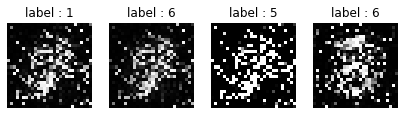

Generator loss: 6.8900495 Discriminator loss: 0.10429698
Time for epoch 19 is 1.6150844097137451 sec
epoch 19 & 0/235 Result


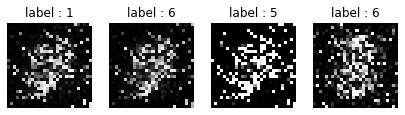

Generator loss: 8.789169 Discriminator loss: 0.20820938
epoch 19 & 200/235 Result


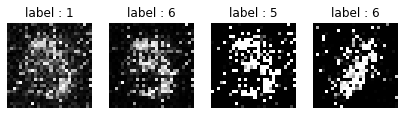

Generator loss: 6.7414885 Discriminator loss: 0.120367356
Time for epoch 20 is 1.6395978927612305 sec
epoch 20 & 0/235 Result


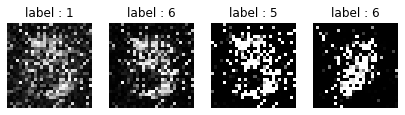

Generator loss: 7.161155 Discriminator loss: 0.22749506
epoch 20 & 200/235 Result


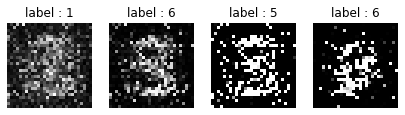

Generator loss: 5.81495 Discriminator loss: 0.24322763
Time for epoch 21 is 1.7948577404022217 sec
epoch 21 & 0/235 Result


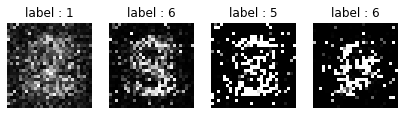

Generator loss: 5.184611 Discriminator loss: 0.10762966
epoch 21 & 200/235 Result


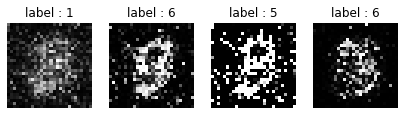

Generator loss: 5.0172167 Discriminator loss: 0.17254649
Time for epoch 22 is 1.6526203155517578 sec
epoch 22 & 0/235 Result


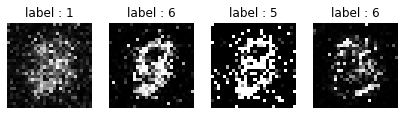

Generator loss: 7.108203 Discriminator loss: 0.2319668
epoch 22 & 200/235 Result


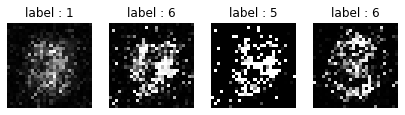

Generator loss: 7.6567235 Discriminator loss: 0.26490623
Time for epoch 23 is 1.6373326778411865 sec
epoch 23 & 0/235 Result


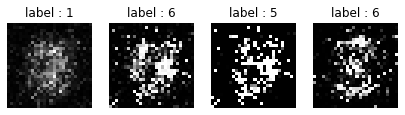

Generator loss: 6.1704025 Discriminator loss: 0.13972813
epoch 23 & 200/235 Result


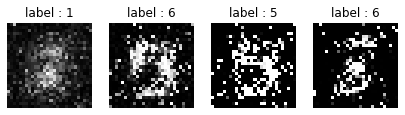

Generator loss: 7.8167787 Discriminator loss: 0.120554574
Time for epoch 24 is 1.6151514053344727 sec
epoch 24 & 0/235 Result


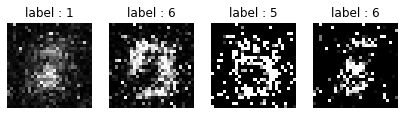

Generator loss: 7.594413 Discriminator loss: 0.10268481
epoch 24 & 200/235 Result


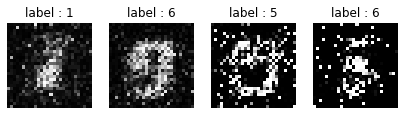

Generator loss: 5.7215133 Discriminator loss: 0.13434257
Time for epoch 25 is 1.6203432083129883 sec
epoch 25 & 0/235 Result


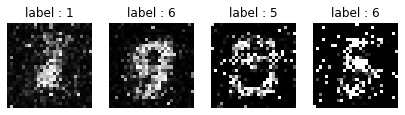

Generator loss: 7.348675 Discriminator loss: 0.15588248
epoch 25 & 200/235 Result


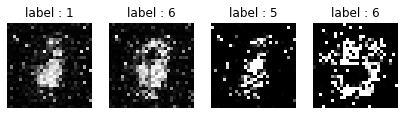

Generator loss: 6.2740784 Discriminator loss: 0.1045976
Time for epoch 26 is 1.6608562469482422 sec
epoch 26 & 0/235 Result


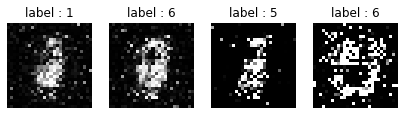

Generator loss: 5.7744055 Discriminator loss: 0.34510544
epoch 26 & 200/235 Result


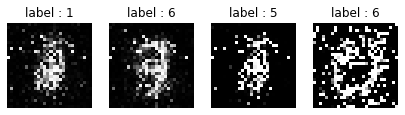

Generator loss: 8.965762 Discriminator loss: 0.098048255
Time for epoch 27 is 1.827991247177124 sec
epoch 27 & 0/235 Result


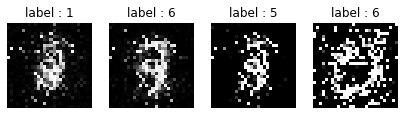

Generator loss: 9.30983 Discriminator loss: 0.17399427
epoch 27 & 200/235 Result


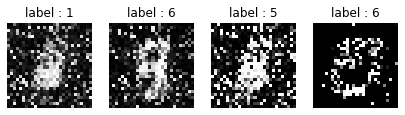

Generator loss: 12.014621 Discriminator loss: 0.17291044
Time for epoch 28 is 1.6120996475219727 sec
epoch 28 & 0/235 Result


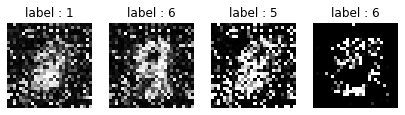

Generator loss: 10.754049 Discriminator loss: 0.11968086
epoch 28 & 200/235 Result


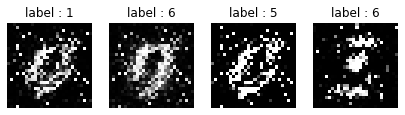

Generator loss: 9.176958 Discriminator loss: 0.12732863
Time for epoch 29 is 1.6399261951446533 sec
epoch 29 & 0/235 Result


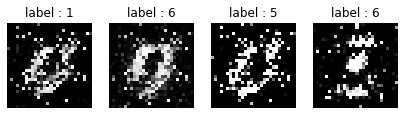

Generator loss: 9.268008 Discriminator loss: 0.20883116
epoch 29 & 200/235 Result


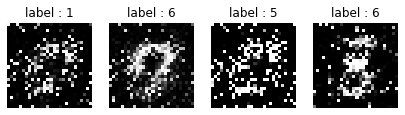

Generator loss: 5.233221 Discriminator loss: 0.1205604
Time for epoch 30 is 1.625917911529541 sec
epoch 30 & 0/235 Result


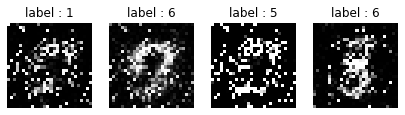

Generator loss: 7.0684385 Discriminator loss: 0.13208222
epoch 30 & 200/235 Result


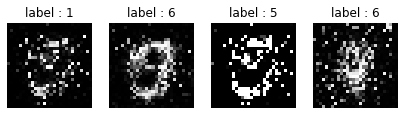

Generator loss: 5.684781 Discriminator loss: 0.14477491
Time for epoch 31 is 1.6193861961364746 sec
epoch 31 & 0/235 Result


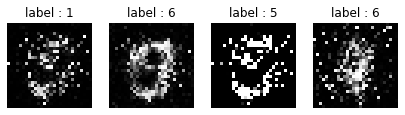

Generator loss: 7.91086 Discriminator loss: 0.08728258
epoch 31 & 200/235 Result


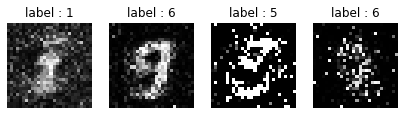

Generator loss: 7.536357 Discriminator loss: 0.1264774
Time for epoch 32 is 1.63431715965271 sec
epoch 32 & 0/235 Result


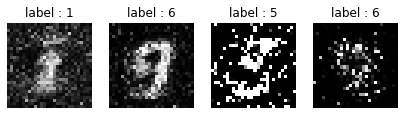

Generator loss: 7.4692764 Discriminator loss: 0.16059928
epoch 32 & 200/235 Result


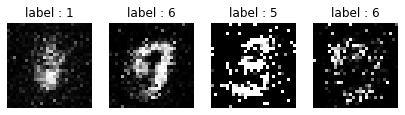

Generator loss: 6.684001 Discriminator loss: 0.27967516
Time for epoch 33 is 1.8193399906158447 sec
epoch 33 & 0/235 Result


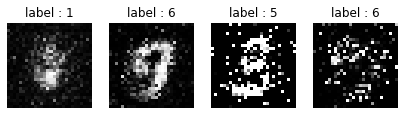

Generator loss: 7.0556536 Discriminator loss: 0.23147985
epoch 33 & 200/235 Result


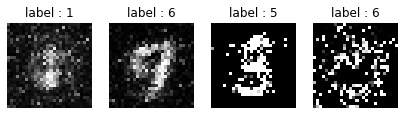

Generator loss: 7.1065464 Discriminator loss: 0.17085728
Time for epoch 34 is 1.6190025806427002 sec
epoch 34 & 0/235 Result


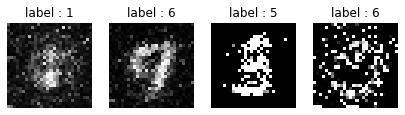

Generator loss: 7.6171684 Discriminator loss: 0.15829933
epoch 34 & 200/235 Result


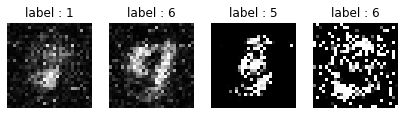

Generator loss: 8.415464 Discriminator loss: 0.24318536
Time for epoch 35 is 1.5910439491271973 sec
epoch 35 & 0/235 Result


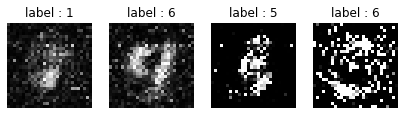

Generator loss: 9.146178 Discriminator loss: 0.20310879
epoch 35 & 200/235 Result


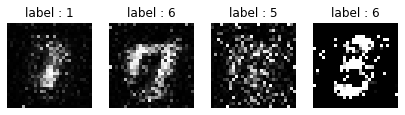

Generator loss: 5.171667 Discriminator loss: 0.23171523
Time for epoch 36 is 1.6187565326690674 sec
epoch 36 & 0/235 Result


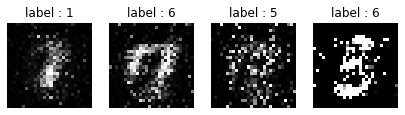

Generator loss: 7.3731146 Discriminator loss: 0.19406787
epoch 36 & 200/235 Result


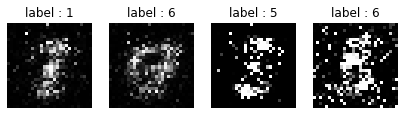

Generator loss: 5.423476 Discriminator loss: 0.17820704
Time for epoch 37 is 1.642906665802002 sec
epoch 37 & 0/235 Result


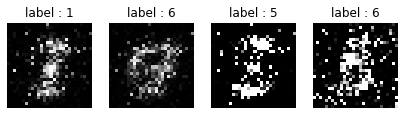

Generator loss: 4.8136587 Discriminator loss: 0.27729392
epoch 37 & 200/235 Result


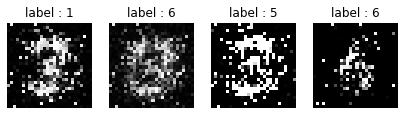

Generator loss: 6.7627635 Discriminator loss: 0.29185042
Time for epoch 38 is 1.6293303966522217 sec
epoch 38 & 0/235 Result


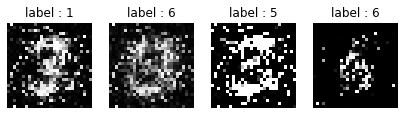

Generator loss: 7.592135 Discriminator loss: 0.36239818
epoch 38 & 200/235 Result


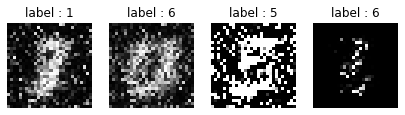

Generator loss: 11.924124 Discriminator loss: 0.26149607
Time for epoch 39 is 1.8395469188690186 sec
epoch 39 & 0/235 Result


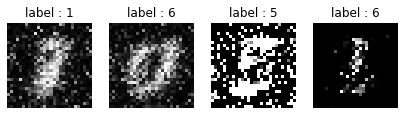

Generator loss: 11.304475 Discriminator loss: 0.19135408
epoch 39 & 200/235 Result


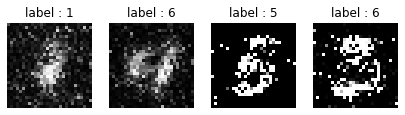

Generator loss: 5.099447 Discriminator loss: 0.15609054
Time for epoch 40 is 1.6436841487884521 sec
epoch 40 & 0/235 Result


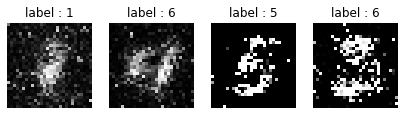

Generator loss: 5.6799545 Discriminator loss: 0.2626111
epoch 40 & 200/235 Result


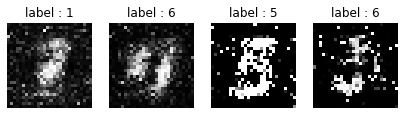

Generator loss: 4.973086 Discriminator loss: 0.2608272
Time for epoch 41 is 1.6587729454040527 sec
epoch 41 & 0/235 Result


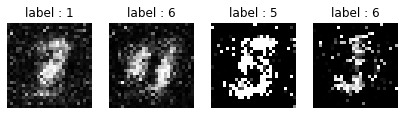

Generator loss: 4.7560434 Discriminator loss: 0.16204125
epoch 41 & 200/235 Result


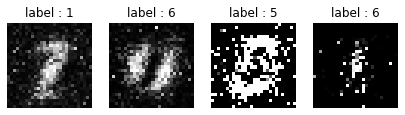

Generator loss: 7.732359 Discriminator loss: 0.11628885
Time for epoch 42 is 1.646141767501831 sec
epoch 42 & 0/235 Result


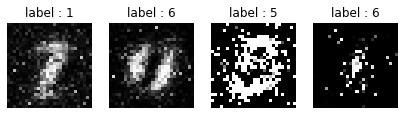

Generator loss: 6.4610014 Discriminator loss: 0.20805162
epoch 42 & 200/235 Result


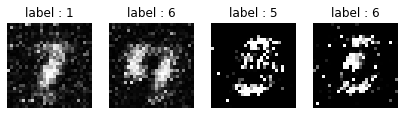

Generator loss: 6.645393 Discriminator loss: 0.27589673
Time for epoch 43 is 1.643632173538208 sec
epoch 43 & 0/235 Result


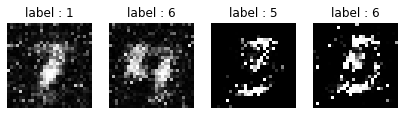

Generator loss: 7.0777526 Discriminator loss: 0.2398065
epoch 43 & 200/235 Result


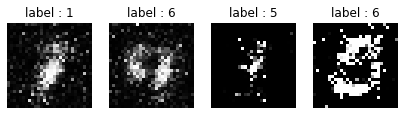

Generator loss: 6.9074173 Discriminator loss: 0.2248031
Time for epoch 44 is 1.6393609046936035 sec
epoch 44 & 0/235 Result


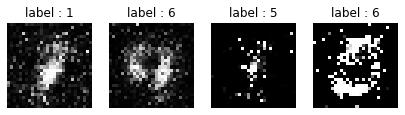

Generator loss: 6.5017734 Discriminator loss: 0.108390704
epoch 44 & 200/235 Result


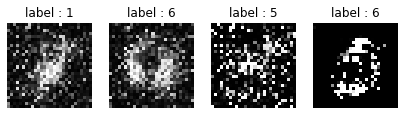

Generator loss: 6.811681 Discriminator loss: 0.28433776
Time for epoch 45 is 1.8449172973632812 sec
epoch 45 & 0/235 Result


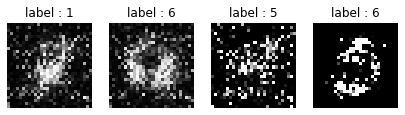

Generator loss: 6.629626 Discriminator loss: 0.1688976
epoch 45 & 200/235 Result


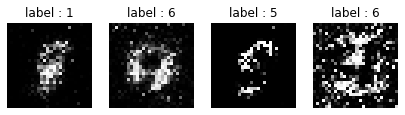

Generator loss: 5.9089975 Discriminator loss: 0.17264763
Time for epoch 46 is 1.641369104385376 sec
epoch 46 & 0/235 Result


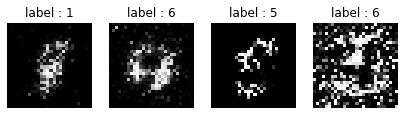

Generator loss: 7.1208487 Discriminator loss: 0.2586731
epoch 46 & 200/235 Result


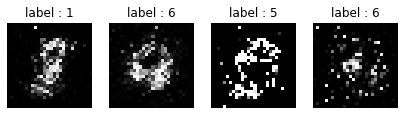

Generator loss: 4.213498 Discriminator loss: 0.41798696
Time for epoch 47 is 1.6465978622436523 sec
epoch 47 & 0/235 Result


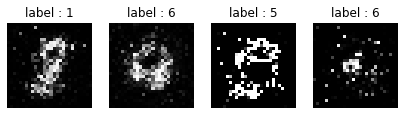

Generator loss: 4.102602 Discriminator loss: 0.24282143
epoch 47 & 200/235 Result


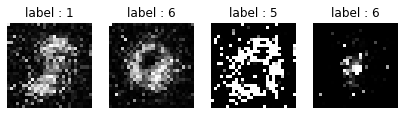

Generator loss: 6.5522537 Discriminator loss: 0.18307218
Time for epoch 48 is 1.660278558731079 sec
epoch 48 & 0/235 Result


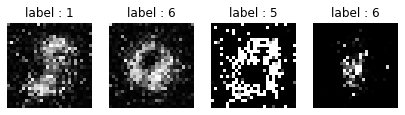

Generator loss: 5.7764254 Discriminator loss: 0.3025917
epoch 48 & 200/235 Result


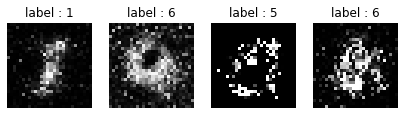

Generator loss: 6.389756 Discriminator loss: 0.25871006
Time for epoch 49 is 1.6763813495635986 sec
epoch 49 & 0/235 Result


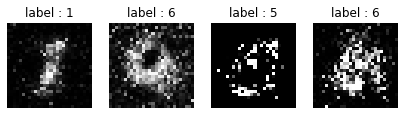

Generator loss: 5.451528 Discriminator loss: 0.21939528
epoch 49 & 200/235 Result


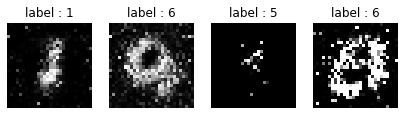

Generator loss: 7.1090765 Discriminator loss: 0.29393718
Time for epoch 50 is 1.6455135345458984 sec
epoch 50 & 0/235 Result


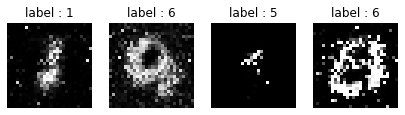

Generator loss: 5.2341614 Discriminator loss: 0.22907418
epoch 50 & 200/235 Result


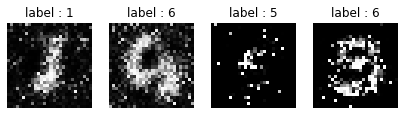

Generator loss: 5.1653485 Discriminator loss: 0.17745647
Time for epoch 51 is 1.828571081161499 sec
epoch 51 & 0/235 Result


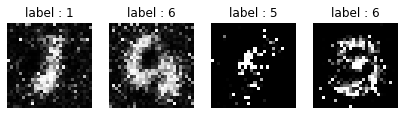

Generator loss: 5.4122157 Discriminator loss: 0.26099232
epoch 51 & 200/235 Result


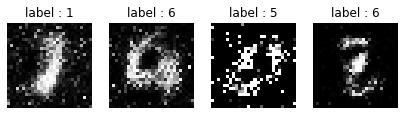

Generator loss: 5.3705864 Discriminator loss: 0.30982676
Time for epoch 52 is 1.6419658660888672 sec
epoch 52 & 0/235 Result


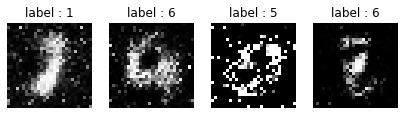

Generator loss: 5.394946 Discriminator loss: 0.40116462
epoch 52 & 200/235 Result


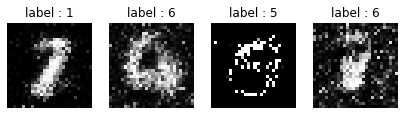

Generator loss: 5.171171 Discriminator loss: 0.27906278
Time for epoch 53 is 1.6370790004730225 sec
epoch 53 & 0/235 Result


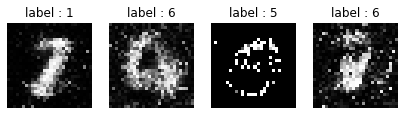

Generator loss: 4.848349 Discriminator loss: 0.40381908
epoch 53 & 200/235 Result


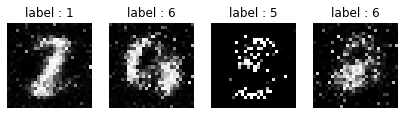

Generator loss: 4.376647 Discriminator loss: 0.43254232
Time for epoch 54 is 1.6578192710876465 sec
epoch 54 & 0/235 Result


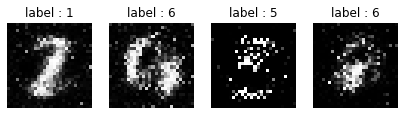

Generator loss: 4.226144 Discriminator loss: 0.323731
epoch 54 & 200/235 Result


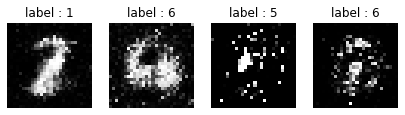

Generator loss: 3.9261546 Discriminator loss: 0.30084443
Time for epoch 55 is 1.6791362762451172 sec
epoch 55 & 0/235 Result


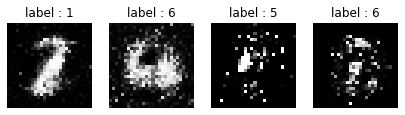

Generator loss: 2.6517534 Discriminator loss: 0.4511781
epoch 55 & 200/235 Result


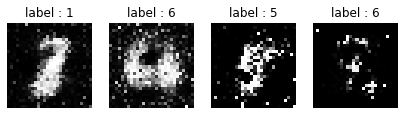

Generator loss: 3.3175774 Discriminator loss: 0.36264387
Time for epoch 56 is 1.673858880996704 sec
epoch 56 & 0/235 Result


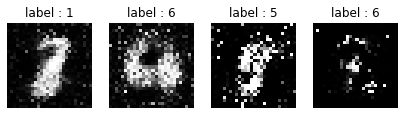

Generator loss: 2.9368863 Discriminator loss: 0.45442837
epoch 56 & 200/235 Result


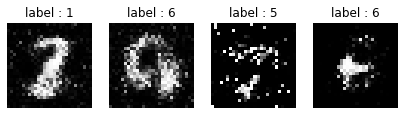

Generator loss: 3.4976678 Discriminator loss: 0.33957756
Time for epoch 57 is 1.853569746017456 sec
epoch 57 & 0/235 Result


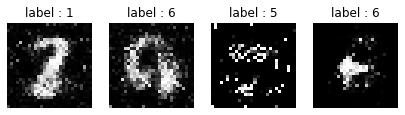

Generator loss: 4.59929 Discriminator loss: 0.4405356
epoch 57 & 200/235 Result


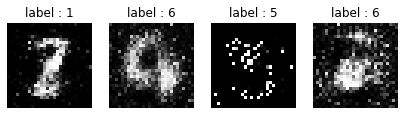

Generator loss: 3.3843577 Discriminator loss: 0.36539614
Time for epoch 58 is 1.6774718761444092 sec
epoch 58 & 0/235 Result


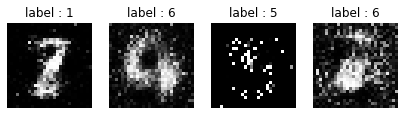

Generator loss: 3.3824222 Discriminator loss: 0.353171
epoch 58 & 200/235 Result


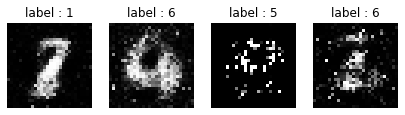

Generator loss: 3.6602263 Discriminator loss: 0.33740023
Time for epoch 59 is 1.6805248260498047 sec
epoch 59 & 0/235 Result


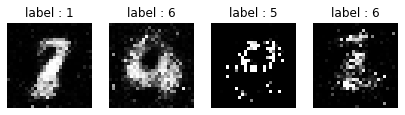

Generator loss: 3.8183465 Discriminator loss: 0.3996091
epoch 59 & 200/235 Result


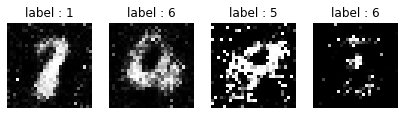

Generator loss: 3.580894 Discriminator loss: 0.40636826
Time for epoch 60 is 1.6701686382293701 sec
epoch 60 & 0/235 Result


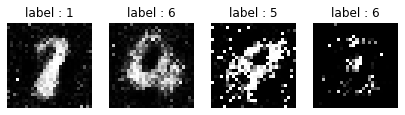

Generator loss: 3.3944573 Discriminator loss: 0.36536795
epoch 60 & 200/235 Result


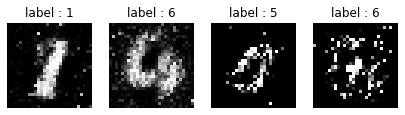

Generator loss: 3.1265872 Discriminator loss: 0.29356664
Time for epoch 61 is 1.668844223022461 sec
epoch 61 & 0/235 Result


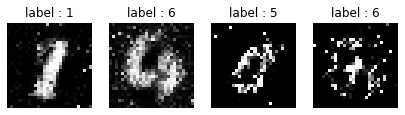

Generator loss: 3.5134463 Discriminator loss: 0.27247488
epoch 61 & 200/235 Result


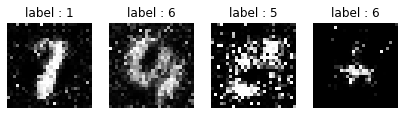

Generator loss: 3.7962532 Discriminator loss: 0.2806309
Time for epoch 62 is 1.6972951889038086 sec
epoch 62 & 0/235 Result


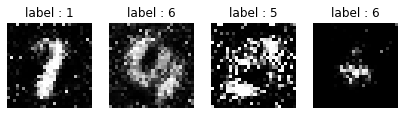

Generator loss: 4.594369 Discriminator loss: 0.5010293
epoch 62 & 200/235 Result


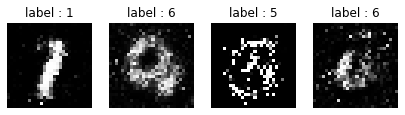

Generator loss: 3.027069 Discriminator loss: 0.35778105
Time for epoch 63 is 1.8516514301300049 sec
epoch 63 & 0/235 Result


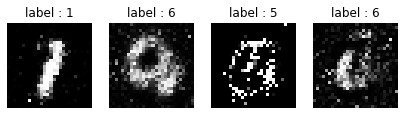

Generator loss: 2.8554401 Discriminator loss: 0.4765528
epoch 63 & 200/235 Result


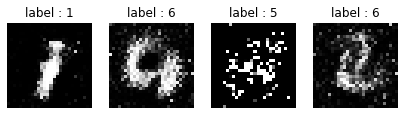

Generator loss: 2.6384423 Discriminator loss: 0.5754057
Time for epoch 64 is 1.6731746196746826 sec
epoch 64 & 0/235 Result


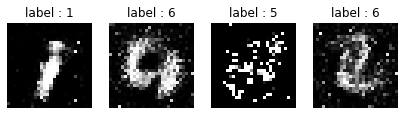

Generator loss: 2.4848318 Discriminator loss: 0.40531296
epoch 64 & 200/235 Result


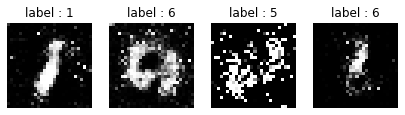

Generator loss: 3.503368 Discriminator loss: 0.44121218
Time for epoch 65 is 1.6623384952545166 sec
epoch 65 & 0/235 Result


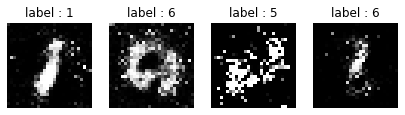

Generator loss: 3.2209885 Discriminator loss: 0.38130617
epoch 65 & 200/235 Result


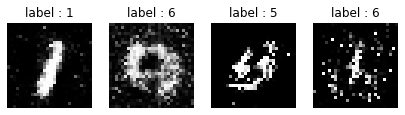

Generator loss: 3.5355086 Discriminator loss: 0.3678317
Time for epoch 66 is 1.6676063537597656 sec
epoch 66 & 0/235 Result


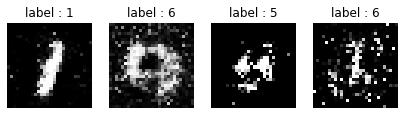

Generator loss: 2.969361 Discriminator loss: 0.36653012
epoch 66 & 200/235 Result


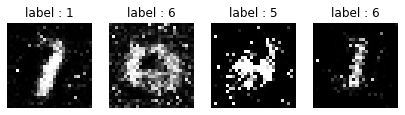

Generator loss: 3.187817 Discriminator loss: 0.36176902
Time for epoch 67 is 1.6822457313537598 sec
epoch 67 & 0/235 Result


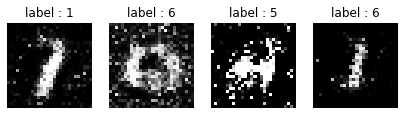

Generator loss: 4.6641135 Discriminator loss: 0.39290375
epoch 67 & 200/235 Result


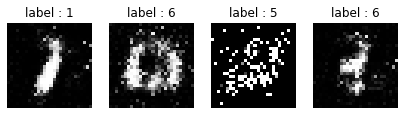

Generator loss: 4.0506816 Discriminator loss: 0.33728263
Time for epoch 68 is 1.6707589626312256 sec
epoch 68 & 0/235 Result


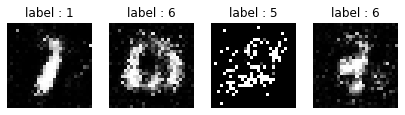

Generator loss: 2.8947008 Discriminator loss: 0.5012052
epoch 68 & 200/235 Result


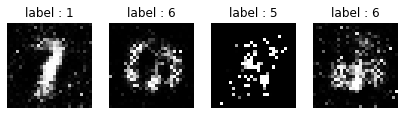

Generator loss: 6.1392794 Discriminator loss: 0.32419333
Time for epoch 69 is 1.8377764225006104 sec
epoch 69 & 0/235 Result


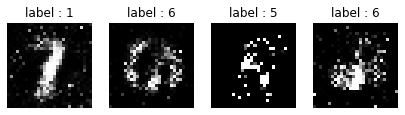

Generator loss: 5.981059 Discriminator loss: 0.42705172
epoch 69 & 200/235 Result


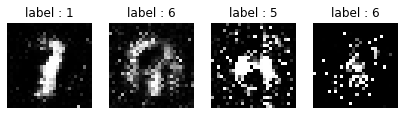

Generator loss: 3.4659894 Discriminator loss: 0.4882946
Time for epoch 70 is 1.6622319221496582 sec
epoch 70 & 0/235 Result


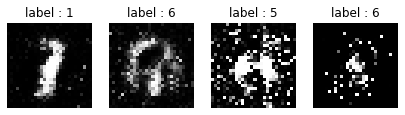

Generator loss: 3.0773318 Discriminator loss: 0.5514009
epoch 70 & 200/235 Result


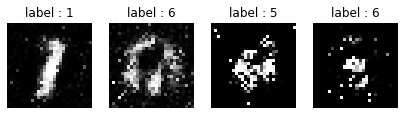

Generator loss: 2.1320949 Discriminator loss: 0.5173362
Time for epoch 71 is 1.6774108409881592 sec
epoch 71 & 0/235 Result


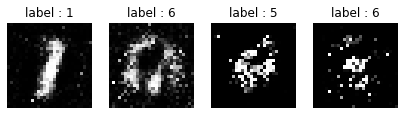

Generator loss: 2.6372356 Discriminator loss: 0.46025968
epoch 71 & 200/235 Result


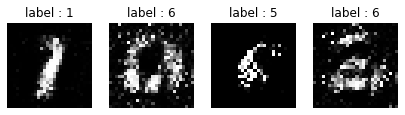

Generator loss: 2.8395467 Discriminator loss: 0.45297176
Time for epoch 72 is 1.6424782276153564 sec
epoch 72 & 0/235 Result


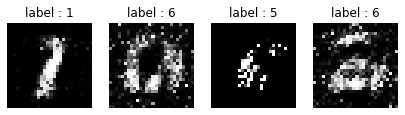

Generator loss: 3.5018723 Discriminator loss: 0.53456914
epoch 72 & 200/235 Result


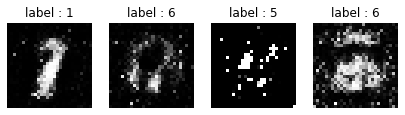

Generator loss: 2.12214 Discriminator loss: 0.5087602
Time for epoch 73 is 1.6544859409332275 sec
epoch 73 & 0/235 Result


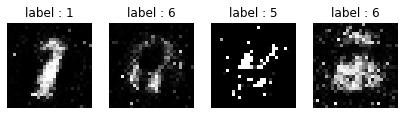

Generator loss: 2.0057077 Discriminator loss: 0.7283245
epoch 73 & 200/235 Result


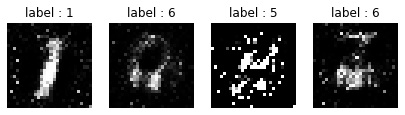

Generator loss: 2.6663966 Discriminator loss: 0.7117343
Time for epoch 74 is 1.6505205631256104 sec
epoch 74 & 0/235 Result


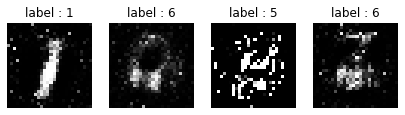

Generator loss: 2.6077895 Discriminator loss: 0.510343
epoch 74 & 200/235 Result


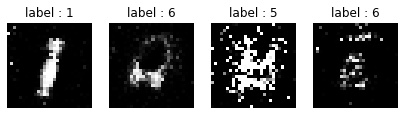

Generator loss: 2.8380551 Discriminator loss: 0.5906086
Time for epoch 75 is 1.8706872463226318 sec
epoch 75 & 0/235 Result


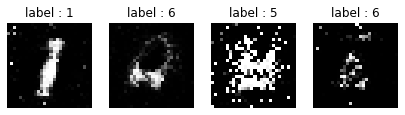

Generator loss: 2.9094143 Discriminator loss: 0.4873109
epoch 75 & 200/235 Result


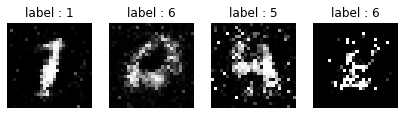

Generator loss: 2.1935287 Discriminator loss: 0.5685487
Time for epoch 76 is 1.683727741241455 sec
epoch 76 & 0/235 Result


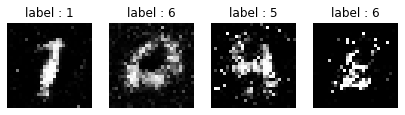

Generator loss: 2.6290998 Discriminator loss: 0.5833825
epoch 76 & 200/235 Result


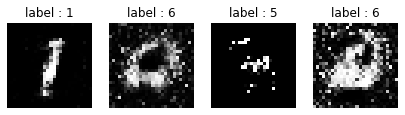

Generator loss: 2.087343 Discriminator loss: 0.6244168
Time for epoch 77 is 1.6845815181732178 sec
epoch 77 & 0/235 Result


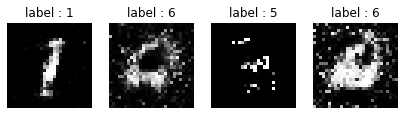

Generator loss: 3.0629148 Discriminator loss: 0.6770397
epoch 77 & 200/235 Result


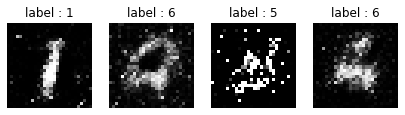

Generator loss: 1.7268105 Discriminator loss: 0.7695166
Time for epoch 78 is 1.6653656959533691 sec
epoch 78 & 0/235 Result


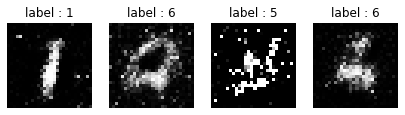

Generator loss: 2.645744 Discriminator loss: 0.58448064
epoch 78 & 200/235 Result


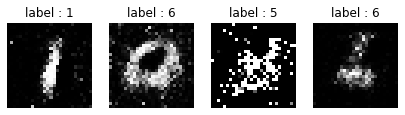

Generator loss: 2.3132942 Discriminator loss: 0.62807286
Time for epoch 79 is 1.6969482898712158 sec
epoch 79 & 0/235 Result


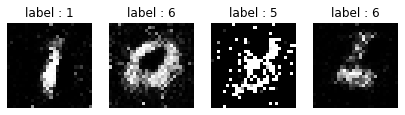

Generator loss: 2.2182846 Discriminator loss: 0.5499103
epoch 79 & 200/235 Result


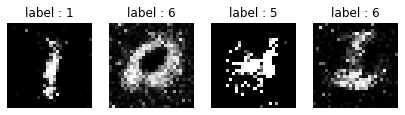

Generator loss: 2.6808417 Discriminator loss: 0.6680083
Time for epoch 80 is 1.6674737930297852 sec
epoch 80 & 0/235 Result


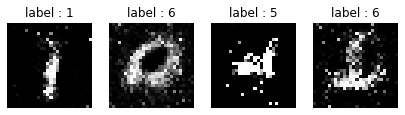

Generator loss: 2.978071 Discriminator loss: 0.6310228
epoch 80 & 200/235 Result


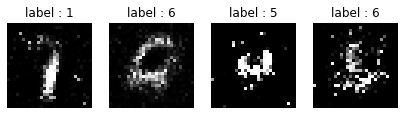

Generator loss: 2.951861 Discriminator loss: 0.3876739
Time for epoch 81 is 1.857914924621582 sec
epoch 81 & 0/235 Result


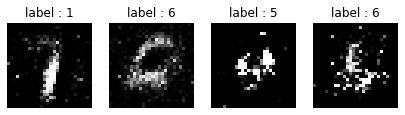

Generator loss: 2.0596428 Discriminator loss: 0.60069263
epoch 81 & 200/235 Result


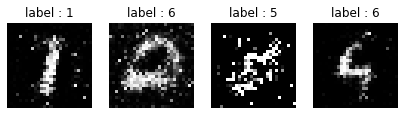

Generator loss: 4.218057 Discriminator loss: 0.43153915
Time for epoch 82 is 1.6655054092407227 sec
epoch 82 & 0/235 Result


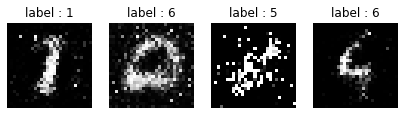

Generator loss: 3.3974159 Discriminator loss: 0.612958
epoch 82 & 200/235 Result


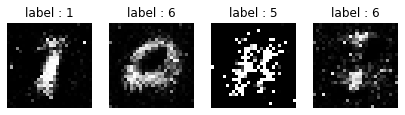

Generator loss: 2.4541636 Discriminator loss: 0.65958554
Time for epoch 83 is 1.6673476696014404 sec
epoch 83 & 0/235 Result


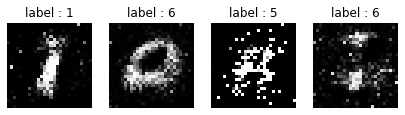

Generator loss: 2.4916816 Discriminator loss: 0.5520321
epoch 83 & 200/235 Result


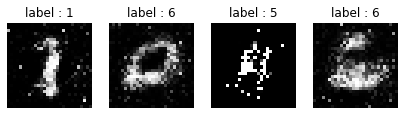

Generator loss: 2.4826987 Discriminator loss: 0.6352891
Time for epoch 84 is 1.6500701904296875 sec
epoch 84 & 0/235 Result


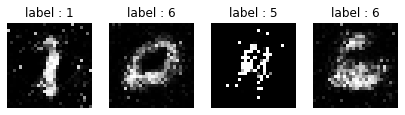

Generator loss: 2.8706641 Discriminator loss: 0.6867656
epoch 84 & 200/235 Result


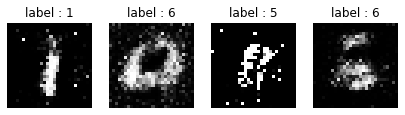

Generator loss: 2.3238711 Discriminator loss: 0.6338146
Time for epoch 85 is 1.6544032096862793 sec
epoch 85 & 0/235 Result


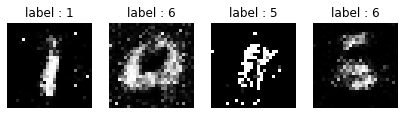

Generator loss: 2.340716 Discriminator loss: 0.52244854
epoch 85 & 200/235 Result


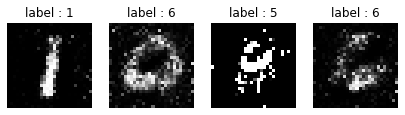

Generator loss: 2.1756067 Discriminator loss: 0.5907507
Time for epoch 86 is 1.6729249954223633 sec
epoch 86 & 0/235 Result


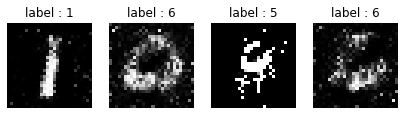

Generator loss: 1.8842294 Discriminator loss: 0.77579325
epoch 86 & 200/235 Result


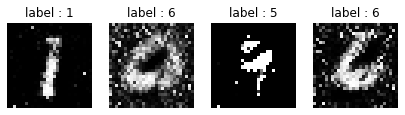

Generator loss: 2.3317406 Discriminator loss: 0.4996397
Time for epoch 87 is 1.875023365020752 sec
epoch 87 & 0/235 Result


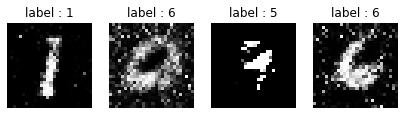

Generator loss: 2.3640316 Discriminator loss: 0.6840533
epoch 87 & 200/235 Result


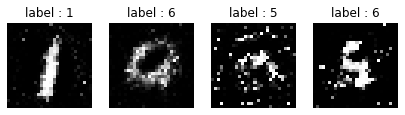

Generator loss: 1.7020128 Discriminator loss: 0.7473234
Time for epoch 88 is 1.6490838527679443 sec
epoch 88 & 0/235 Result


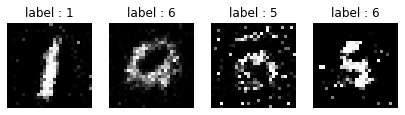

Generator loss: 2.3598423 Discriminator loss: 0.5344482
epoch 88 & 200/235 Result


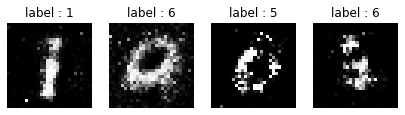

Generator loss: 2.1916175 Discriminator loss: 0.5544186
Time for epoch 89 is 1.6359052658081055 sec
epoch 89 & 0/235 Result


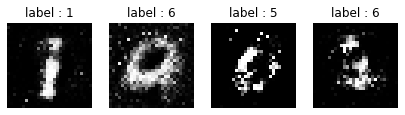

Generator loss: 2.2231662 Discriminator loss: 0.67002356
epoch 89 & 200/235 Result


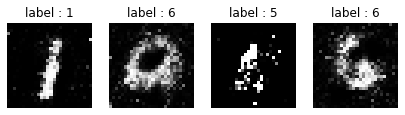

Generator loss: 2.6889968 Discriminator loss: 0.54275405
Time for epoch 90 is 1.668583869934082 sec
epoch 90 & 0/235 Result


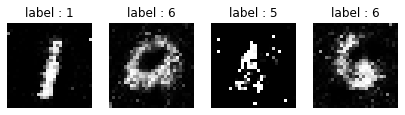

Generator loss: 2.1830754 Discriminator loss: 0.65036035
epoch 90 & 200/235 Result


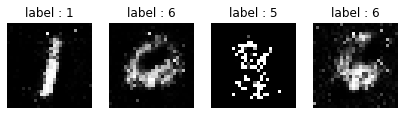

Generator loss: 2.8599865 Discriminator loss: 0.46938232
Time for epoch 91 is 1.68174409866333 sec
epoch 91 & 0/235 Result


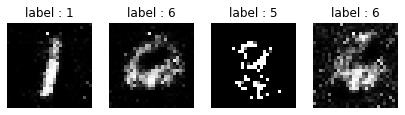

Generator loss: 2.1505752 Discriminator loss: 0.8792345
epoch 91 & 200/235 Result


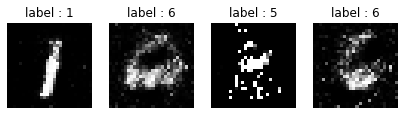

Generator loss: 2.4405308 Discriminator loss: 0.6822865
Time for epoch 92 is 1.6502249240875244 sec
epoch 92 & 0/235 Result


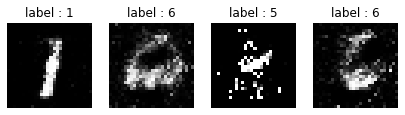

Generator loss: 2.1394541 Discriminator loss: 0.72130436
epoch 92 & 200/235 Result


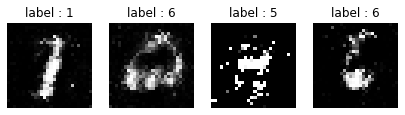

Generator loss: 2.2743692 Discriminator loss: 0.7337991
Time for epoch 93 is 1.8705682754516602 sec
epoch 93 & 0/235 Result


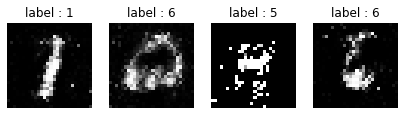

Generator loss: 1.8980271 Discriminator loss: 0.987024
epoch 93 & 200/235 Result


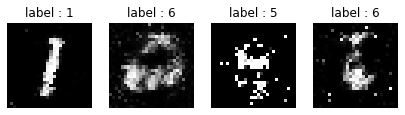

Generator loss: 2.820312 Discriminator loss: 0.6232611
Time for epoch 94 is 1.6579372882843018 sec
epoch 94 & 0/235 Result


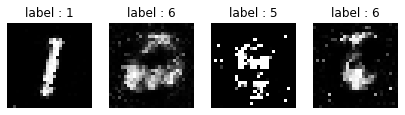

Generator loss: 2.345254 Discriminator loss: 0.53541005
epoch 94 & 200/235 Result


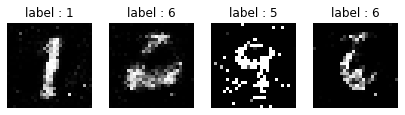

Generator loss: 2.6835012 Discriminator loss: 0.5828052
Time for epoch 95 is 1.657597541809082 sec
epoch 95 & 0/235 Result


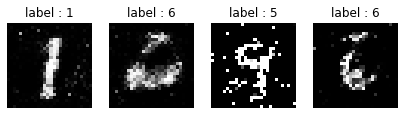

Generator loss: 3.5894535 Discriminator loss: 0.69203544
epoch 95 & 200/235 Result


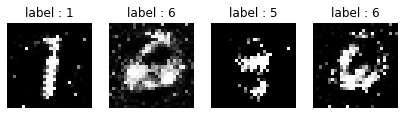

Generator loss: 2.4109406 Discriminator loss: 0.46693656
Time for epoch 96 is 1.6511006355285645 sec
epoch 96 & 0/235 Result


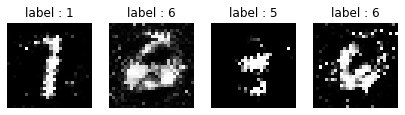

Generator loss: 2.6187365 Discriminator loss: 0.60475564
epoch 96 & 200/235 Result


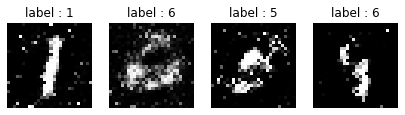

Generator loss: 2.3903306 Discriminator loss: 0.5871792
Time for epoch 97 is 1.6646955013275146 sec
epoch 97 & 0/235 Result


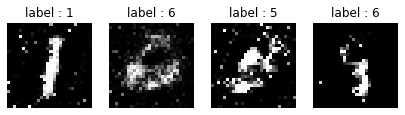

Generator loss: 2.4100084 Discriminator loss: 0.5209063
epoch 97 & 200/235 Result


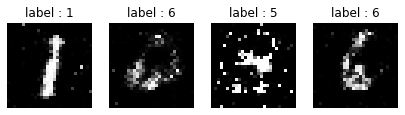

Generator loss: 2.4887607 Discriminator loss: 0.8268251
Time for epoch 98 is 1.6651620864868164 sec
epoch 98 & 0/235 Result


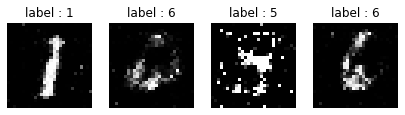

Generator loss: 2.020352 Discriminator loss: 0.6111473
epoch 98 & 200/235 Result


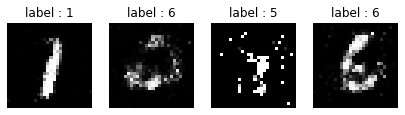

Generator loss: 1.6299167 Discriminator loss: 0.92842853
Time for epoch 99 is 1.9170830249786377 sec
epoch 99 & 0/235 Result


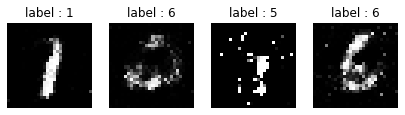

Generator loss: 2.4096577 Discriminator loss: 0.60928303
epoch 99 & 200/235 Result


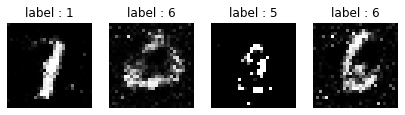

Generator loss: 2.3310068 Discriminator loss: 0.5884134
Time for epoch 100 is 1.6678521633148193 sec
CPU times: user 3min 2s, sys: 15.5 s, total: 3min 17s
Wall time: 2min 49s


In [ ]:
# 학습!!!
%%time

g_losses, d_losses = train(train_dataset, EPOCHS)

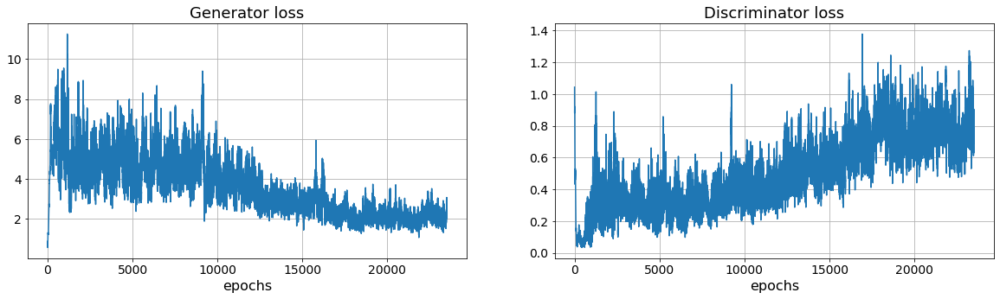

In [ ]:
import matplotlib.pyplot as plt 

plt.figure(figsize= (20,5)) 
plt.subplots_adjust(wspace = 0.2)

plt.subplot(1,2,1)  
plt.title("Generator loss",fontsize = 18) 
plt.plot(g_losses) 
plt.grid() 
plt.xlabel("epochs", fontsize = 16)          
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)


plt.subplot(1,2,2)
plt.title("Discriminator loss", fontsize = 18)
plt.plot(d_losses)
plt.grid()
plt.xlabel("epochs", fontsize = 16)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

plt.show()

- loss는 유사하지만 생성하는 이미지의 퀄리티가 떨어지는것을 확인할 수 있다. 또한 제대로 생성하지 못하는것을 볼 수 있다.

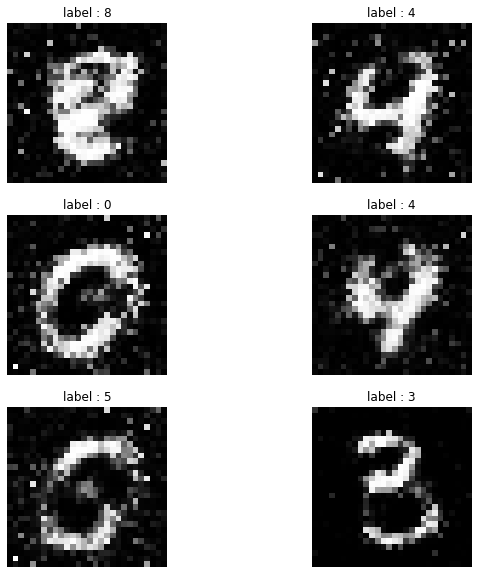

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기

import matplotlib.pyplot as plt

noises = tf.random.normal([50, 50])
test_number = tf.random.uniform(shape=(50,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)

generated_image = G([noises,test_con], training=False)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,10))

for ax in axes.flat:
  ax.axis('off')

axes[0,0].imshow(generated_image[0], cmap='gray')
axes[0,0].set_title(f'label : {test_number[0]}')
axes[0,1].imshow(generated_image[1], cmap='gray')
axes[0,1].set_title(f'label : {test_number[1]}')
axes[1,0].imshow(generated_image[2], cmap='gray')
axes[1,0].set_title(f'label : {test_number[2]}')
axes[1,1].imshow(generated_image[3], cmap='gray')
axes[1,1].set_title(f'label : {test_number[3]}')
axes[2,0].imshow(generated_image[4], cmap='gray')
axes[2,0].set_title(f'label : {test_number[4]}')
axes[2,1].imshow(generated_image[5], cmap='gray')
axes[2,1].set_title(f'label : {test_number[5]}')

plt.show()

- 생성또한 제대로 못하는것을 확인할 수 있다. noise dim이 클 수록 보다 학습을 잘 하는것을 확인할 수 있다.

In [ ]:
input_z = tf.keras.Input(shape = (50,))

input_con = tf.keras.Input(shape = (10,))

gen = tf.keras.layers.Concatenate()([input_z, input_con])
gen = tf.keras.layers.Dense(7 * 7 * 256, use_bias = False)(gen)   
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Reshape(target_shape=(7, 7 ,256))(gen)         
gen = tf.keras.layers.Conv2DTranspose(128, (5,5), strides=(1,1), padding='same', use_bias =False)(gen)  
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias =False)(gen)     
gen = tf.keras.layers.BatchNormalization()(gen)
gen = tf.keras.layers.LeakyReLU(alpha = 0.2)(gen)
gen = tf.keras.layers.Conv2DTranspose(1, (5,5), strides=(2,2), padding='same', use_bias =False, activation='tanh')(gen)  
gen_out = tf.keras.layers.Reshape(target_shape=(28, 28))(gen)   # 28x28 크기 gray 영상으로 크기 변환

G = tf.keras.Model(inputs = [input_z , input_con], outputs = gen_out)

In [ ]:
input_img = tf.keras.Input(shape = (28,28))
reshape_img = tf.keras.layers.Reshape(target_shape = (28,28,1))(input_img)


input_con = tf.keras.Input(shape = (10,))
reshape_con = tf.keras.layers.Dense(28*28, use_bias=False)(input_con)
reshape_con = tf.keras.layers.Reshape(target_shape=(28,28,1))(reshape_con)

dis = tf.keras.layers.Concatenate()([reshape_img, reshape_con])
dis = tf.keras.layers.Conv2D(64, (5,5), strides=(2, 2), padding='same')(dis)
dis = tf.keras.layers.LeakyReLU(alpha=0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis = tf.keras.layers.Conv2D(128, (5,5), strides=(2, 2), padding='same')(dis)
dis = tf.keras.layers.LeakyReLU(alpha=0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis = tf.keras.layers.Flatten()(dis)
dis_out = tf.keras.layers.Dense(1, activation = 'sigmoid')(dis)


D = tf.keras.Model(inputs = [input_img , input_con], outputs = dis_out)

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

G_optimizer = tf.keras.optimizers.Adam(1e-4)
D_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
# 배치단위 학습 함수 설정 (* AutoGraph 기능 쓰기!)

@tf.function
def train_step(real_images, real_labels):  
  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as dsc_tape:
    fake_images = G([noises,real_labels], training=True)
    
    real_output = D([real_images, real_labels], training=True)
    fake_output = D([fake_images, real_labels], training=True)
    
    gen_loss = G_loss(fake_output)
    dsc_loss = D_loss(real_output, fake_output)
    
  gen_gradients = gen_tape.gradient(gen_loss, G.trainable_variables)
  dsc_gradients = dsc_tape.gradient(dsc_loss, D.trainable_variables)
  
  G_optimizer.apply_gradients(zip(gen_gradients, G.trainable_variables))
  D_optimizer.apply_gradients(zip(dsc_gradients, D.trainable_variables)) 

  return gen_loss, dsc_loss

In [ ]:
def test_step(real_images, real_labels):  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  fake_images = G([noises, real_labels], training=False)
  
  real_output = D([real_images, real_labels], training=False)
  fake_output = D([fake_images,real_labels], training=False)    
  
  gen_loss = G_loss(fake_output)
  dsc_loss = D_loss(real_output, fake_output)
  
  print("Generator loss:", gen_loss.numpy(), "Discriminator loss:", dsc_loss.numpy())

In [ ]:
EPOCHS = 100
noise_dim = 50

seed = tf.random.normal([BATCH_SIZE, noise_dim])

epoch 0 & 0/235 Result


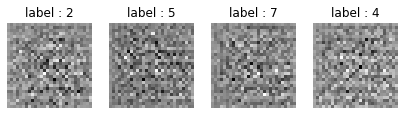

Generator loss: 0.6914804 Discriminator loss: 1.3046188
epoch 0 & 200/235 Result


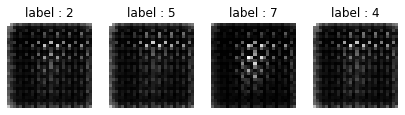

Generator loss: 0.60468864 Discriminator loss: 1.2034242
Time for epoch 1 is 14.586515665054321 sec
epoch 1 & 0/235 Result


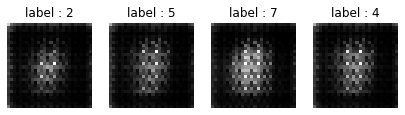

Generator loss: 0.8144632 Discriminator loss: 1.1545312
epoch 1 & 200/235 Result


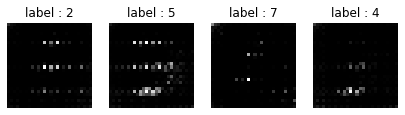

Generator loss: 0.928699 Discriminator loss: 0.9253032
Time for epoch 2 is 12.857492685317993 sec
epoch 2 & 0/235 Result


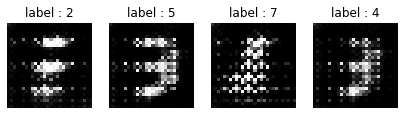

Generator loss: 1.0661376 Discriminator loss: 0.9357276
epoch 2 & 200/235 Result


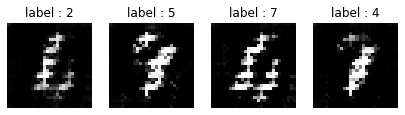

Generator loss: 0.83093137 Discriminator loss: 1.2811644
Time for epoch 3 is 12.806578159332275 sec
epoch 3 & 0/235 Result


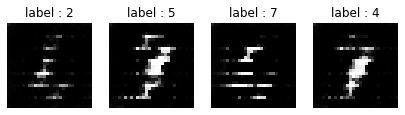

Generator loss: 1.4617562 Discriminator loss: 0.68933725
epoch 3 & 200/235 Result


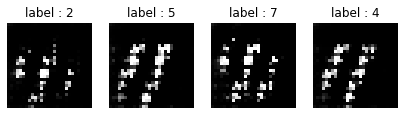

Generator loss: 0.5686022 Discriminator loss: 1.5375216
Time for epoch 4 is 12.923876762390137 sec
epoch 4 & 0/235 Result


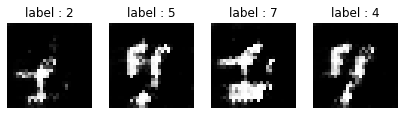

Generator loss: 1.4291048 Discriminator loss: 0.754092
epoch 4 & 200/235 Result


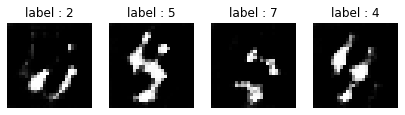

Generator loss: 0.82738 Discriminator loss: 1.4547507
Time for epoch 5 is 13.052612066268921 sec
epoch 5 & 0/235 Result


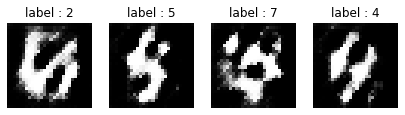

Generator loss: 0.8485006 Discriminator loss: 1.2362309
epoch 5 & 200/235 Result


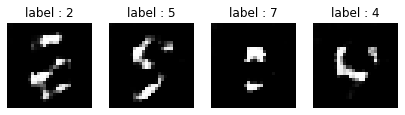

Generator loss: 0.7954737 Discriminator loss: 1.3076532
Time for epoch 6 is 13.131184816360474 sec
epoch 6 & 0/235 Result


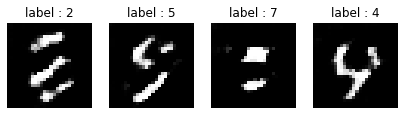

Generator loss: 0.83357817 Discriminator loss: 1.2218026
epoch 6 & 200/235 Result


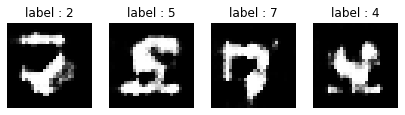

Generator loss: 0.6889589 Discriminator loss: 1.4120295
Time for epoch 7 is 13.230163812637329 sec
epoch 7 & 0/235 Result


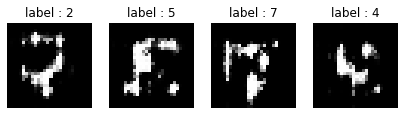

Generator loss: 0.88566947 Discriminator loss: 1.1591793
epoch 7 & 200/235 Result


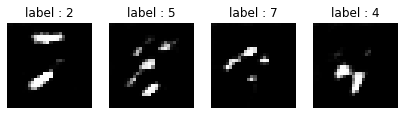

Generator loss: 0.612122 Discriminator loss: 1.5078406
Time for epoch 8 is 13.543033123016357 sec
epoch 8 & 0/235 Result


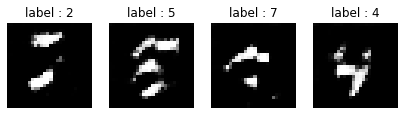

Generator loss: 0.7677034 Discriminator loss: 1.3827964
epoch 8 & 200/235 Result


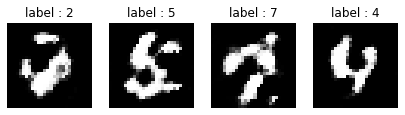

Generator loss: 0.6363542 Discriminator loss: 1.5579902
Time for epoch 9 is 13.435484409332275 sec
epoch 9 & 0/235 Result


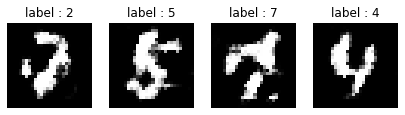

Generator loss: 0.91059726 Discriminator loss: 1.143637
epoch 9 & 200/235 Result


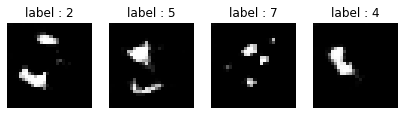

Generator loss: 1.1540262 Discriminator loss: 0.8861133
Time for epoch 10 is 13.520298719406128 sec
epoch 10 & 0/235 Result


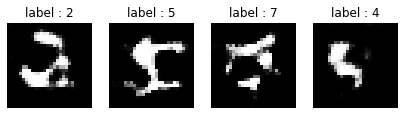

Generator loss: 0.8325822 Discriminator loss: 1.3331581
epoch 10 & 200/235 Result


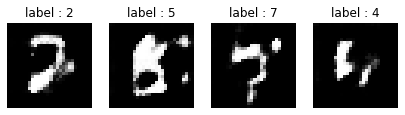

Generator loss: 0.8416588 Discriminator loss: 1.2908616
Time for epoch 11 is 13.548911571502686 sec
epoch 11 & 0/235 Result


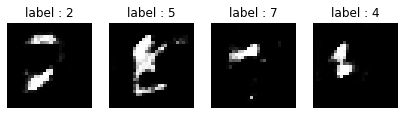

Generator loss: 0.889555 Discriminator loss: 1.1390302
epoch 11 & 200/235 Result


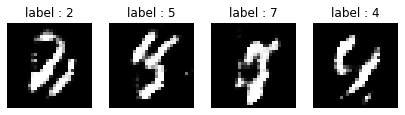

Generator loss: 0.7593919 Discriminator loss: 1.3554637
Time for epoch 12 is 13.541072368621826 sec
epoch 12 & 0/235 Result


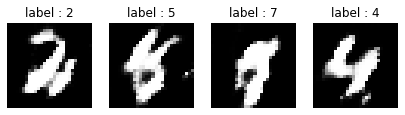

Generator loss: 1.4424387 Discriminator loss: 0.82847923
epoch 12 & 200/235 Result


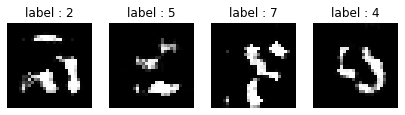

Generator loss: 1.0145161 Discriminator loss: 1.2549937
Time for epoch 13 is 13.490631818771362 sec
epoch 13 & 0/235 Result


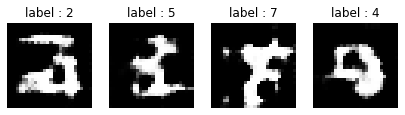

Generator loss: 0.94128567 Discriminator loss: 1.1385252
epoch 13 & 200/235 Result


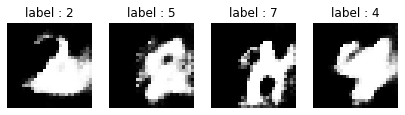

Generator loss: 1.813972 Discriminator loss: 0.6896088
Time for epoch 14 is 13.69835901260376 sec
epoch 14 & 0/235 Result


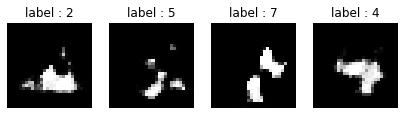

Generator loss: 1.356885 Discriminator loss: 0.7925
epoch 14 & 200/235 Result


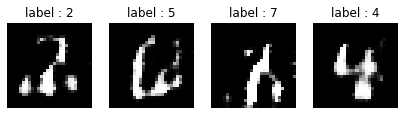

Generator loss: 0.9862695 Discriminator loss: 1.128061
Time for epoch 15 is 13.498911619186401 sec
epoch 15 & 0/235 Result


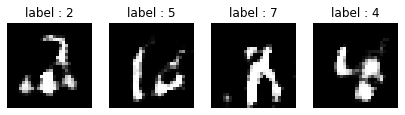

Generator loss: 1.2477285 Discriminator loss: 0.79103744
epoch 15 & 200/235 Result


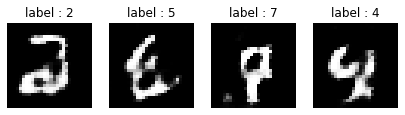

Generator loss: 1.2783467 Discriminator loss: 0.9214368
Time for epoch 16 is 13.516262769699097 sec
epoch 16 & 0/235 Result


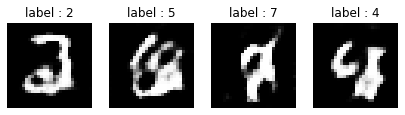

Generator loss: 0.92875135 Discriminator loss: 1.2173066
epoch 16 & 200/235 Result


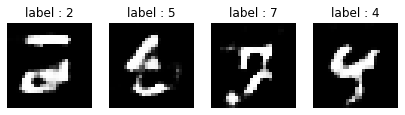

Generator loss: 1.0925736 Discriminator loss: 0.9966372
Time for epoch 17 is 13.512187242507935 sec
epoch 17 & 0/235 Result


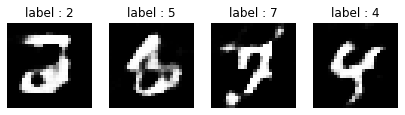

Generator loss: 1.2142311 Discriminator loss: 0.93941903
epoch 17 & 200/235 Result


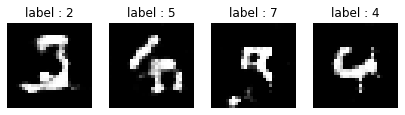

Generator loss: 1.1024382 Discriminator loss: 0.9114977
Time for epoch 18 is 13.539169311523438 sec
epoch 18 & 0/235 Result


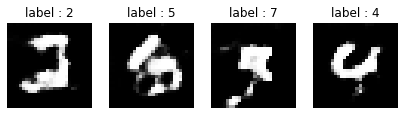

Generator loss: 1.1544595 Discriminator loss: 0.90533006
epoch 18 & 200/235 Result


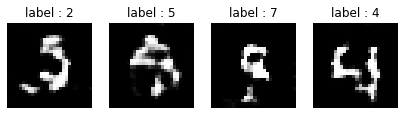

Generator loss: 1.1154077 Discriminator loss: 1.0545138
Time for epoch 19 is 13.538484811782837 sec
epoch 19 & 0/235 Result


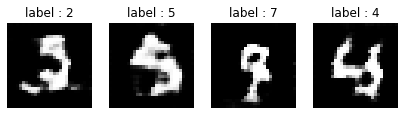

Generator loss: 0.8998289 Discriminator loss: 1.2005132
epoch 19 & 200/235 Result


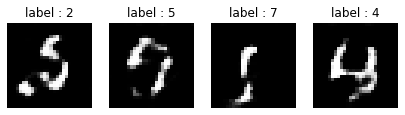

Generator loss: 1.1787242 Discriminator loss: 0.9187932
Time for epoch 20 is 13.768327474594116 sec
epoch 20 & 0/235 Result


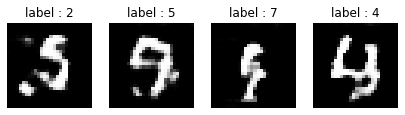

Generator loss: 0.71797496 Discriminator loss: 1.4242766
epoch 20 & 200/235 Result


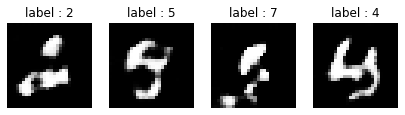

Generator loss: 0.8779581 Discriminator loss: 1.287251
Time for epoch 21 is 13.563612461090088 sec
epoch 21 & 0/235 Result


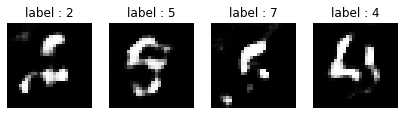

Generator loss: 1.1198381 Discriminator loss: 1.1692948
epoch 21 & 200/235 Result


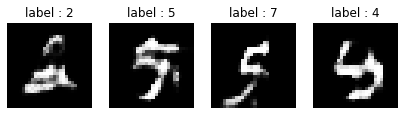

Generator loss: 1.0978744 Discriminator loss: 1.0403883
Time for epoch 22 is 13.56258249282837 sec
epoch 22 & 0/235 Result


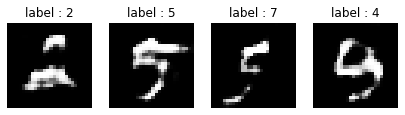

Generator loss: 1.1286871 Discriminator loss: 1.0628824
epoch 22 & 200/235 Result


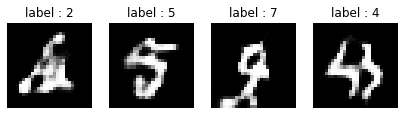

Generator loss: 0.922679 Discriminator loss: 1.1222974
Time for epoch 23 is 13.533133745193481 sec
epoch 23 & 0/235 Result


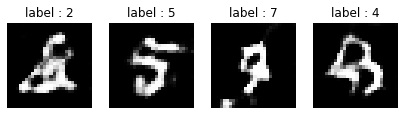

Generator loss: 0.97304356 Discriminator loss: 1.11476
epoch 23 & 200/235 Result


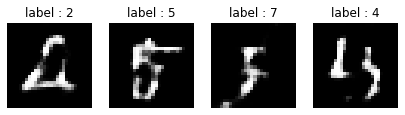

Generator loss: 1.2586815 Discriminator loss: 0.95848846
Time for epoch 24 is 13.531533479690552 sec
epoch 24 & 0/235 Result


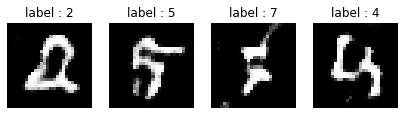

Generator loss: 1.1602625 Discriminator loss: 1.1045586
epoch 24 & 200/235 Result


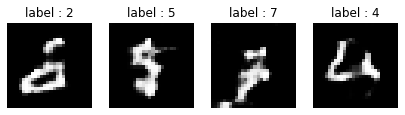

Generator loss: 1.2575209 Discriminator loss: 0.9351697
Time for epoch 25 is 13.583568811416626 sec
epoch 25 & 0/235 Result


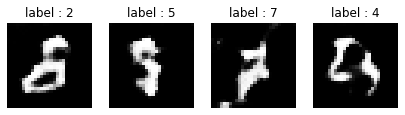

Generator loss: 1.2661189 Discriminator loss: 1.0108199
epoch 25 & 200/235 Result


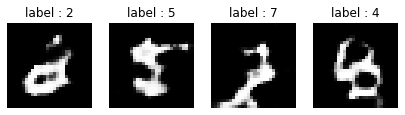

Generator loss: 0.992923 Discriminator loss: 1.0617561
Time for epoch 26 is 13.746585845947266 sec
epoch 26 & 0/235 Result


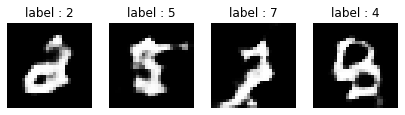

Generator loss: 1.0685884 Discriminator loss: 1.0359445
epoch 26 & 200/235 Result


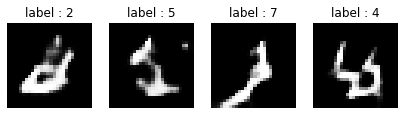

Generator loss: 1.0043784 Discriminator loss: 1.2107656
Time for epoch 27 is 13.554764747619629 sec
epoch 27 & 0/235 Result


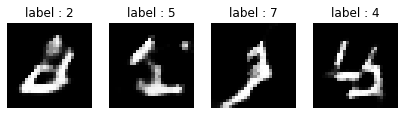

Generator loss: 1.1367121 Discriminator loss: 0.96937454
epoch 27 & 200/235 Result


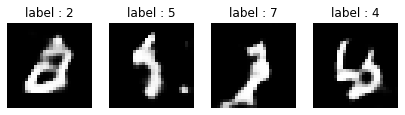

Generator loss: 1.0468314 Discriminator loss: 1.0801146
Time for epoch 28 is 13.562743663787842 sec
epoch 28 & 0/235 Result


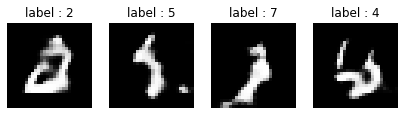

Generator loss: 1.0488348 Discriminator loss: 1.0292628
epoch 28 & 200/235 Result


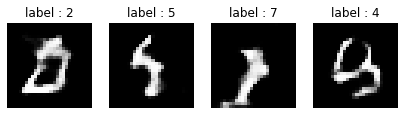

Generator loss: 1.0141652 Discriminator loss: 1.0792874
Time for epoch 29 is 13.558609247207642 sec
epoch 29 & 0/235 Result


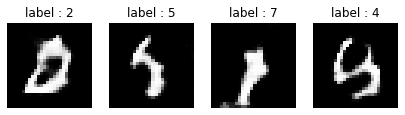

Generator loss: 0.95856464 Discriminator loss: 1.1527995
epoch 29 & 200/235 Result


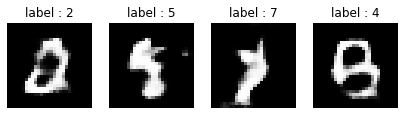

Generator loss: 1.076517 Discriminator loss: 1.0443597
Time for epoch 30 is 13.541999101638794 sec
epoch 30 & 0/235 Result


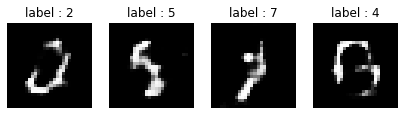

Generator loss: 1.0563457 Discriminator loss: 1.0287347
epoch 30 & 200/235 Result


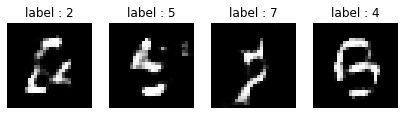

Generator loss: 1.0231577 Discriminator loss: 1.1727569
Time for epoch 31 is 13.562776803970337 sec
epoch 31 & 0/235 Result


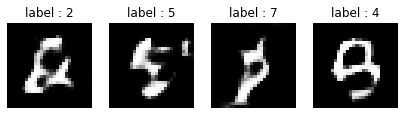

Generator loss: 0.9522842 Discriminator loss: 1.1741178
epoch 31 & 200/235 Result


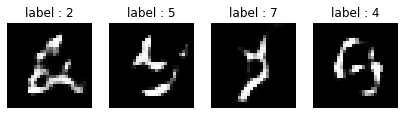

Generator loss: 1.0764238 Discriminator loss: 1.0145779
Time for epoch 32 is 13.765969514846802 sec
epoch 32 & 0/235 Result


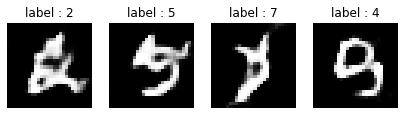

Generator loss: 0.903424 Discriminator loss: 1.3126942
epoch 32 & 200/235 Result


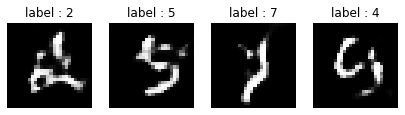

Generator loss: 0.9667329 Discriminator loss: 1.1698731
Time for epoch 33 is 13.56974482536316 sec
epoch 33 & 0/235 Result


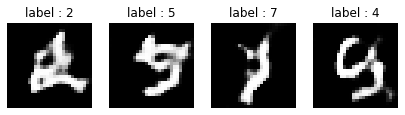

Generator loss: 0.81473774 Discriminator loss: 1.2145776
epoch 33 & 200/235 Result


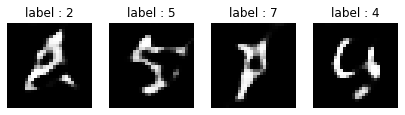

Generator loss: 1.0863948 Discriminator loss: 1.0715904
Time for epoch 34 is 13.569772720336914 sec
epoch 34 & 0/235 Result


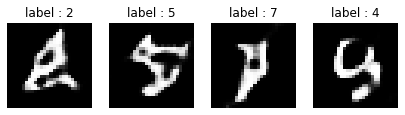

Generator loss: 0.8115151 Discriminator loss: 1.2576159
epoch 34 & 200/235 Result


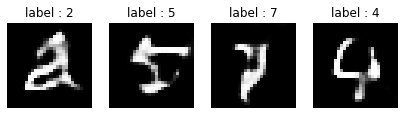

Generator loss: 0.9513266 Discriminator loss: 1.1325518
Time for epoch 35 is 13.563090562820435 sec
epoch 35 & 0/235 Result


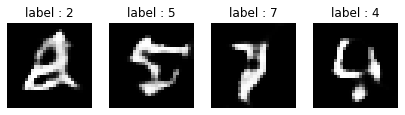

Generator loss: 0.83629364 Discriminator loss: 1.2485151
epoch 35 & 200/235 Result


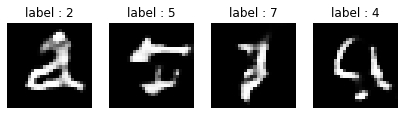

Generator loss: 1.0021238 Discriminator loss: 1.170518
Time for epoch 36 is 13.539968490600586 sec
epoch 36 & 0/235 Result


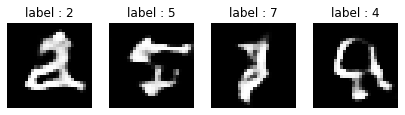

Generator loss: 1.0544403 Discriminator loss: 1.0731589
epoch 36 & 200/235 Result


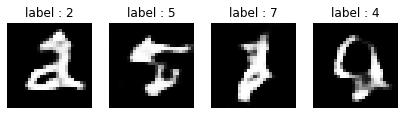

Generator loss: 0.82870495 Discriminator loss: 1.3306625
Time for epoch 37 is 13.547590732574463 sec
epoch 37 & 0/235 Result


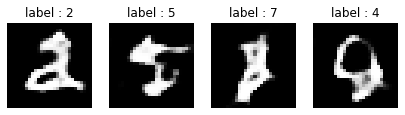

Generator loss: 1.0719826 Discriminator loss: 1.0325539
epoch 37 & 200/235 Result


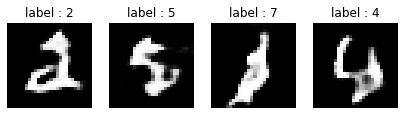

Generator loss: 0.7399935 Discriminator loss: 1.2718606
Time for epoch 38 is 13.7846097946167 sec
epoch 38 & 0/235 Result


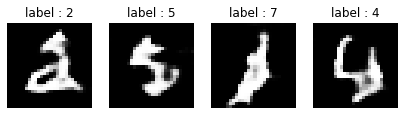

Generator loss: 1.0491644 Discriminator loss: 1.1075263
epoch 38 & 200/235 Result


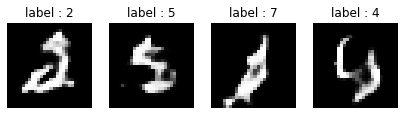

Generator loss: 0.83631426 Discriminator loss: 1.2667828
Time for epoch 39 is 13.58906888961792 sec
epoch 39 & 0/235 Result


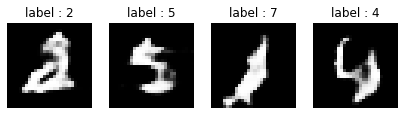

Generator loss: 0.9498853 Discriminator loss: 1.1182227
epoch 39 & 200/235 Result


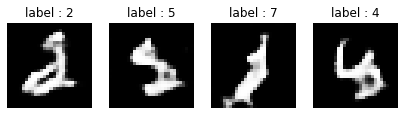

Generator loss: 0.79451925 Discriminator loss: 1.24679
Time for epoch 40 is 13.549481391906738 sec
epoch 40 & 0/235 Result


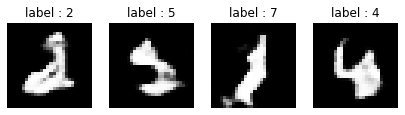

Generator loss: 1.1317906 Discriminator loss: 0.9909357
epoch 40 & 200/235 Result


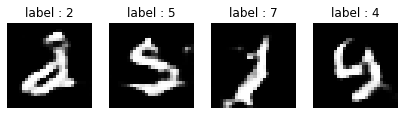

Generator loss: 0.6940734 Discriminator loss: 1.3298366
Time for epoch 41 is 13.53617000579834 sec
epoch 41 & 0/235 Result


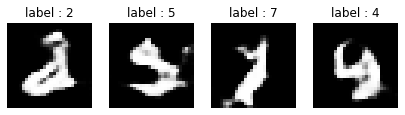

Generator loss: 1.0097773 Discriminator loss: 1.0308797
epoch 41 & 200/235 Result


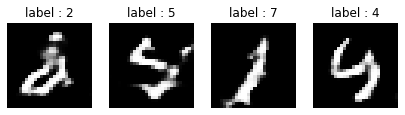

Generator loss: 0.8327298 Discriminator loss: 1.2787352
Time for epoch 42 is 13.55181074142456 sec
epoch 42 & 0/235 Result


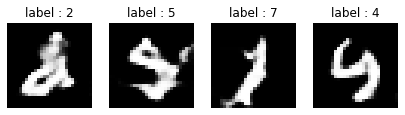

Generator loss: 0.8736631 Discriminator loss: 1.1546037
epoch 42 & 200/235 Result


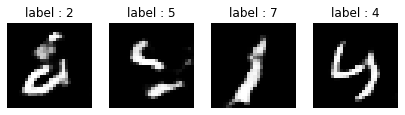

Generator loss: 1.0132546 Discriminator loss: 1.1073464
Time for epoch 43 is 13.570258140563965 sec
epoch 43 & 0/235 Result


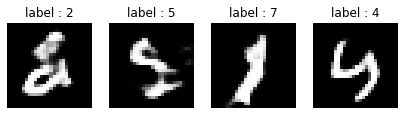

Generator loss: 0.8829129 Discriminator loss: 1.1636267
epoch 43 & 200/235 Result


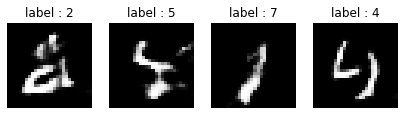

Generator loss: 0.9639617 Discriminator loss: 1.2300291
Time for epoch 44 is 13.721794843673706 sec
epoch 44 & 0/235 Result


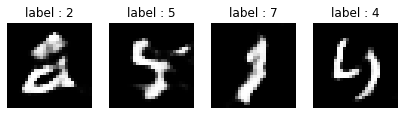

Generator loss: 0.80791974 Discriminator loss: 1.271915
epoch 44 & 200/235 Result


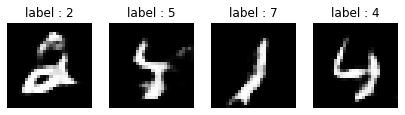

Generator loss: 0.9176965 Discriminator loss: 1.1779225
Time for epoch 45 is 13.541972398757935 sec
epoch 45 & 0/235 Result


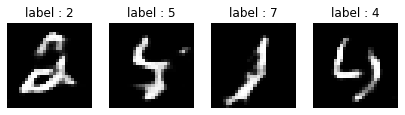

Generator loss: 0.8827062 Discriminator loss: 1.2589189
epoch 45 & 200/235 Result


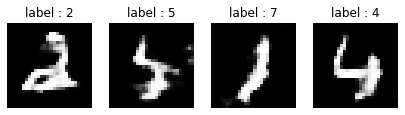

Generator loss: 0.9583737 Discriminator loss: 1.1270082
Time for epoch 46 is 13.574730396270752 sec
epoch 46 & 0/235 Result


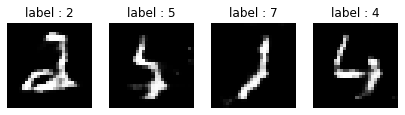

Generator loss: 1.0016118 Discriminator loss: 1.1150547
epoch 46 & 200/235 Result


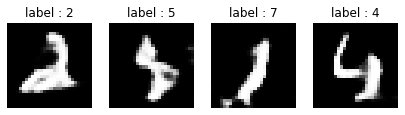

Generator loss: 0.79311025 Discriminator loss: 1.1625957
Time for epoch 47 is 13.557241678237915 sec
epoch 47 & 0/235 Result


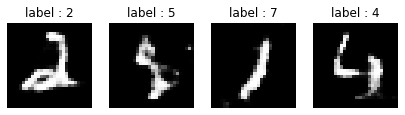

Generator loss: 0.8149024 Discriminator loss: 1.3519328
epoch 47 & 200/235 Result


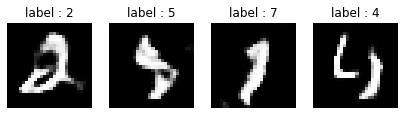

Generator loss: 0.792985 Discriminator loss: 1.2971182
Time for epoch 48 is 13.569465160369873 sec
epoch 48 & 0/235 Result


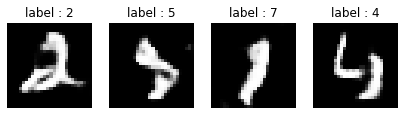

Generator loss: 0.86816984 Discriminator loss: 1.1557581
epoch 48 & 200/235 Result


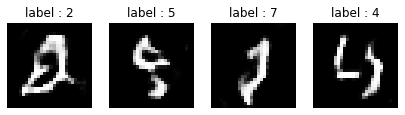

Generator loss: 0.8931734 Discriminator loss: 1.2381439
Time for epoch 49 is 13.546896696090698 sec
epoch 49 & 0/235 Result


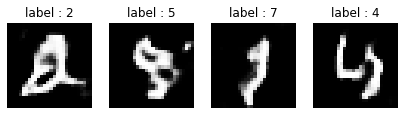

Generator loss: 0.90199333 Discriminator loss: 1.2043049
epoch 49 & 200/235 Result


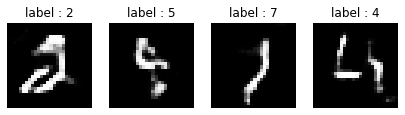

Generator loss: 0.8971757 Discriminator loss: 1.2275033
Time for epoch 50 is 13.724597454071045 sec
epoch 50 & 0/235 Result


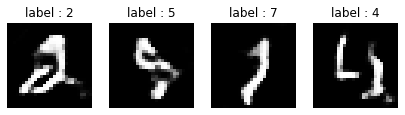

Generator loss: 0.9426832 Discriminator loss: 1.1720307
epoch 50 & 200/235 Result


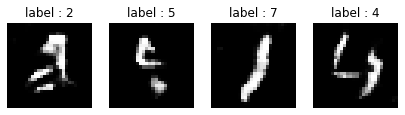

Generator loss: 0.8263818 Discriminator loss: 1.4699764
Time for epoch 51 is 13.542844295501709 sec
epoch 51 & 0/235 Result


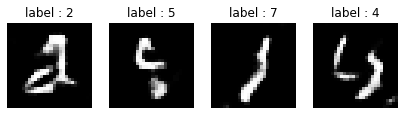

Generator loss: 0.85087943 Discriminator loss: 1.1702375
epoch 51 & 200/235 Result


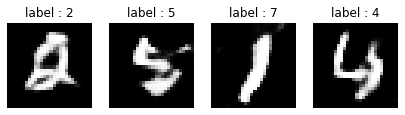

Generator loss: 0.8935726 Discriminator loss: 1.1308054
Time for epoch 52 is 13.540579080581665 sec
epoch 52 & 0/235 Result


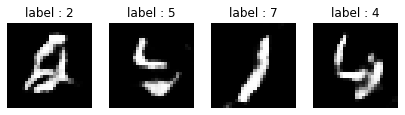

Generator loss: 0.8166855 Discriminator loss: 1.4211621
epoch 52 & 200/235 Result


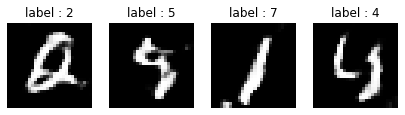

Generator loss: 0.82296836 Discriminator loss: 1.2939372
Time for epoch 53 is 13.52483606338501 sec
epoch 53 & 0/235 Result


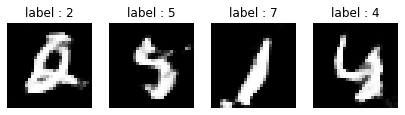

Generator loss: 0.8620756 Discriminator loss: 1.138072
epoch 53 & 200/235 Result


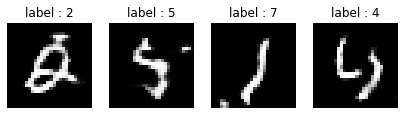

Generator loss: 0.80632365 Discriminator loss: 1.2899423
Time for epoch 54 is 13.54330039024353 sec
epoch 54 & 0/235 Result


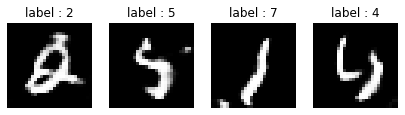

Generator loss: 0.8083037 Discriminator loss: 1.2512376
epoch 54 & 200/235 Result


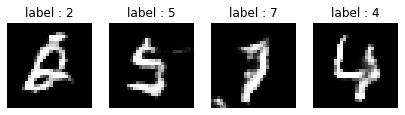

Generator loss: 0.93397194 Discriminator loss: 1.2900567
Time for epoch 55 is 13.52144193649292 sec
epoch 55 & 0/235 Result


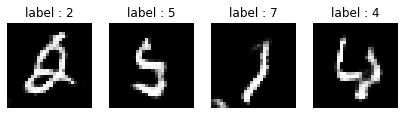

Generator loss: 0.83455867 Discriminator loss: 1.246856
epoch 55 & 200/235 Result


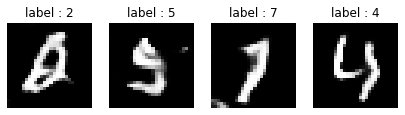

Generator loss: 0.8181595 Discriminator loss: 1.2647202
Time for epoch 56 is 13.685042381286621 sec
epoch 56 & 0/235 Result


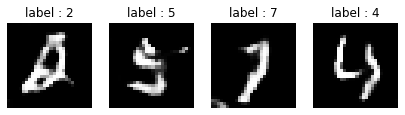

Generator loss: 0.90582645 Discriminator loss: 1.1816345
epoch 56 & 200/235 Result


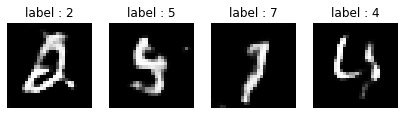

Generator loss: 0.8656705 Discriminator loss: 1.3315899
Time for epoch 57 is 13.476226329803467 sec
epoch 57 & 0/235 Result


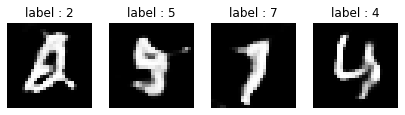

Generator loss: 0.828117 Discriminator loss: 1.2096472
epoch 57 & 200/235 Result


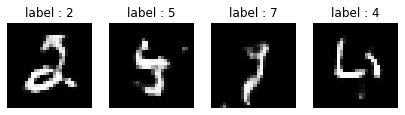

Generator loss: 0.85089743 Discriminator loss: 1.3976259
Time for epoch 58 is 13.439028263092041 sec
epoch 58 & 0/235 Result


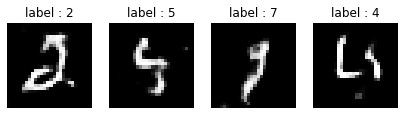

Generator loss: 0.86035305 Discriminator loss: 1.1269526
epoch 58 & 200/235 Result


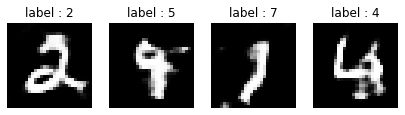

Generator loss: 0.69073325 Discriminator loss: 1.4047077
Time for epoch 59 is 13.507036924362183 sec
epoch 59 & 0/235 Result


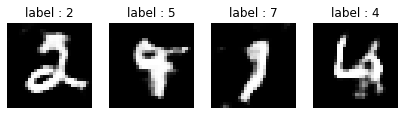

Generator loss: 0.9261111 Discriminator loss: 1.0875714
epoch 59 & 200/235 Result


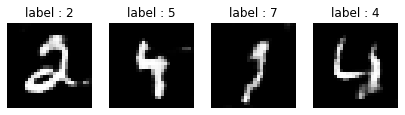

Generator loss: 0.8137092 Discriminator loss: 1.4140377
Time for epoch 60 is 13.513531684875488 sec
epoch 60 & 0/235 Result


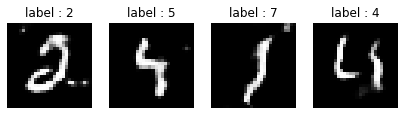

Generator loss: 0.80153805 Discriminator loss: 1.2918233
epoch 60 & 200/235 Result


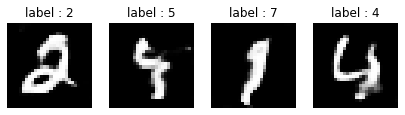

Generator loss: 0.7900237 Discriminator loss: 1.2636961
Time for epoch 61 is 13.572514057159424 sec
epoch 61 & 0/235 Result


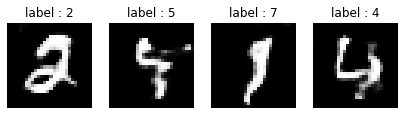

Generator loss: 0.82126766 Discriminator loss: 1.3368545
epoch 61 & 200/235 Result


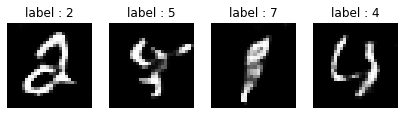

Generator loss: 0.85400075 Discriminator loss: 1.1852121
Time for epoch 62 is 13.725978136062622 sec
epoch 62 & 0/235 Result


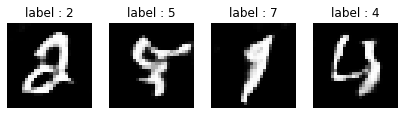

Generator loss: 0.87355113 Discriminator loss: 1.2646607
epoch 62 & 200/235 Result


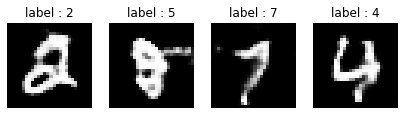

Generator loss: 0.81747526 Discriminator loss: 1.30677
Time for epoch 63 is 13.50276255607605 sec
epoch 63 & 0/235 Result


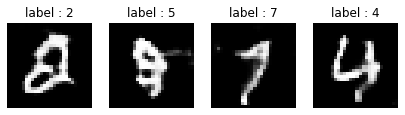

Generator loss: 0.91872674 Discriminator loss: 1.190546
epoch 63 & 200/235 Result


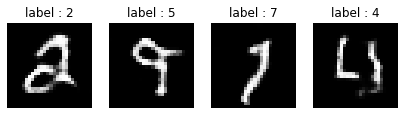

Generator loss: 0.8499274 Discriminator loss: 1.2627742
Time for epoch 64 is 13.46512770652771 sec
epoch 64 & 0/235 Result


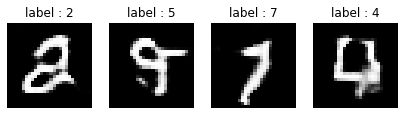

Generator loss: 0.7660692 Discriminator loss: 1.3484933
epoch 64 & 200/235 Result


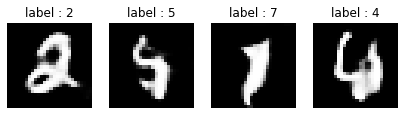

Generator loss: 1.0437057 Discriminator loss: 1.0362809
Time for epoch 65 is 13.472048282623291 sec
epoch 65 & 0/235 Result


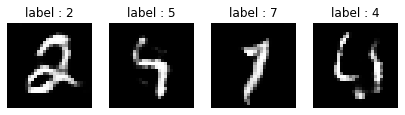

Generator loss: 0.8164035 Discriminator loss: 1.5248516
epoch 65 & 200/235 Result


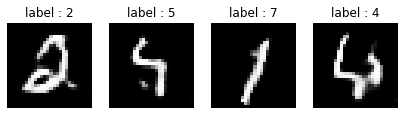

Generator loss: 0.8759731 Discriminator loss: 1.213346
Time for epoch 66 is 13.485583782196045 sec
epoch 66 & 0/235 Result


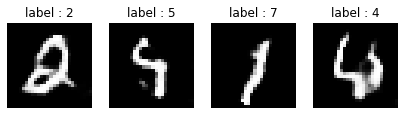

Generator loss: 0.7948706 Discriminator loss: 1.3428488
epoch 66 & 200/235 Result


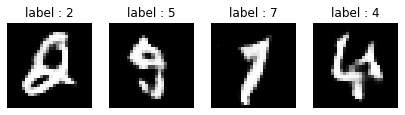

Generator loss: 0.9875821 Discriminator loss: 1.096014
Time for epoch 67 is 13.501899719238281 sec
epoch 67 & 0/235 Result


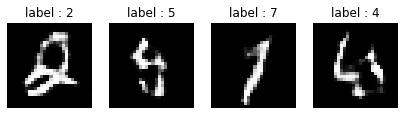

Generator loss: 0.80053586 Discriminator loss: 1.4736519
epoch 67 & 200/235 Result


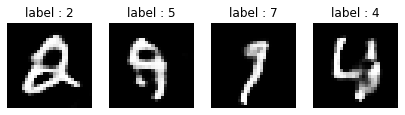

Generator loss: 0.88943064 Discriminator loss: 1.2167077
Time for epoch 68 is 13.730299234390259 sec
epoch 68 & 0/235 Result


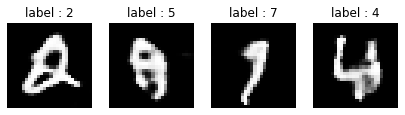

Generator loss: 0.86024487 Discriminator loss: 1.0936526
epoch 68 & 200/235 Result


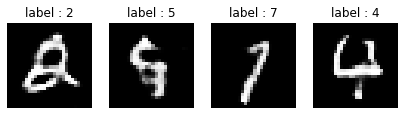

Generator loss: 0.74950004 Discriminator loss: 1.3912165
Time for epoch 69 is 13.537545204162598 sec
epoch 69 & 0/235 Result


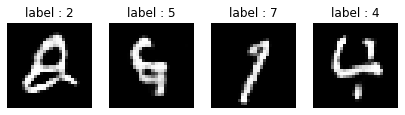

Generator loss: 0.81214476 Discriminator loss: 1.2559464
epoch 69 & 200/235 Result


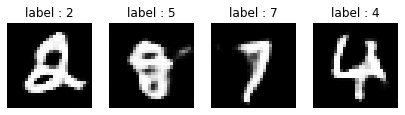

Generator loss: 0.7388685 Discriminator loss: 1.2925106
Time for epoch 70 is 13.536669731140137 sec
epoch 70 & 0/235 Result


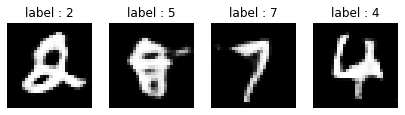

Generator loss: 0.9584942 Discriminator loss: 1.216466
epoch 70 & 200/235 Result


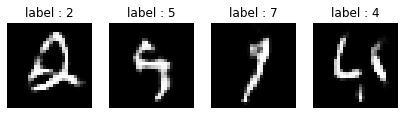

Generator loss: 0.84985507 Discriminator loss: 1.3727478
Time for epoch 71 is 13.552330732345581 sec
epoch 71 & 0/235 Result


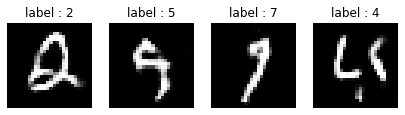

Generator loss: 0.830207 Discriminator loss: 1.2391917
epoch 71 & 200/235 Result


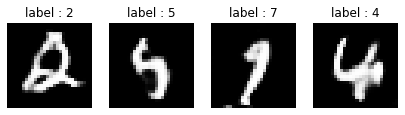

Generator loss: 0.71431565 Discriminator loss: 1.344163
Time for epoch 72 is 13.531734704971313 sec
epoch 72 & 0/235 Result


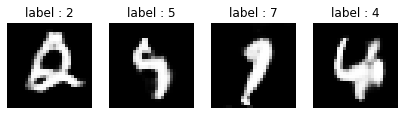

Generator loss: 1.0004481 Discriminator loss: 1.104986
epoch 72 & 200/235 Result


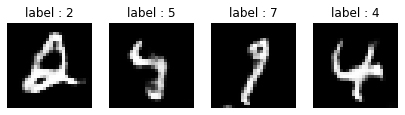

Generator loss: 0.8305558 Discriminator loss: 1.3262894
Time for epoch 73 is 13.511943817138672 sec
epoch 73 & 0/235 Result


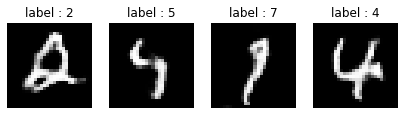

Generator loss: 0.93187493 Discriminator loss: 1.2022073
epoch 73 & 200/235 Result


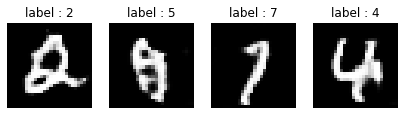

Generator loss: 0.7205267 Discriminator loss: 1.3473139
Time for epoch 74 is 13.719681739807129 sec
epoch 74 & 0/235 Result


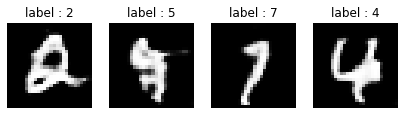

Generator loss: 0.8698751 Discriminator loss: 1.20068
epoch 74 & 200/235 Result


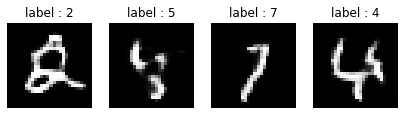

Generator loss: 0.7951482 Discriminator loss: 1.3255309
Time for epoch 75 is 13.501235723495483 sec
epoch 75 & 0/235 Result


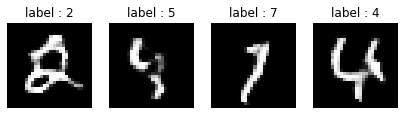

Generator loss: 0.7999748 Discriminator loss: 1.2446167
epoch 75 & 200/235 Result


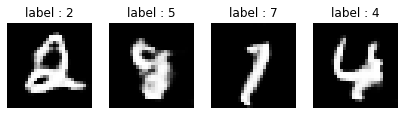

Generator loss: 0.9095293 Discriminator loss: 1.0986413
Time for epoch 76 is 13.52552604675293 sec
epoch 76 & 0/235 Result


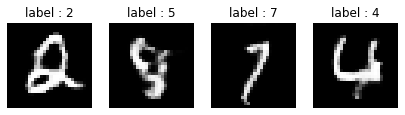

Generator loss: 0.8266683 Discriminator loss: 1.3624871
epoch 76 & 200/235 Result


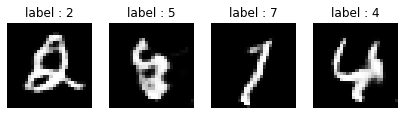

Generator loss: 0.76275915 Discriminator loss: 1.2914063
Time for epoch 77 is 13.517100811004639 sec
epoch 77 & 0/235 Result


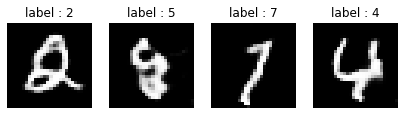

Generator loss: 0.8006551 Discriminator loss: 1.2573133
epoch 77 & 200/235 Result


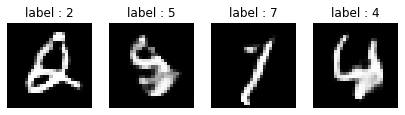

Generator loss: 0.7937981 Discriminator loss: 1.2914267
Time for epoch 78 is 13.483649969100952 sec
epoch 78 & 0/235 Result


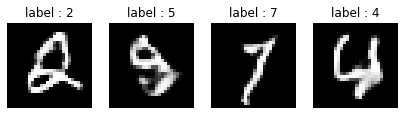

Generator loss: 0.80488837 Discriminator loss: 1.2878978
epoch 78 & 200/235 Result


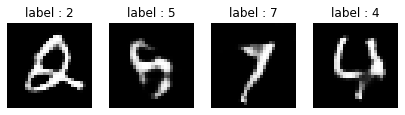

Generator loss: 0.73504514 Discriminator loss: 1.3609698
Time for epoch 79 is 13.506905555725098 sec
epoch 79 & 0/235 Result


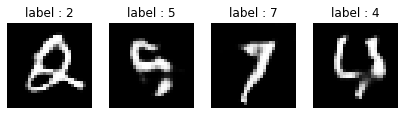

Generator loss: 0.81618255 Discriminator loss: 1.2714548
epoch 79 & 200/235 Result


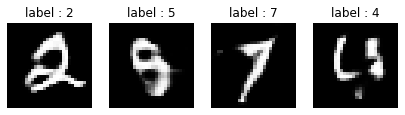

Generator loss: 0.7509227 Discriminator loss: 1.3245056
Time for epoch 80 is 13.719461441040039 sec
epoch 80 & 0/235 Result


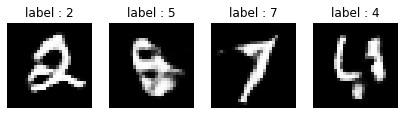

Generator loss: 0.90447676 Discriminator loss: 1.212074
epoch 80 & 200/235 Result


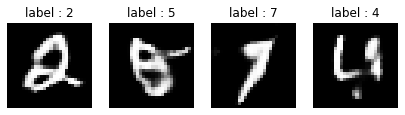

Generator loss: 0.7506934 Discriminator loss: 1.3072731
Time for epoch 81 is 13.513786315917969 sec
epoch 81 & 0/235 Result


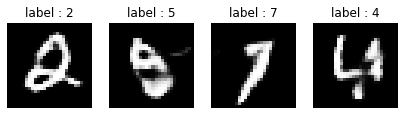

Generator loss: 0.896922 Discriminator loss: 1.2995558
epoch 81 & 200/235 Result


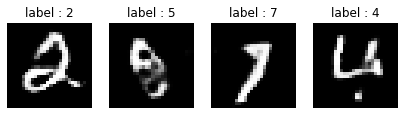

Generator loss: 0.9300979 Discriminator loss: 1.2846044
Time for epoch 82 is 13.502094984054565 sec
epoch 82 & 0/235 Result


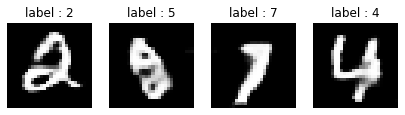

Generator loss: 0.8375345 Discriminator loss: 1.1795554
epoch 82 & 200/235 Result


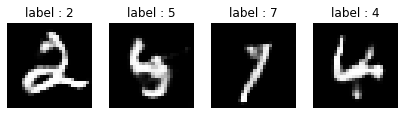

Generator loss: 0.78238314 Discriminator loss: 1.4056644
Time for epoch 83 is 13.527623176574707 sec
epoch 83 & 0/235 Result


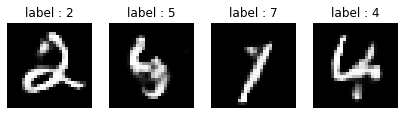

Generator loss: 0.80504054 Discriminator loss: 1.2655575
epoch 83 & 200/235 Result


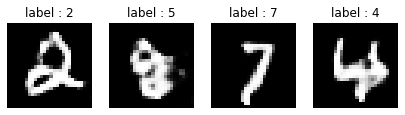

Generator loss: 0.7140591 Discriminator loss: 1.4023235
Time for epoch 84 is 13.51769232749939 sec
epoch 84 & 0/235 Result


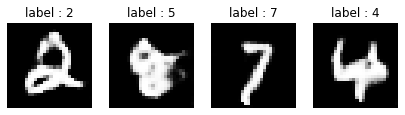

Generator loss: 0.9708307 Discriminator loss: 1.1067116
epoch 84 & 200/235 Result


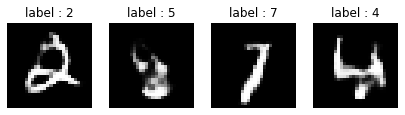

Generator loss: 0.81324214 Discriminator loss: 1.3687217
Time for epoch 85 is 13.514781475067139 sec
epoch 85 & 0/235 Result


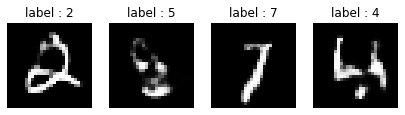

Generator loss: 0.90357137 Discriminator loss: 1.1316221
epoch 85 & 200/235 Result


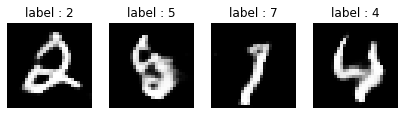

Generator loss: 0.7730348 Discriminator loss: 1.299982
Time for epoch 86 is 13.7366042137146 sec
epoch 86 & 0/235 Result


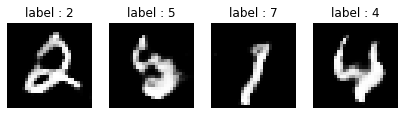

Generator loss: 0.8300764 Discriminator loss: 1.2643032
epoch 86 & 200/235 Result


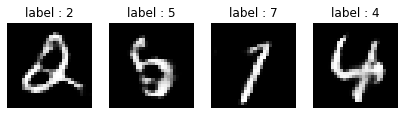

Generator loss: 0.80126715 Discriminator loss: 1.243943
Time for epoch 87 is 13.522063255310059 sec
epoch 87 & 0/235 Result


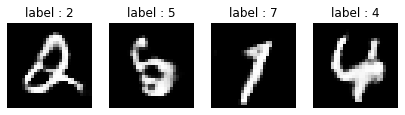

Generator loss: 0.7223502 Discriminator loss: 1.3748271
epoch 87 & 200/235 Result


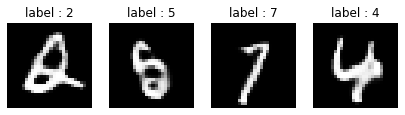

Generator loss: 0.8445949 Discriminator loss: 1.2894793
Time for epoch 88 is 13.544939994812012 sec
epoch 88 & 0/235 Result


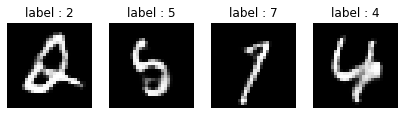

Generator loss: 0.78964853 Discriminator loss: 1.355443
epoch 88 & 200/235 Result


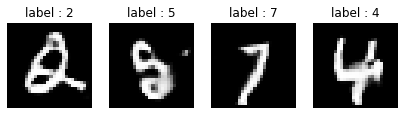

Generator loss: 0.8109723 Discriminator loss: 1.283603
Time for epoch 89 is 13.521364688873291 sec
epoch 89 & 0/235 Result


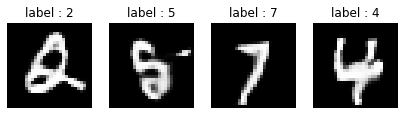

Generator loss: 0.8622395 Discriminator loss: 1.269489
epoch 89 & 200/235 Result


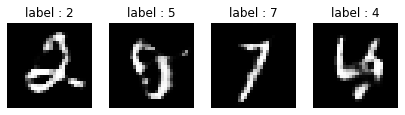

Generator loss: 0.8608091 Discriminator loss: 1.2609451
Time for epoch 90 is 13.507732391357422 sec
epoch 90 & 0/235 Result


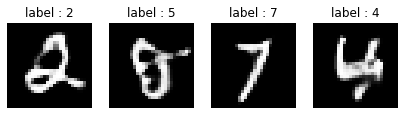

Generator loss: 0.74218184 Discriminator loss: 1.3293393
epoch 90 & 200/235 Result


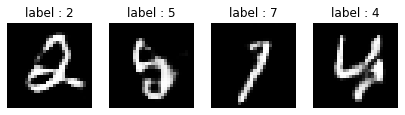

Generator loss: 0.83712655 Discriminator loss: 1.3012736
Time for epoch 91 is 13.519827365875244 sec
epoch 91 & 0/235 Result


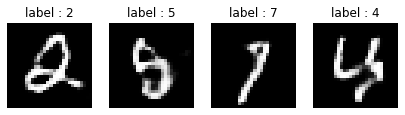

Generator loss: 0.8332469 Discriminator loss: 1.262385
epoch 91 & 200/235 Result


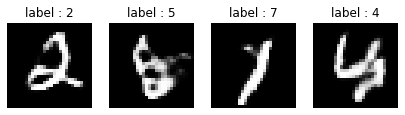

Generator loss: 0.86053807 Discriminator loss: 1.2399921
Time for epoch 92 is 13.716389656066895 sec
epoch 92 & 0/235 Result


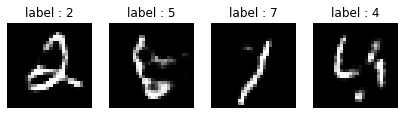

Generator loss: 0.8729622 Discriminator loss: 1.2836394
epoch 92 & 200/235 Result


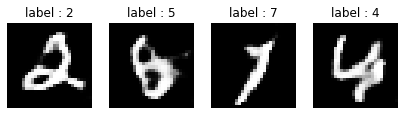

Generator loss: 0.7129718 Discriminator loss: 1.3838876
Time for epoch 93 is 13.531470537185669 sec
epoch 93 & 0/235 Result


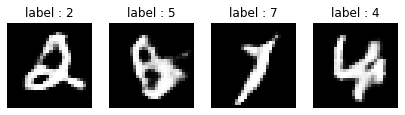

Generator loss: 0.89034563 Discriminator loss: 1.139527
epoch 93 & 200/235 Result


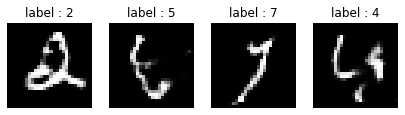

Generator loss: 0.8437295 Discriminator loss: 1.3153034
Time for epoch 94 is 13.50938367843628 sec
epoch 94 & 0/235 Result


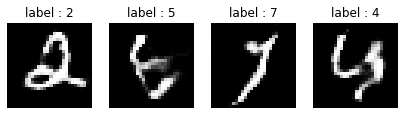

Generator loss: 0.73537564 Discriminator loss: 1.3442001
epoch 94 & 200/235 Result


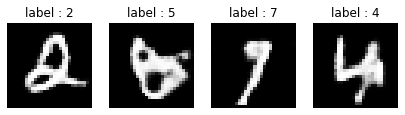

Generator loss: 0.7322187 Discriminator loss: 1.3265159
Time for epoch 95 is 13.51690149307251 sec
epoch 95 & 0/235 Result


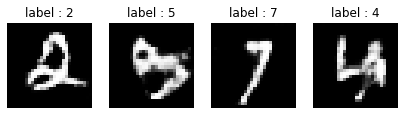

Generator loss: 0.866176 Discriminator loss: 1.3316002
epoch 95 & 200/235 Result


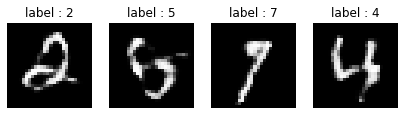

Generator loss: 0.8681817 Discriminator loss: 1.2694186
Time for epoch 96 is 13.522713422775269 sec
epoch 96 & 0/235 Result


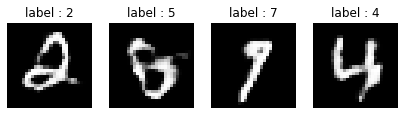

Generator loss: 0.75416344 Discriminator loss: 1.2960029
epoch 96 & 200/235 Result


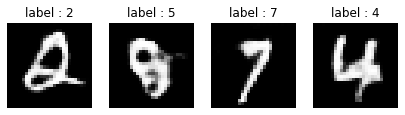

Generator loss: 0.8553964 Discriminator loss: 1.2174369
Time for epoch 97 is 13.50772762298584 sec
epoch 97 & 0/235 Result


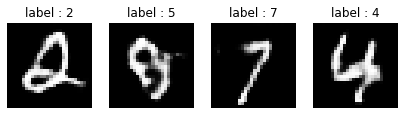

Generator loss: 0.82508254 Discriminator loss: 1.2476966
epoch 97 & 200/235 Result


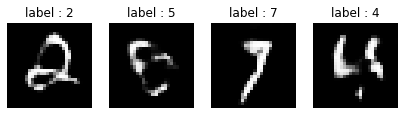

Generator loss: 0.9871063 Discriminator loss: 1.1174417
Time for epoch 98 is 13.72137975692749 sec
epoch 98 & 0/235 Result


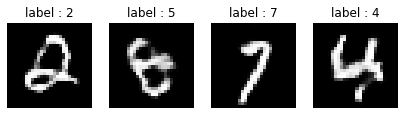

Generator loss: 0.919118 Discriminator loss: 1.218894
epoch 98 & 200/235 Result


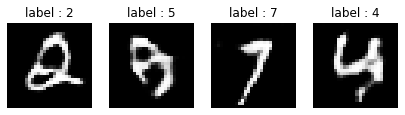

Generator loss: 0.92855877 Discriminator loss: 1.1441879
Time for epoch 99 is 13.5213143825531 sec
epoch 99 & 0/235 Result


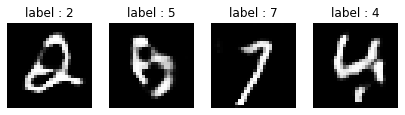

Generator loss: 0.80293775 Discriminator loss: 1.2108188
epoch 99 & 200/235 Result


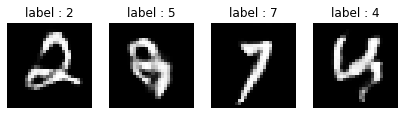

Generator loss: 0.7351507 Discriminator loss: 1.2728828
Time for epoch 100 is 13.550108194351196 sec
CPU times: user 13min 37s, sys: 9min 25s, total: 23min 3s
Wall time: 22min 33s


In [ ]:
# 학습!!!
%%time

g_losses, d_losses = train(train_dataset, EPOCHS)

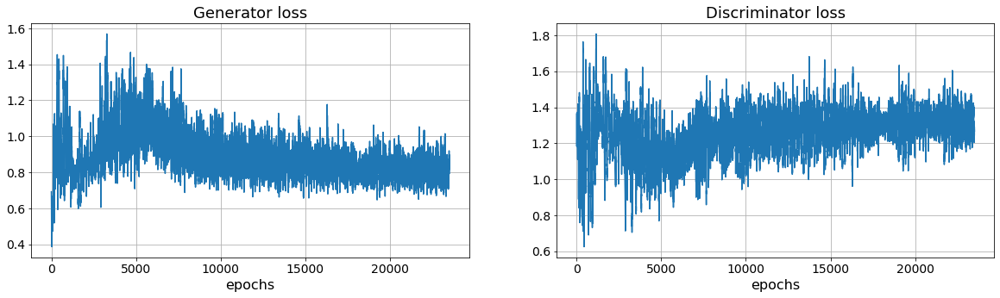

In [ ]:
import matplotlib.pyplot as plt 

plt.figure(figsize= (20,5)) 
plt.subplots_adjust(wspace = 0.2)

plt.subplot(1,2,1)  
plt.title("Generator loss",fontsize = 18) 
plt.plot(g_losses) 
plt.grid() 
plt.xlabel("epochs", fontsize = 16)          
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)


plt.subplot(1,2,2)
plt.title("Discriminator loss", fontsize = 18)
plt.plot(d_losses)
plt.grid()
plt.xlabel("epochs", fontsize = 16)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

plt.show()

- noise의 dim을 줄여 학습을 시킨 결과를 확인해 보면 이전 100차원 보다 50차원에서 생성을 잘 못하며, loss또한 특정 범위 내로 수렴하지 못하고 불안한 결과를 보이는 것을 확인할 수 있다.

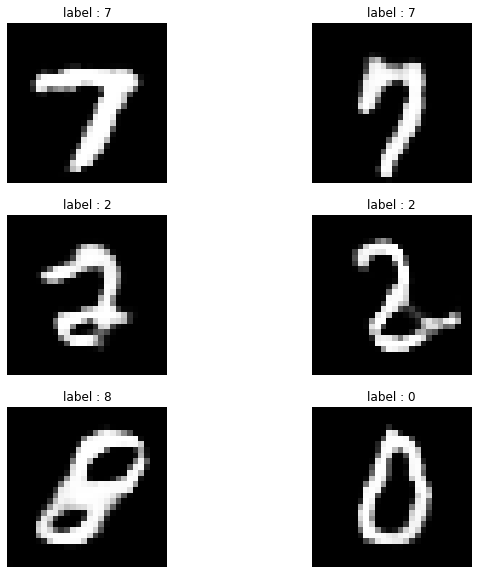

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기

import matplotlib.pyplot as plt

noises = tf.random.normal([50, 50])
test_number = tf.random.uniform(shape=(50,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)

generated_image = G([noises,test_con], training=False)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,10))

for ax in axes.flat:
  ax.axis('off')

axes[0,0].imshow(generated_image[0], cmap='gray')
axes[0,0].set_title(f'label : {test_number[0]}')
axes[0,1].imshow(generated_image[1], cmap='gray')
axes[0,1].set_title(f'label : {test_number[1]}')
axes[1,0].imshow(generated_image[2], cmap='gray')
axes[1,0].set_title(f'label : {test_number[2]}')
axes[1,1].imshow(generated_image[3], cmap='gray')
axes[1,1].set_title(f'label : {test_number[3]}')
axes[2,0].imshow(generated_image[4], cmap='gray')
axes[2,0].set_title(f'label : {test_number[4]}')
axes[2,1].imshow(generated_image[5], cmap='gray')
axes[2,1].set_title(f'label : {test_number[5]}')

plt.show()

- 생성 결과를 보면 어느 정도 잘 만드는것을 확인할 수 있다. 이는 Conv layer로 구성했기 때문에 학습을 잘 하는것 같다.

## ACGAN

- ACGAN은 Discriminator를 두 개의 classifier로 구성하였다. 데이터가 진짜인지 아닌지, 데이터의 범주를 분류하여 기존 Conditional GAN 보다 label에 맞는 데이터를 만들어낼 수 있다. 

![](https://i.imgur.com/IUR0e8Q.png_)

In [ ]:
height = 28
width = 28
noise_dim = 100
tags = 10 # tag가 label을 의미함 MNIST의 경우 10개의 label이 존재
initializer = tf.keras.initializers.random_normal(stddev = 0.02) # 각 층의 initializer설정 


In [ ]:
# generator 부분은 기존과 동일하게 구성이 됨  , 기존 deconvolution layer 대신 upsampling으로 설정 

g_input1 = tf.keras.layers.Input(shape = (noise_dim, ))
g_input2 = tf.keras.layers.Input(shape = (tags, ))

g = tf.keras.layers.Dense(7*7*32, use_bias = False, kernel_initializer = initializer)(g_input1)
g = tf.keras.layers.Reshape(target_shape = (7, 7, 32))(g)
g = tf.keras.layers.BatchNormalization()(g)
g = tf.keras.layers.PReLU()(g)


g_ = tf.keras.layers.Dense(7* 7 * 32, use_bias = False, kernel_initializer = initializer)(g_input2)
g_ = tf.keras.layers.Reshape(target_shape = (7, 7, 32))(g_)
g_ = tf.keras.layers.BatchNormalization()(g_)
g_ = tf.keras.layers.PReLU()(g_)

g = tf.keras.layers.concatenate([g, g_])

g = tf.keras.layers.UpSampling2D((2,2))(g)
g = tf.keras.layers.Convolution2D(64, kernel_size=3, strides=1, padding='same', use_bias = False)(g)
g = tf.keras.layers.BatchNormalization()(g)
g = tf.keras.layers.PReLU()(g)
g = tf.keras.layers.UpSampling2D((2,2))(g)
g = tf.keras.layers.Convolution2D(128,  kernel_size=3, strides=1, padding='same', use_bias = False)(g)
g = tf.keras.layers.BatchNormalization()(g)
g = tf.keras.layers.PReLU()(g)
g = tf.keras.layers.Conv2D(filters = 1, kernel_size = 4, strides = 1, padding = 'same', use_bias = False, activation = 'tanh', kernel_initializer = initializer)(g)
out = tf.keras.layers.Reshape(target_shape=(28,28))(g)


G = tf.keras.models.Model(inputs = [g_input1, g_input2], outputs = out)

Model: "model_47"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_99 (InputLayer)           [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_100 (InputLayer)          [(None, 10)]         0                                            
__________________________________________________________________________________________________
dense_48 (Dense)                (None, 1568)         156800      input_99[0][0]                   
__________________________________________________________________________________________________
dense_49 (Dense)                (None, 1568)         15680       input_100[0][0]                  
___________________________________________________________________________________________

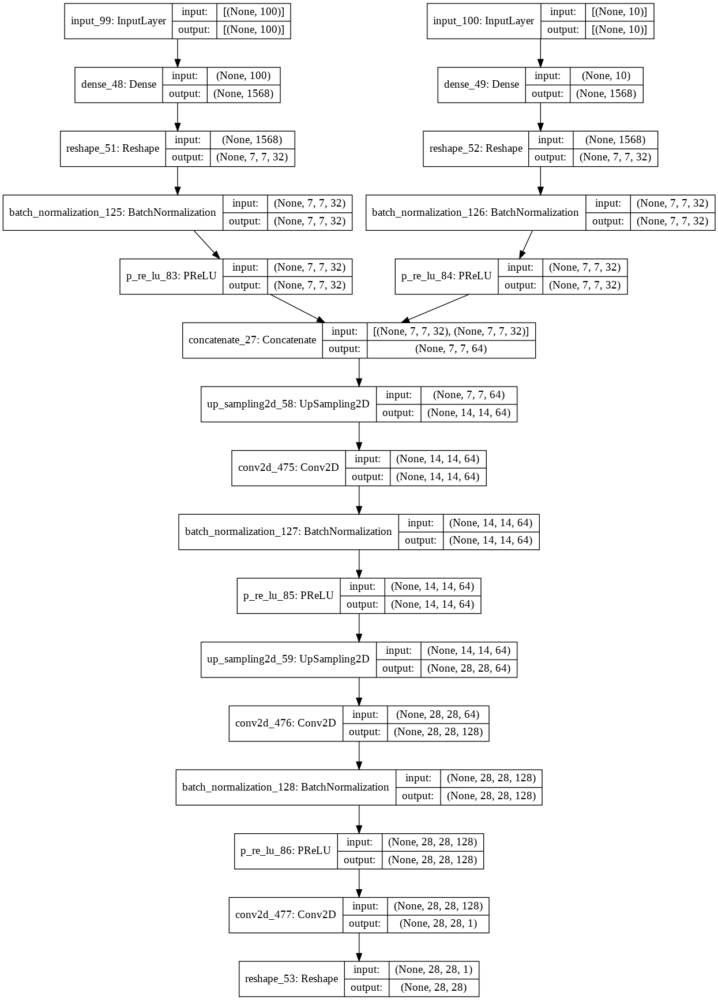

In [ ]:
G.summary()
tf.keras.utils.plot_model(G, show_shapes = True)

In [ ]:
# discriminator는 이미지를 받아 이미지가 real, fake 인지 label에 대한 분류기를 output으로 부여 학습을 진행함 

input_img = tf.keras.Input(shape = (28,28))
reshape_img = tf.keras.layers.Reshape(target_shape = (28,28,1))(input_img)


dis = tf.keras.layers.Conv2D(64, (5,5), strides=(2, 2), padding='same')(reshape_img)
dis = tf.keras.layers.LeakyReLU(alpha=0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis = tf.keras.layers.Conv2D(128, (5,5), strides=(2, 2), padding='same')(dis)
dis = tf.keras.layers.LeakyReLU(alpha=0.2)(dis)
dis = tf.keras.layers.Dropout(0.3)(dis)
dis = tf.keras.layers.Flatten()(dis)

fake = tf.keras.layers.Dense(1, activation='sigmoid')(dis)
aux = tf.keras.layers.Dense(10, activation='softmax')(dis)

D = tf.keras.Model(inputs = input_img, outputs = [fake, aux])

Model: "model_48"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_101 (InputLayer)          [(None, 28, 28)]     0                                            
__________________________________________________________________________________________________
reshape_54 (Reshape)            (None, 28, 28, 1)    0           input_101[0][0]                  
__________________________________________________________________________________________________
conv2d_478 (Conv2D)             (None, 14, 14, 64)   1664        reshape_54[0][0]                 
__________________________________________________________________________________________________
leaky_re_lu_7 (LeakyReLU)       (None, 14, 14, 64)   0           conv2d_478[0][0]                 
___________________________________________________________________________________________

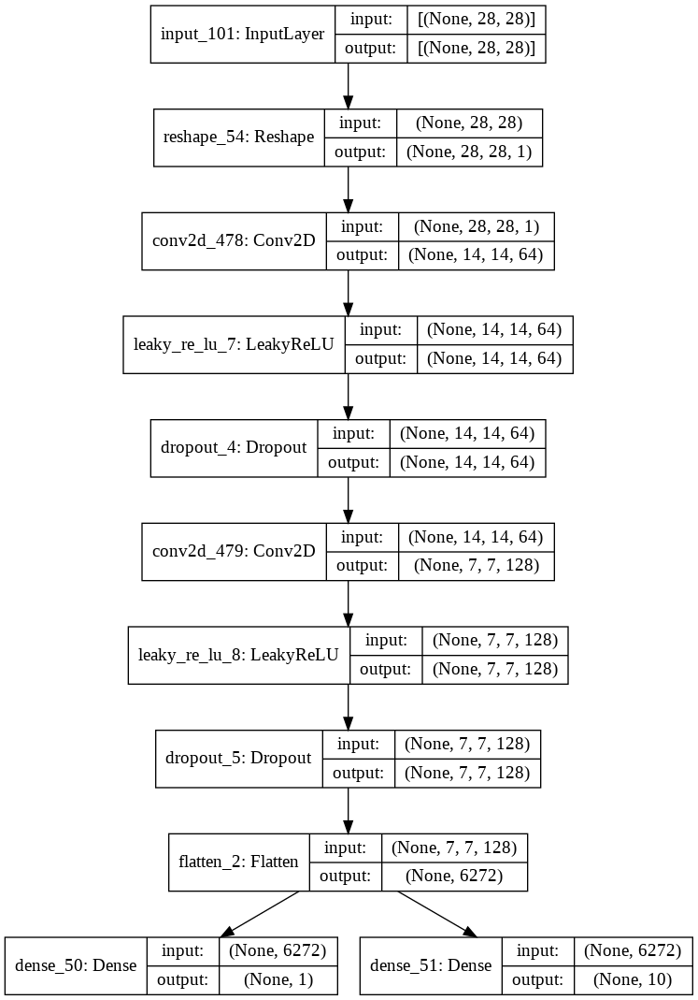

In [ ]:
D.summary()
tf.keras.utils.plot_model(D, show_shapes = True)

test condition : 5


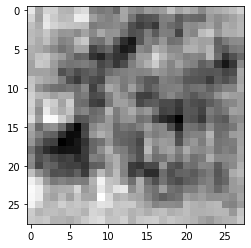

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기
test_noise = tf.random.normal([1, 100])
test_number = tf.random.uniform(shape=(1,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)
fake_image_test = G([test_noise,test_con], training=False)  # 생성자 G를 함수로 쓸 때는 training=False로 설정해야 함.


print(f'test condition : {test_number[0]}')
plt.imshow(fake_image_test[0], cmap='gray')
plt.show()

In [ ]:
img_decision, label_decision = D(fake_image_test, training=False)  # 판별자 D를 함수로 쓸 때는 training=False로 설정해야 함.
print(img_decision, np.argmax(label_decision.numpy()))

tf.Tensor([[0.49831745]], shape=(1, 1), dtype=float32) 2


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)


G_optimizer = tf.keras.optimizers.Adam(1e-4)
D_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
# Discriminator loss 정의
# 이미지가 real 인지 fake인지에 대한 loss, label에 대해 잘 분류하는지 안하는지에 대한 loss 두개를 합하여 진행
def D_loss(real_output, fake_output, real_label, real_label_out, fake_label_out):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)

  real_label_loss = cross_entropy(real_label, real_label_out)
  fake_label_loss = cross_entropy(real_label, fake_label_out)

  total_loss = real_loss + real_label_loss + fake_loss + fake_label_loss
  return total_loss

In [ ]:
# Generator loss 정의
# 이미지 생성에 대한 loss, label을 잘 분류하는지에 대한 loss 두 가지를 합하여 진행 
def G_loss(fake_output, real_label, fake_label_out):
  img_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
  label_loss = cross_entropy(real_label, fake_label_out)

  total_loss = img_loss + label_loss
  return total_loss

In [ ]:
# 배치단위 학습 함수 설정 (* AutoGraph 기능 쓰기!)

@tf.function
def train_step(real_images, real_labels):  
  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as dsc_tape:
    fake_images = G([noises,real_labels], training=True)
    fake_output, fake_label_output_ = D(fake_images, training = False)
    
    real_output, real_label_output = D(real_images, training=True)
    fake_output, fake_label_output = D(fake_images, training=True)
    
    gen_loss = G_loss(fake_output, real_labels, fake_label_output_)

    dsc_loss = D_loss(real_output, fake_output, real_labels,real_label_output, fake_label_output)
    
  gen_gradients = gen_tape.gradient(gen_loss, G.trainable_variables)
  dsc_gradients = dsc_tape.gradient(dsc_loss, D.trainable_variables)
  
  G_optimizer.apply_gradients(zip(gen_gradients, G.trainable_variables))
  D_optimizer.apply_gradients(zip(dsc_gradients, D.trainable_variables)) 

  return gen_loss, dsc_loss

In [ ]:
def test_step(real_images, real_labels):  
  noises = tf.random.normal([real_labels.shape[0], noise_dim])
  
  fake_images = G([noises,real_labels], training=False)
  fake_output, fake_label_output_ = D(fake_images, training = False)
  
  real_output, real_label_output = D(real_images, training=False)
  fake_output, fake_label_output = D(fake_images, training=False)
  
  gen_loss = G_loss(fake_output, real_labels, fake_label_output_)

  dsc_loss = D_loss(real_output, fake_output, real_labels,real_label_output, fake_label_output)
  
  print("Generator loss:", gen_loss.numpy(), "Discriminator loss:", dsc_loss.numpy())

In [ ]:
# 학습 함수

def train(dataset, epochs):
  train_g_losses, train_d_losses = [], []

  test_noise = tf.random.normal([4, 100])
  test_number = tf.random.uniform(shape=(4,), minval=0, maxval=9, dtype=tf.int32).numpy()
  test_con = tf.keras.utils.to_categorical(test_number, 10)

  for epoch in range(epochs):
    start = time.time()
    
    for i, (image_batch, label_batch) in enumerate(dataset):
      gen_loss, dsc_loss = train_step(image_batch, label_batch)
      if i%200 == 0:
        f, axes = plt.subplots(1,4 , figsize = (7,5))

        fake_image_test = G([test_noise,test_con], training=False) 
        print(f'epoch {epoch} & {i}/{len(dataset)} Result') 

        for j,fake_img in enumerate(fake_image_test) :
          axes[j].imshow(fake_img, cmap='gray')
          axes[j].set_title(f'label : {test_number[j]}')
          axes[j].axis('off')
        plt.show()

        test_step(image_batch, label_batch)  

      train_g_losses.append(gen_loss.numpy())
      train_d_losses.append(dsc_loss.numpy())
      
    print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))   
  return train_g_losses, train_d_losses  

epoch 0 & 0/235 Result


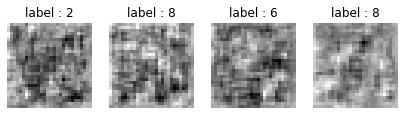

Generator loss: 1.3860703 Discriminator loss: 2.745868
epoch 0 & 200/235 Result


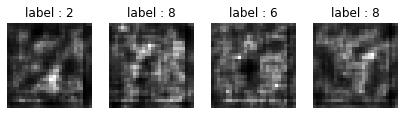

Generator loss: 2.6248095 Discriminator loss: 0.75679463
Time for epoch 1 is 25.43344259262085 sec
epoch 1 & 0/235 Result


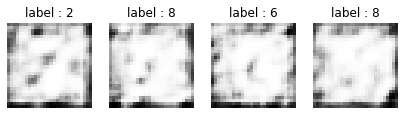

Generator loss: 1.7804326 Discriminator loss: 1.5924859
epoch 1 & 200/235 Result


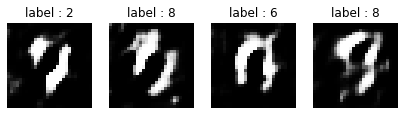

Generator loss: 0.9720447 Discriminator loss: 2.1478362
Time for epoch 2 is 21.77869939804077 sec
epoch 2 & 0/235 Result


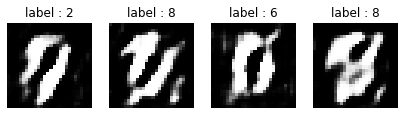

Generator loss: 1.2011571 Discriminator loss: 1.726632
epoch 2 & 200/235 Result


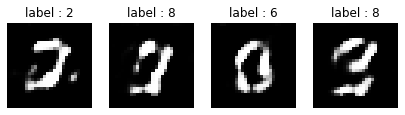

Generator loss: 0.8379746 Discriminator loss: 1.7808573
Time for epoch 3 is 21.96390175819397 sec
epoch 3 & 0/235 Result


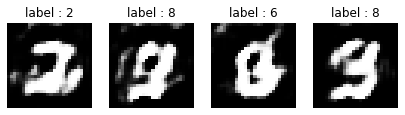

Generator loss: 1.0701939 Discriminator loss: 1.5862954
epoch 3 & 200/235 Result


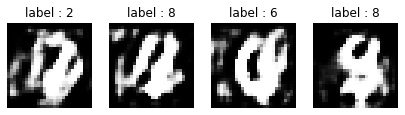

Generator loss: 0.60111225 Discriminator loss: 2.2952952
Time for epoch 4 is 22.32008457183838 sec
epoch 4 & 0/235 Result


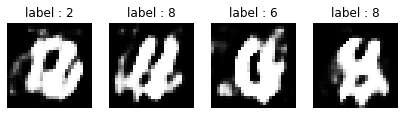

Generator loss: 2.0466537 Discriminator loss: 0.8254039
epoch 4 & 200/235 Result


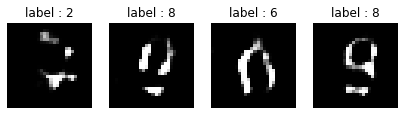

Generator loss: 1.4460716 Discriminator loss: 0.986082
Time for epoch 5 is 22.31383514404297 sec
epoch 5 & 0/235 Result


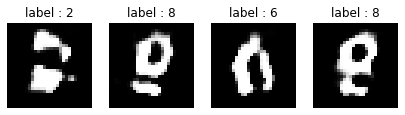

Generator loss: 0.80021185 Discriminator loss: 1.6537005
epoch 5 & 200/235 Result


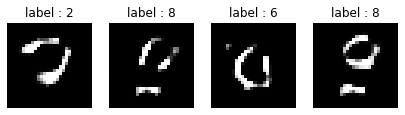

Generator loss: 1.1537788 Discriminator loss: 1.2185628
Time for epoch 6 is 22.42384099960327 sec
epoch 6 & 0/235 Result


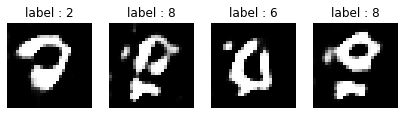

Generator loss: 0.6949673 Discriminator loss: 1.6870742
epoch 6 & 200/235 Result


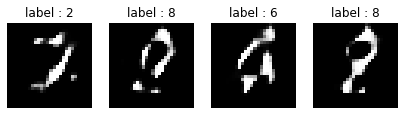

Generator loss: 0.5715587 Discriminator loss: 1.8447769
Time for epoch 7 is 22.542542934417725 sec
epoch 7 & 0/235 Result


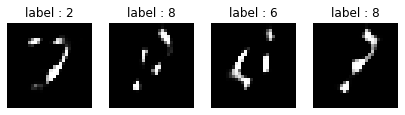

Generator loss: 1.347102 Discriminator loss: 1.0845876
epoch 7 & 200/235 Result


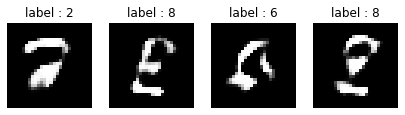

Generator loss: 0.49188864 Discriminator loss: 1.8519584
Time for epoch 8 is 22.593358755111694 sec
epoch 8 & 0/235 Result


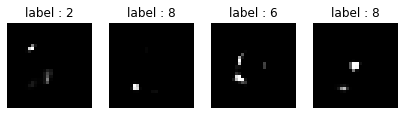

Generator loss: 0.82236326 Discriminator loss: 1.9218147
epoch 8 & 200/235 Result


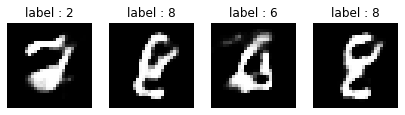

Generator loss: 0.61190385 Discriminator loss: 1.7252302
Time for epoch 9 is 22.70142149925232 sec
epoch 9 & 0/235 Result


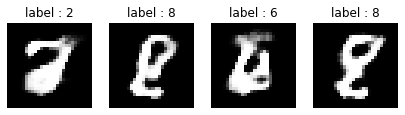

Generator loss: 0.79500777 Discriminator loss: 1.4893844
epoch 9 & 200/235 Result


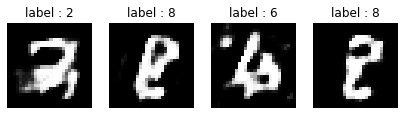

Generator loss: 1.0144129 Discriminator loss: 1.1678654
Time for epoch 10 is 22.945632934570312 sec
epoch 10 & 0/235 Result


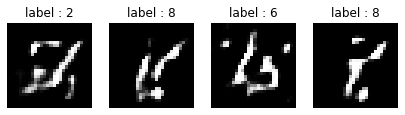

Generator loss: 0.8724762 Discriminator loss: 1.3579634
epoch 10 & 200/235 Result


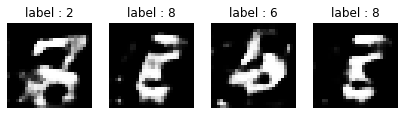

Generator loss: 0.7940347 Discriminator loss: 1.3710895
Time for epoch 11 is 22.85081934928894 sec
epoch 11 & 0/235 Result


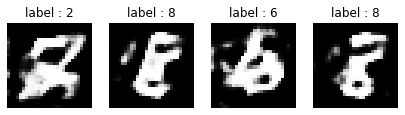

Generator loss: 1.2798955 Discriminator loss: 0.9491665
epoch 11 & 200/235 Result


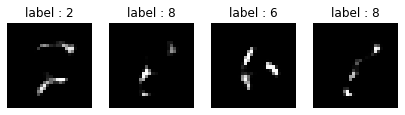

Generator loss: 0.8121984 Discriminator loss: 1.6300527
Time for epoch 12 is 22.877606868743896 sec
epoch 12 & 0/235 Result


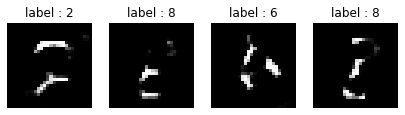

Generator loss: 1.6625628 Discriminator loss: 0.8122629
epoch 12 & 200/235 Result


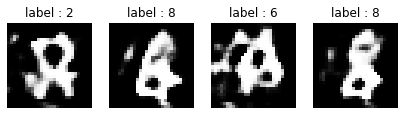

Generator loss: 0.8795762 Discriminator loss: 1.5280731
Time for epoch 13 is 22.963818073272705 sec
epoch 13 & 0/235 Result


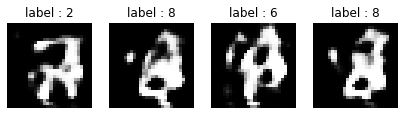

Generator loss: 1.1259538 Discriminator loss: 0.98590344
epoch 13 & 200/235 Result


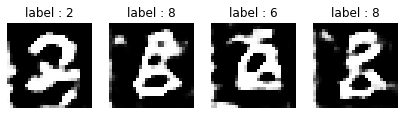

Generator loss: 0.98387 Discriminator loss: 1.328144
Time for epoch 14 is 22.912617683410645 sec
epoch 14 & 0/235 Result


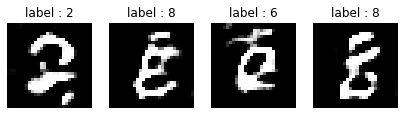

Generator loss: 1.0311224 Discriminator loss: 1.2373762
epoch 14 & 200/235 Result


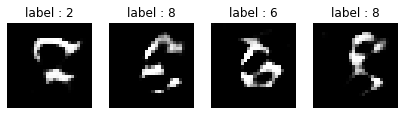

Generator loss: 0.6579093 Discriminator loss: 1.8284386
Time for epoch 15 is 22.890485763549805 sec
epoch 15 & 0/235 Result


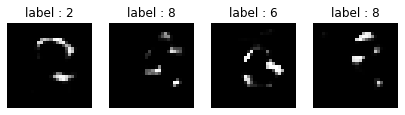

Generator loss: 1.2478993 Discriminator loss: 0.9935229
epoch 15 & 200/235 Result


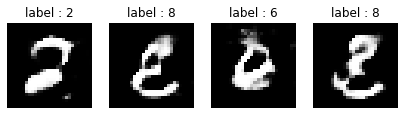

Generator loss: 0.848875 Discriminator loss: 1.454703
Time for epoch 16 is 23.11876392364502 sec
epoch 16 & 0/235 Result


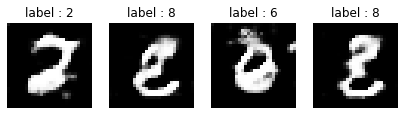

Generator loss: 0.88316864 Discriminator loss: 1.3348979
epoch 16 & 200/235 Result


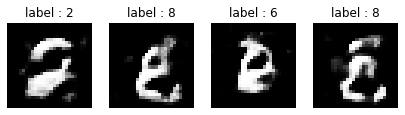

Generator loss: 0.9218618 Discriminator loss: 1.3175826
Time for epoch 17 is 22.915432929992676 sec
epoch 17 & 0/235 Result


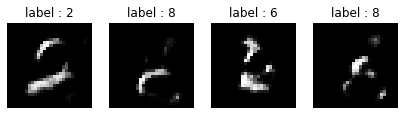

Generator loss: 1.0090675 Discriminator loss: 1.3283663
epoch 17 & 200/235 Result


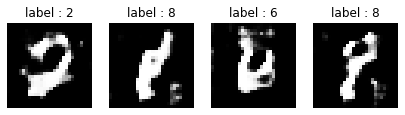

Generator loss: 0.75564116 Discriminator loss: 1.5769482
Time for epoch 18 is 22.89647078514099 sec
epoch 18 & 0/235 Result


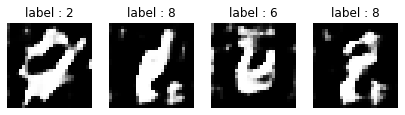

Generator loss: 1.1264995 Discriminator loss: 0.99946207
epoch 18 & 200/235 Result


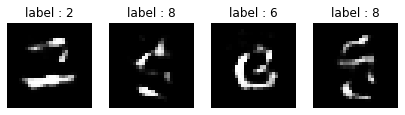

Generator loss: 0.99262565 Discriminator loss: 1.381097
Time for epoch 19 is 22.942877292633057 sec
epoch 19 & 0/235 Result


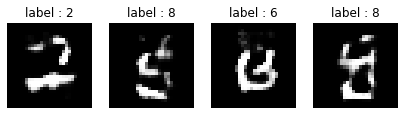

Generator loss: 1.1429673 Discriminator loss: 1.2038963
epoch 19 & 200/235 Result


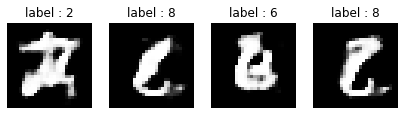

Generator loss: 1.1330367 Discriminator loss: 1.0530294
Time for epoch 20 is 22.968241930007935 sec
epoch 20 & 0/235 Result


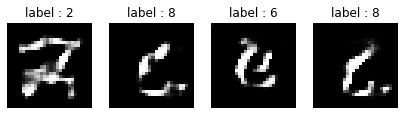

Generator loss: 0.5795091 Discriminator loss: 1.8589996
epoch 20 & 200/235 Result


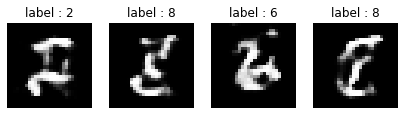

Generator loss: 0.951819 Discriminator loss: 1.2099389
Time for epoch 21 is 22.923213005065918 sec
epoch 21 & 0/235 Result


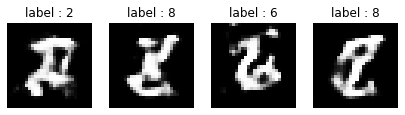

Generator loss: 0.95042056 Discriminator loss: 1.3367265
epoch 21 & 200/235 Result


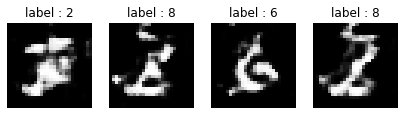

Generator loss: 0.7402515 Discriminator loss: 1.6162215
Time for epoch 22 is 23.07461166381836 sec
epoch 22 & 0/235 Result


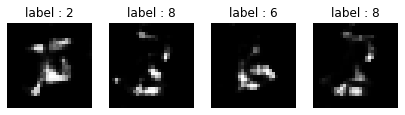

Generator loss: 1.1188431 Discriminator loss: 1.2317526
epoch 22 & 200/235 Result


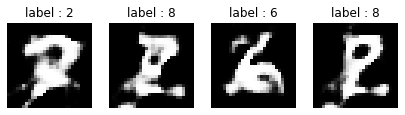

Generator loss: 0.8848967 Discriminator loss: 1.261812
Time for epoch 23 is 22.86669421195984 sec
epoch 23 & 0/235 Result


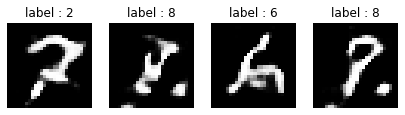

Generator loss: 0.76949954 Discriminator loss: 1.6850094
epoch 23 & 200/235 Result


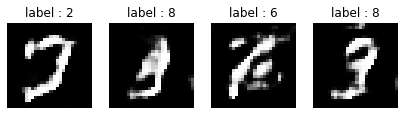

Generator loss: 1.1914302 Discriminator loss: 1.2725009
Time for epoch 24 is 22.854737281799316 sec
epoch 24 & 0/235 Result


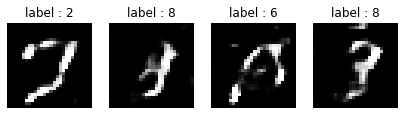

Generator loss: 0.9479518 Discriminator loss: 1.533542
epoch 24 & 200/235 Result


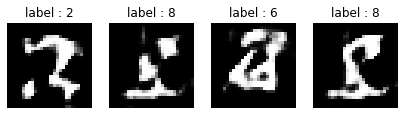

Generator loss: 1.0237839 Discriminator loss: 1.1087726
Time for epoch 25 is 22.881351470947266 sec
epoch 25 & 0/235 Result


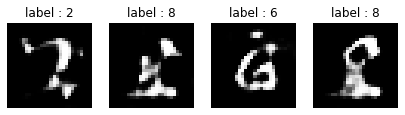

Generator loss: 1.0561397 Discriminator loss: 1.2382289
epoch 25 & 200/235 Result


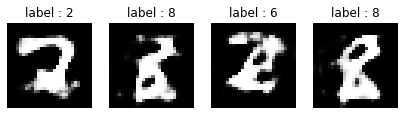

Generator loss: 1.1260604 Discriminator loss: 1.1319594
Time for epoch 26 is 22.90338945388794 sec
epoch 26 & 0/235 Result


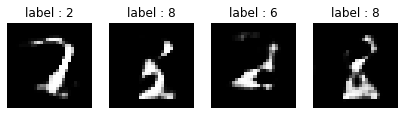

Generator loss: 0.86639214 Discriminator loss: 1.4386555
epoch 26 & 200/235 Result


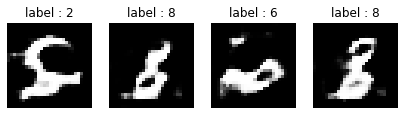

Generator loss: 1.3240538 Discriminator loss: 0.971086
Time for epoch 27 is 22.91492009162903 sec
epoch 27 & 0/235 Result


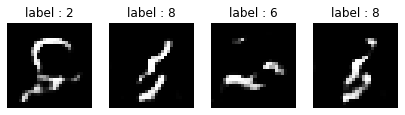

Generator loss: 1.1141605 Discriminator loss: 1.2451787
epoch 27 & 200/235 Result


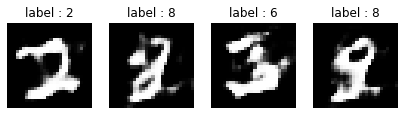

Generator loss: 1.2748293 Discriminator loss: 1.0205526
Time for epoch 28 is 23.11979031562805 sec
epoch 28 & 0/235 Result


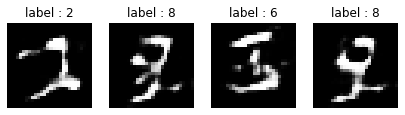

Generator loss: 0.89054334 Discriminator loss: 1.6627743
epoch 28 & 200/235 Result


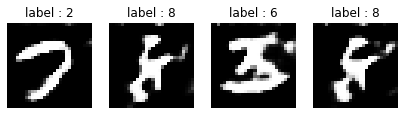

Generator loss: 1.1757051 Discriminator loss: 1.1562408
Time for epoch 29 is 22.904841661453247 sec
epoch 29 & 0/235 Result


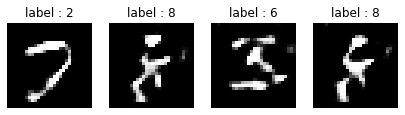

Generator loss: 1.244543 Discriminator loss: 1.0335675
epoch 29 & 200/235 Result


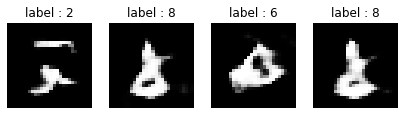

Generator loss: 1.0749499 Discriminator loss: 1.2510822
Time for epoch 30 is 22.911975383758545 sec
epoch 30 & 0/235 Result


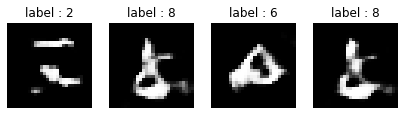

Generator loss: 1.2611573 Discriminator loss: 1.085255
epoch 30 & 200/235 Result


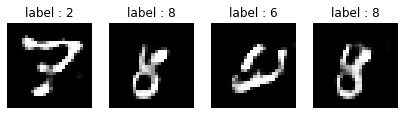

Generator loss: 1.0886279 Discriminator loss: 1.2547729
Time for epoch 31 is 22.827802896499634 sec
epoch 31 & 0/235 Result


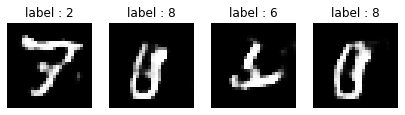

Generator loss: 1.1260465 Discriminator loss: 1.0395677
epoch 31 & 200/235 Result


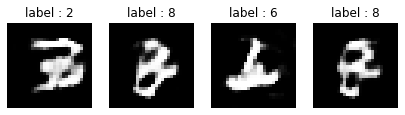

Generator loss: 1.1156874 Discriminator loss: 1.0406706
Time for epoch 32 is 22.753645658493042 sec
epoch 32 & 0/235 Result


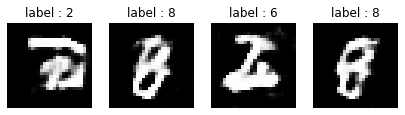

Generator loss: 1.2092586 Discriminator loss: 1.0813094
epoch 32 & 200/235 Result


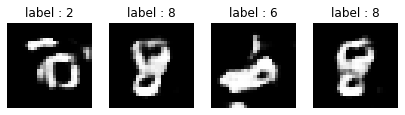

Generator loss: 1.218711 Discriminator loss: 1.0326375
Time for epoch 33 is 22.760035276412964 sec
epoch 33 & 0/235 Result


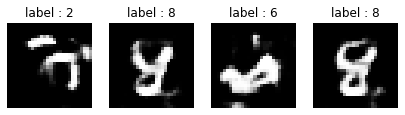

Generator loss: 1.1054286 Discriminator loss: 1.193767
epoch 33 & 200/235 Result


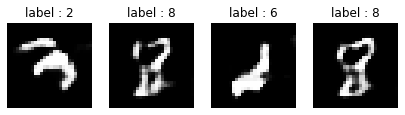

Generator loss: 1.0346472 Discriminator loss: 1.182035
Time for epoch 34 is 22.946685075759888 sec
epoch 34 & 0/235 Result


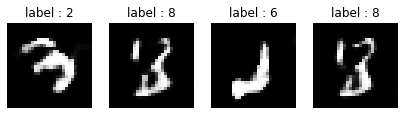

Generator loss: 0.9911231 Discriminator loss: 1.2218398
epoch 34 & 200/235 Result


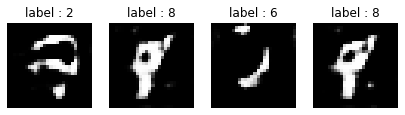

Generator loss: 1.2751364 Discriminator loss: 1.0886762
Time for epoch 35 is 22.7123441696167 sec
epoch 35 & 0/235 Result


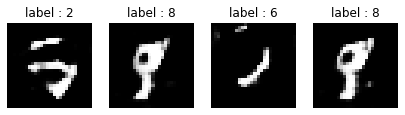

Generator loss: 1.1583202 Discriminator loss: 1.1913967
epoch 35 & 200/235 Result


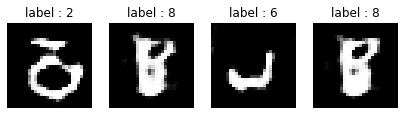

Generator loss: 1.2078394 Discriminator loss: 1.0145115
Time for epoch 36 is 22.721369981765747 sec
epoch 36 & 0/235 Result


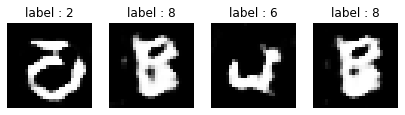

Generator loss: 1.4320595 Discriminator loss: 1.0764331
epoch 36 & 200/235 Result


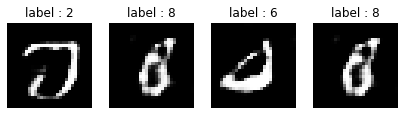

Generator loss: 1.2173829 Discriminator loss: 1.2654436
Time for epoch 37 is 22.735832452774048 sec
epoch 37 & 0/235 Result


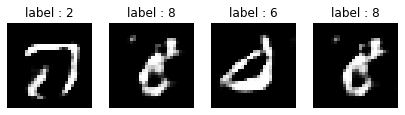

Generator loss: 1.1558453 Discriminator loss: 1.2324302
epoch 37 & 200/235 Result


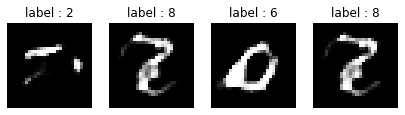

Generator loss: 1.2937725 Discriminator loss: 1.0642048
Time for epoch 38 is 22.79292106628418 sec
epoch 38 & 0/235 Result


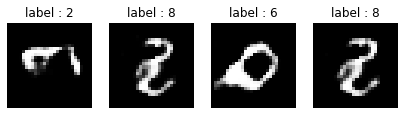

Generator loss: 1.4033071 Discriminator loss: 1.1996763
epoch 38 & 200/235 Result


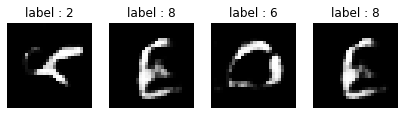

Generator loss: 1.3729677 Discriminator loss: 1.3182471
Time for epoch 39 is 22.811192512512207 sec
epoch 39 & 0/235 Result


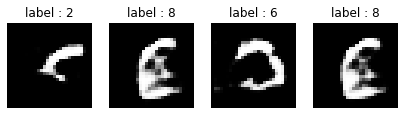

Generator loss: 0.9902895 Discriminator loss: 1.3473247
epoch 39 & 200/235 Result


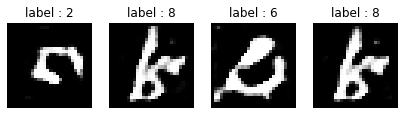

Generator loss: 1.1127086 Discriminator loss: 1.1569568
Time for epoch 40 is 23.095553874969482 sec
epoch 40 & 0/235 Result


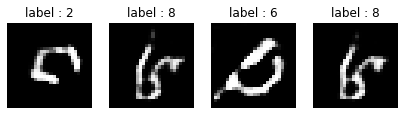

Generator loss: 1.404119 Discriminator loss: 0.99559057
epoch 40 & 200/235 Result


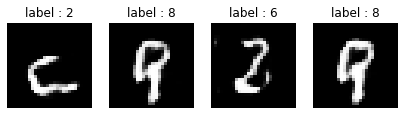

Generator loss: 1.3602635 Discriminator loss: 1.0508491
Time for epoch 41 is 22.92033076286316 sec
epoch 41 & 0/235 Result


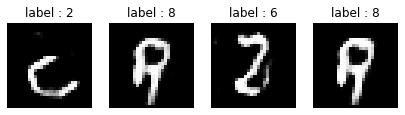

Generator loss: 1.3132324 Discriminator loss: 1.1780963
epoch 41 & 200/235 Result


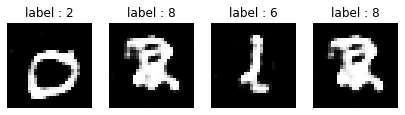

Generator loss: 1.1118323 Discriminator loss: 1.156931
Time for epoch 42 is 22.85856604576111 sec
epoch 42 & 0/235 Result


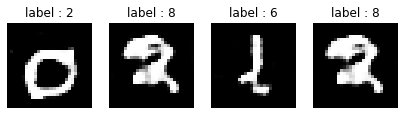

Generator loss: 1.2962908 Discriminator loss: 1.0127215
epoch 42 & 200/235 Result


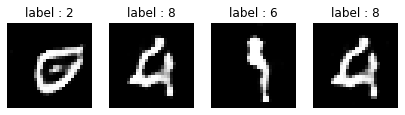

Generator loss: 1.3455666 Discriminator loss: 1.0644754
Time for epoch 43 is 22.87846612930298 sec
epoch 43 & 0/235 Result


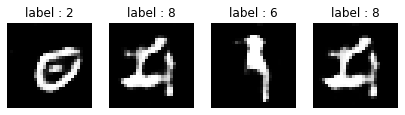

Generator loss: 1.3566422 Discriminator loss: 1.1578056
epoch 43 & 200/235 Result


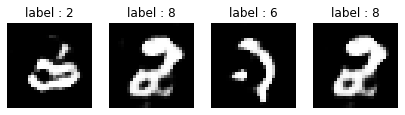

Generator loss: 1.2061028 Discriminator loss: 1.0099329
Time for epoch 44 is 22.88168740272522 sec
epoch 44 & 0/235 Result


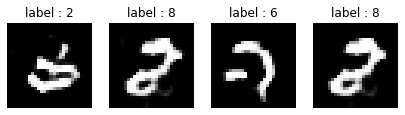

Generator loss: 1.2366443 Discriminator loss: 1.0100236
epoch 44 & 200/235 Result


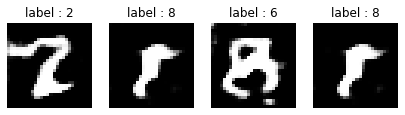

Generator loss: 1.6117035 Discriminator loss: 0.98863196
Time for epoch 45 is 22.78352117538452 sec
epoch 45 & 0/235 Result


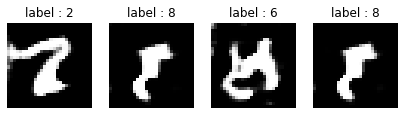

Generator loss: 1.6715184 Discriminator loss: 1.0184736
epoch 45 & 200/235 Result


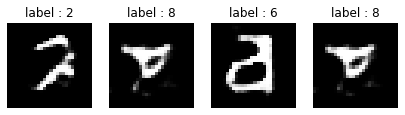

Generator loss: 1.2820405 Discriminator loss: 1.1024055
Time for epoch 46 is 22.94407606124878 sec
epoch 46 & 0/235 Result


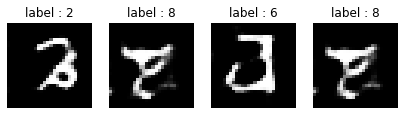

Generator loss: 1.2762463 Discriminator loss: 1.1621284
epoch 46 & 200/235 Result


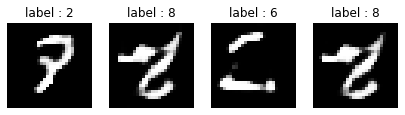

Generator loss: 1.5115592 Discriminator loss: 0.87584835
Time for epoch 47 is 22.767441987991333 sec
epoch 47 & 0/235 Result


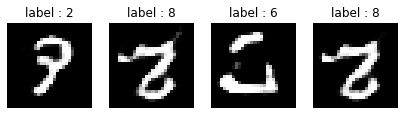

Generator loss: 1.4331465 Discriminator loss: 0.93694246
epoch 47 & 200/235 Result


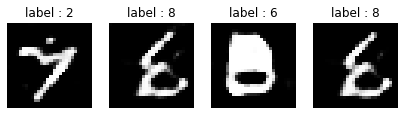

Generator loss: 1.2938192 Discriminator loss: 0.98272073
Time for epoch 48 is 22.72108483314514 sec
epoch 48 & 0/235 Result


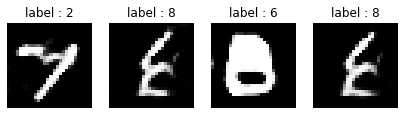

Generator loss: 1.3505744 Discriminator loss: 1.0107409
epoch 48 & 200/235 Result


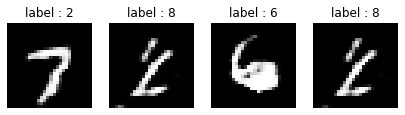

Generator loss: 1.4070406 Discriminator loss: 0.9652454
Time for epoch 49 is 22.74131679534912 sec
epoch 49 & 0/235 Result


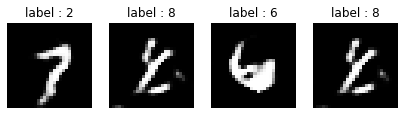

Generator loss: 1.3524942 Discriminator loss: 0.97333556
epoch 49 & 200/235 Result


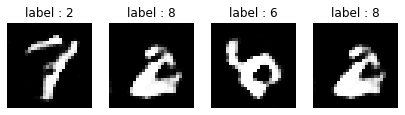

Generator loss: 1.278646 Discriminator loss: 1.0212955
Time for epoch 50 is 22.71230387687683 sec
epoch 50 & 0/235 Result


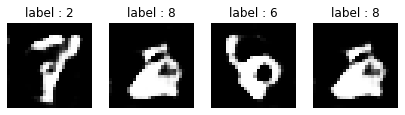

Generator loss: 1.5774035 Discriminator loss: 0.82998747
epoch 50 & 200/235 Result


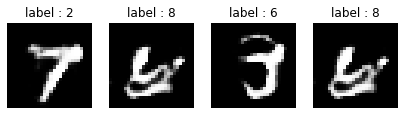

Generator loss: 1.716877 Discriminator loss: 0.9915898
Time for epoch 51 is 22.754637479782104 sec
epoch 51 & 0/235 Result


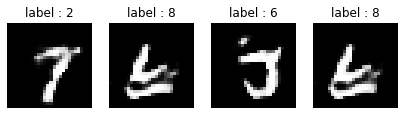

Generator loss: 1.4625396 Discriminator loss: 1.10428
epoch 51 & 200/235 Result


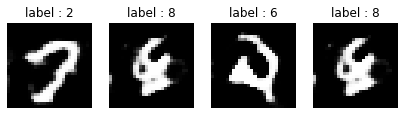

Generator loss: 1.419546 Discriminator loss: 0.92531586
Time for epoch 52 is 22.967442512512207 sec
epoch 52 & 0/235 Result


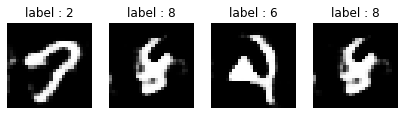

Generator loss: 1.4241081 Discriminator loss: 0.99442774
epoch 52 & 200/235 Result


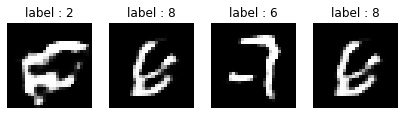

Generator loss: 1.2129672 Discriminator loss: 1.0665733
Time for epoch 53 is 22.800184965133667 sec
epoch 53 & 0/235 Result


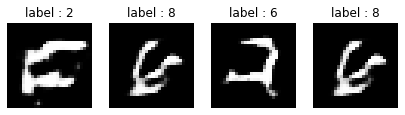

Generator loss: 1.3010479 Discriminator loss: 1.0871404
epoch 53 & 200/235 Result


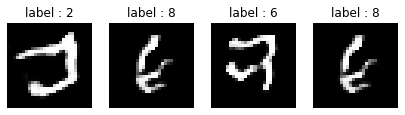

Generator loss: 1.230555 Discriminator loss: 1.00851
Time for epoch 54 is 22.82363224029541 sec
epoch 54 & 0/235 Result


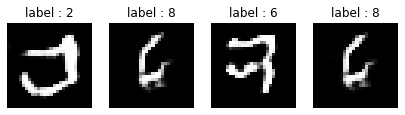

Generator loss: 1.3905534 Discriminator loss: 1.0934585
epoch 54 & 200/235 Result


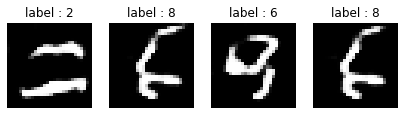

Generator loss: 1.5455867 Discriminator loss: 1.0499072
Time for epoch 55 is 22.78700613975525 sec
epoch 55 & 0/235 Result


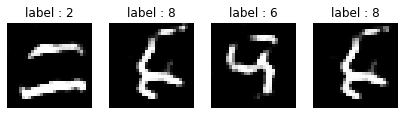

Generator loss: 1.5230541 Discriminator loss: 1.0891728
epoch 55 & 200/235 Result


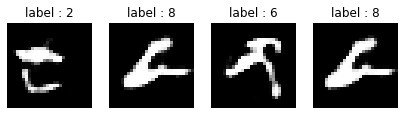

Generator loss: 1.6654718 Discriminator loss: 0.7188633
Time for epoch 56 is 22.83686661720276 sec
epoch 56 & 0/235 Result


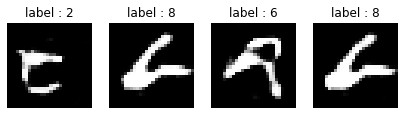

Generator loss: 1.5751339 Discriminator loss: 0.8678272
epoch 56 & 200/235 Result


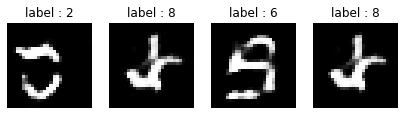

Generator loss: 1.4619223 Discriminator loss: 1.1867586
Time for epoch 57 is 22.816092014312744 sec
epoch 57 & 0/235 Result


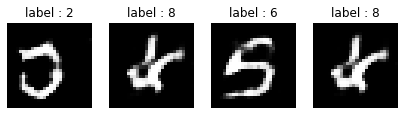

Generator loss: 1.3426783 Discriminator loss: 1.189068
epoch 57 & 200/235 Result


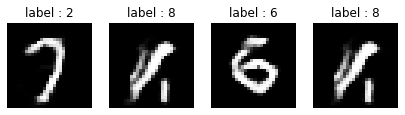

Generator loss: 1.3131263 Discriminator loss: 1.0188667
Time for epoch 58 is 23.017295360565186 sec
epoch 58 & 0/235 Result


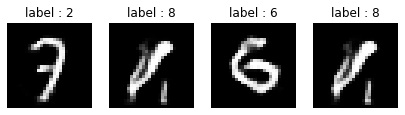

Generator loss: 1.2826263 Discriminator loss: 1.1501805
epoch 58 & 200/235 Result


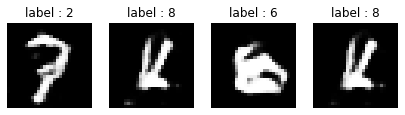

Generator loss: 1.4606261 Discriminator loss: 1.0589083
Time for epoch 59 is 22.800259113311768 sec
epoch 59 & 0/235 Result


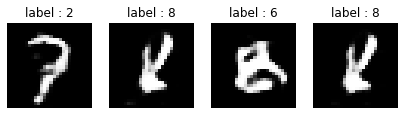

Generator loss: 1.2355735 Discriminator loss: 1.1484107
epoch 59 & 200/235 Result


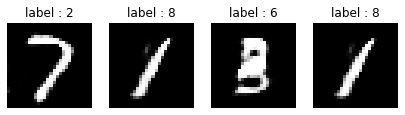

Generator loss: 1.2631805 Discriminator loss: 1.0937475
Time for epoch 60 is 22.780245065689087 sec
epoch 60 & 0/235 Result


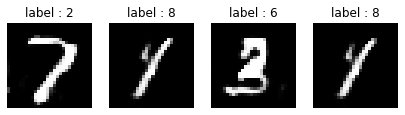

Generator loss: 1.3156117 Discriminator loss: 1.0580024
epoch 60 & 200/235 Result


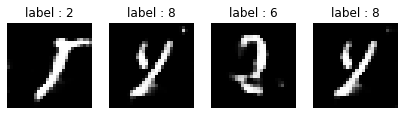

Generator loss: 1.4847854 Discriminator loss: 0.9429229
Time for epoch 61 is 22.77899479866028 sec
epoch 61 & 0/235 Result


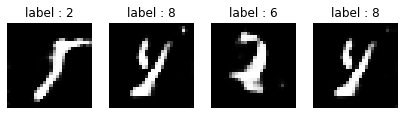

Generator loss: 1.3605508 Discriminator loss: 0.97879595
epoch 61 & 200/235 Result


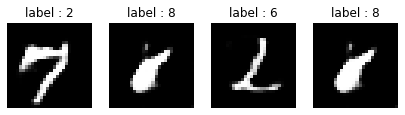

Generator loss: 1.2735668 Discriminator loss: 1.176936
Time for epoch 62 is 22.785277605056763 sec
epoch 62 & 0/235 Result


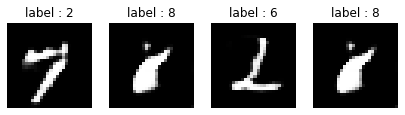

Generator loss: 1.4434954 Discriminator loss: 1.1322966
epoch 62 & 200/235 Result


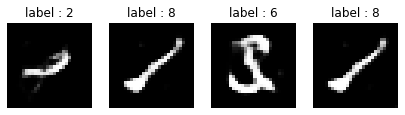

Generator loss: 1.3388997 Discriminator loss: 1.0684353
Time for epoch 63 is 22.816517114639282 sec
epoch 63 & 0/235 Result


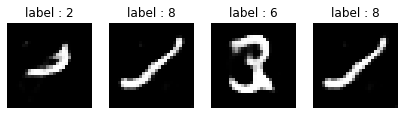

Generator loss: 1.3842148 Discriminator loss: 1.0875871
epoch 63 & 200/235 Result


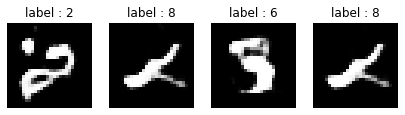

Generator loss: 1.4513357 Discriminator loss: 0.9078356
Time for epoch 64 is 23.01905345916748 sec
epoch 64 & 0/235 Result


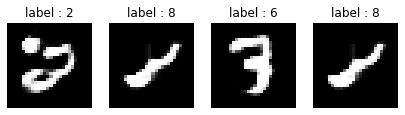

Generator loss: 1.5060215 Discriminator loss: 1.0535089
epoch 64 & 200/235 Result


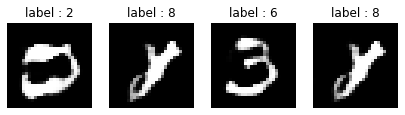

Generator loss: 1.6623405 Discriminator loss: 0.8756836
Time for epoch 65 is 22.834502458572388 sec
epoch 65 & 0/235 Result


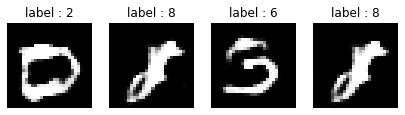

Generator loss: 1.5531284 Discriminator loss: 1.0506343
epoch 65 & 200/235 Result


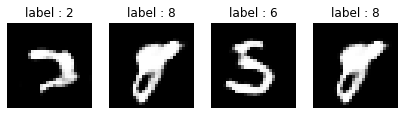

Generator loss: 1.6991795 Discriminator loss: 0.9198887
Time for epoch 66 is 22.921272039413452 sec
epoch 66 & 0/235 Result


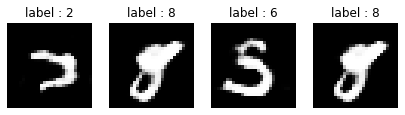

Generator loss: 1.4525826 Discriminator loss: 1.0655471
epoch 66 & 200/235 Result


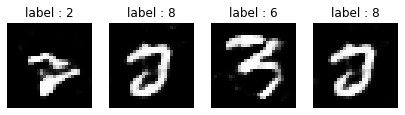

Generator loss: 1.2843432 Discriminator loss: 1.2508755
Time for epoch 67 is 22.90254855155945 sec
epoch 67 & 0/235 Result


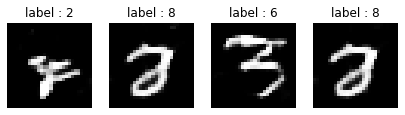

Generator loss: 1.4357662 Discriminator loss: 1.0155677
epoch 67 & 200/235 Result


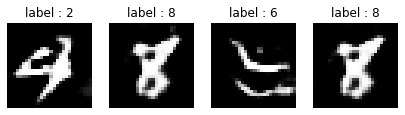

Generator loss: 1.5146774 Discriminator loss: 0.9315855
Time for epoch 68 is 22.877386331558228 sec
epoch 68 & 0/235 Result


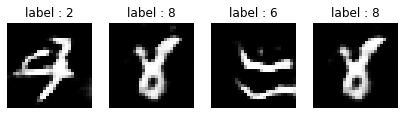

Generator loss: 1.4133004 Discriminator loss: 1.0204462
epoch 68 & 200/235 Result


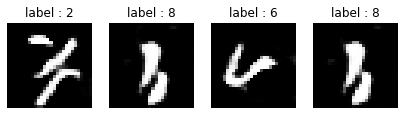

Generator loss: 1.6849234 Discriminator loss: 0.75333756
Time for epoch 69 is 22.83939290046692 sec
epoch 69 & 0/235 Result


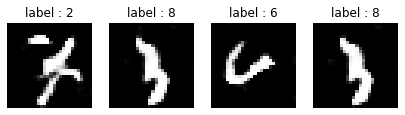

Generator loss: 1.7155644 Discriminator loss: 0.8367228
epoch 69 & 200/235 Result


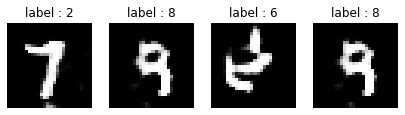

Generator loss: 1.8461758 Discriminator loss: 0.93132323
Time for epoch 70 is 23.00407123565674 sec
epoch 70 & 0/235 Result


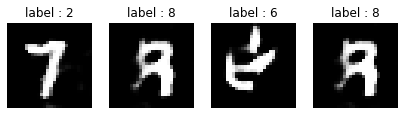

Generator loss: 1.7715015 Discriminator loss: 0.8086451
epoch 70 & 200/235 Result


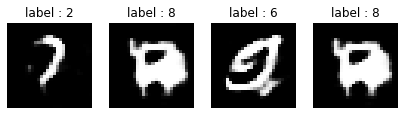

Generator loss: 1.6618906 Discriminator loss: 0.8628468
Time for epoch 71 is 22.798532962799072 sec
epoch 71 & 0/235 Result


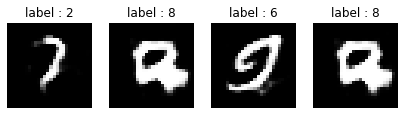

Generator loss: 1.8194717 Discriminator loss: 0.90430826
epoch 71 & 200/235 Result


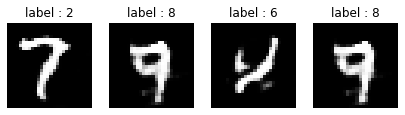

Generator loss: 1.5411688 Discriminator loss: 1.0047915
Time for epoch 72 is 22.81907081604004 sec
epoch 72 & 0/235 Result


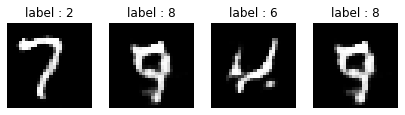

Generator loss: 1.4029379 Discriminator loss: 1.0914538
epoch 72 & 200/235 Result


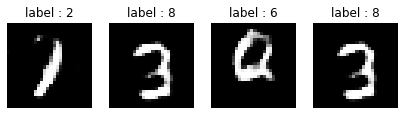

Generator loss: 1.5515548 Discriminator loss: 0.9080242
Time for epoch 73 is 22.833158016204834 sec
epoch 73 & 0/235 Result


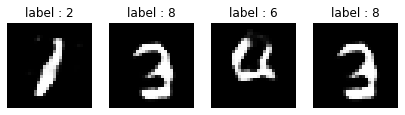

Generator loss: 1.5294806 Discriminator loss: 0.96171665
epoch 73 & 200/235 Result


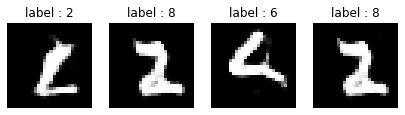

Generator loss: 1.7704091 Discriminator loss: 1.0397221
Time for epoch 74 is 22.84304690361023 sec
epoch 74 & 0/235 Result


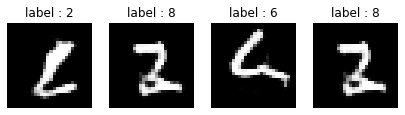

Generator loss: 1.7123624 Discriminator loss: 1.0267633
epoch 74 & 200/235 Result


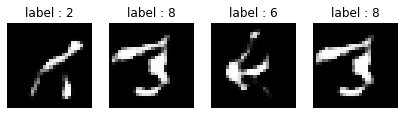

Generator loss: 2.3108256 Discriminator loss: 0.86113656
Time for epoch 75 is 22.85971474647522 sec
epoch 75 & 0/235 Result


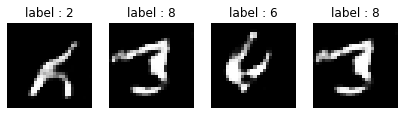

Generator loss: 2.054049 Discriminator loss: 0.8282809
epoch 75 & 200/235 Result


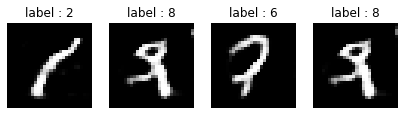

Generator loss: 1.648383 Discriminator loss: 0.96757054
Time for epoch 76 is 23.033324241638184 sec
epoch 76 & 0/235 Result


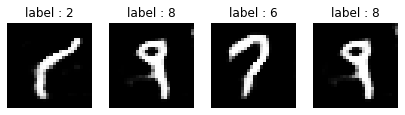

Generator loss: 1.5401245 Discriminator loss: 1.1241542
epoch 76 & 200/235 Result


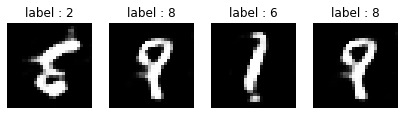

Generator loss: 1.9201885 Discriminator loss: 0.93938583
Time for epoch 77 is 22.797505378723145 sec
epoch 77 & 0/235 Result


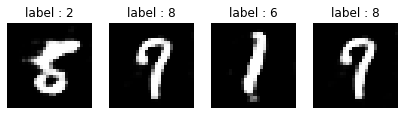

Generator loss: 1.7282959 Discriminator loss: 0.98986715
epoch 77 & 200/235 Result


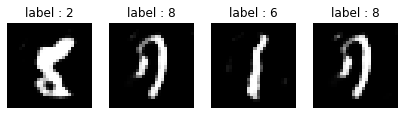

Generator loss: 1.4643084 Discriminator loss: 1.0750324
Time for epoch 78 is 22.80125141143799 sec
epoch 78 & 0/235 Result


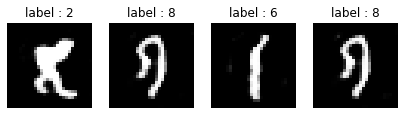

Generator loss: 1.7539183 Discriminator loss: 0.9097197
epoch 78 & 200/235 Result


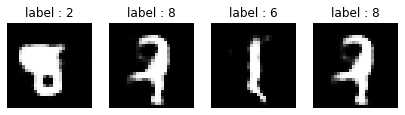

Generator loss: 1.6682947 Discriminator loss: 0.8635783
Time for epoch 79 is 22.80951189994812 sec
epoch 79 & 0/235 Result


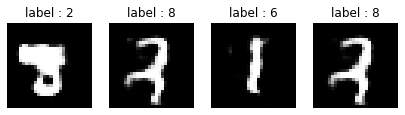

Generator loss: 1.6933444 Discriminator loss: 0.9286629
epoch 79 & 200/235 Result


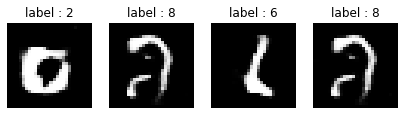

Generator loss: 1.6936711 Discriminator loss: 1.0578896
Time for epoch 80 is 22.785775661468506 sec
epoch 80 & 0/235 Result


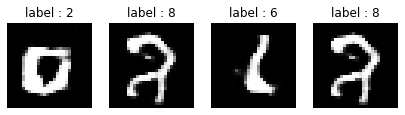

Generator loss: 1.430856 Discriminator loss: 1.1209972
epoch 80 & 200/235 Result


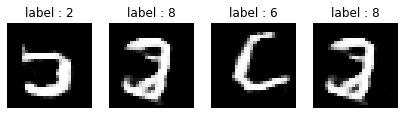

Generator loss: 1.4446431 Discriminator loss: 1.0133808
Time for epoch 81 is 22.766887187957764 sec
epoch 81 & 0/235 Result


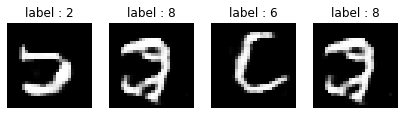

Generator loss: 1.7550212 Discriminator loss: 0.96706694
epoch 81 & 200/235 Result


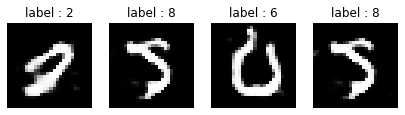

Generator loss: 1.7754788 Discriminator loss: 1.0249826
Time for epoch 82 is 22.95592761039734 sec
epoch 82 & 0/235 Result


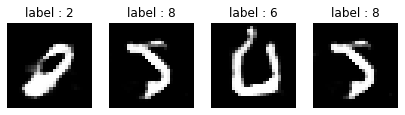

Generator loss: 1.6569124 Discriminator loss: 0.96808106
epoch 82 & 200/235 Result


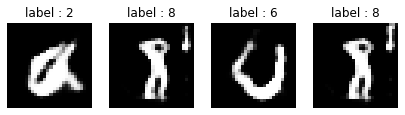

Generator loss: 1.7941233 Discriminator loss: 0.8157865
Time for epoch 83 is 22.7804012298584 sec
epoch 83 & 0/235 Result


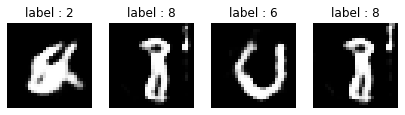

Generator loss: 1.9224659 Discriminator loss: 0.9889783
epoch 83 & 200/235 Result


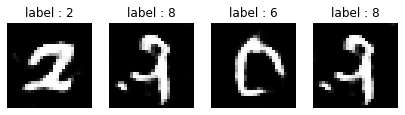

Generator loss: 1.7304258 Discriminator loss: 0.9668257
Time for epoch 84 is 22.760934829711914 sec
epoch 84 & 0/235 Result


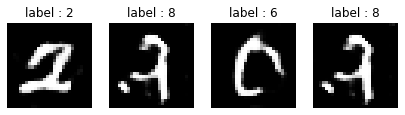

Generator loss: 1.635792 Discriminator loss: 1.1051779
epoch 84 & 200/235 Result


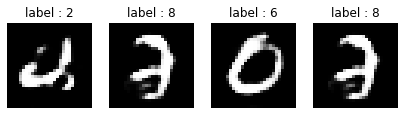

Generator loss: 1.602708 Discriminator loss: 1.022665
Time for epoch 85 is 22.786965131759644 sec
epoch 85 & 0/235 Result


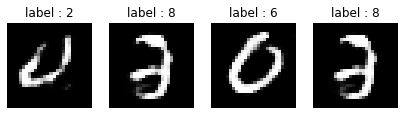

Generator loss: 1.9610676 Discriminator loss: 0.9306839
epoch 85 & 200/235 Result


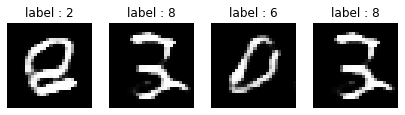

Generator loss: 1.7166376 Discriminator loss: 0.9767684
Time for epoch 86 is 22.802685737609863 sec
epoch 86 & 0/235 Result


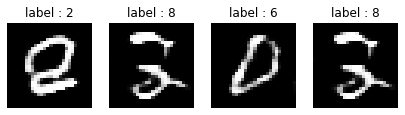

Generator loss: 1.8179868 Discriminator loss: 0.9233337
epoch 86 & 200/235 Result


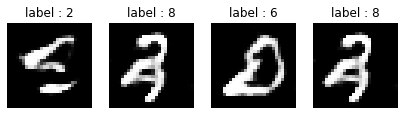

Generator loss: 1.5056897 Discriminator loss: 1.0235673
Time for epoch 87 is 22.83982229232788 sec
epoch 87 & 0/235 Result


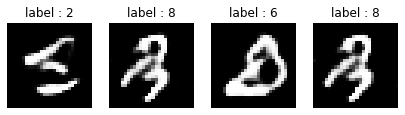

Generator loss: 1.5647417 Discriminator loss: 1.026233
epoch 87 & 200/235 Result


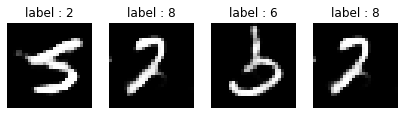

Generator loss: 1.6181977 Discriminator loss: 1.0539573
Time for epoch 88 is 23.07627844810486 sec
epoch 88 & 0/235 Result


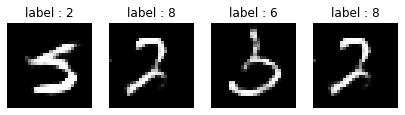

Generator loss: 1.7525617 Discriminator loss: 0.8983189
epoch 88 & 200/235 Result


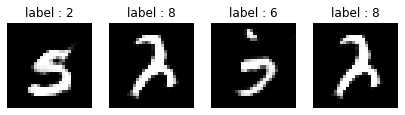

Generator loss: 1.6931133 Discriminator loss: 0.8702488
Time for epoch 89 is 22.807421445846558 sec
epoch 89 & 0/235 Result


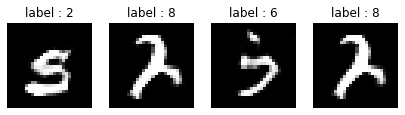

Generator loss: 1.7525282 Discriminator loss: 1.0223435
epoch 89 & 200/235 Result


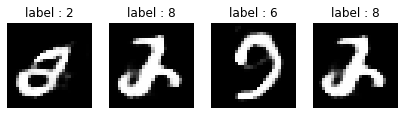

Generator loss: 1.7266064 Discriminator loss: 0.8687858
Time for epoch 90 is 22.8376305103302 sec
epoch 90 & 0/235 Result


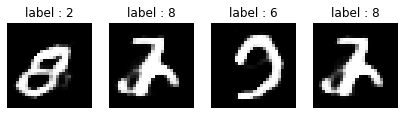

Generator loss: 1.7752469 Discriminator loss: 0.98681283
epoch 90 & 200/235 Result


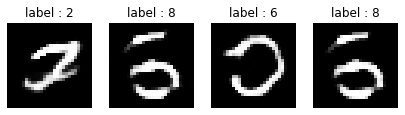

Generator loss: 1.7332749 Discriminator loss: 0.944347
Time for epoch 91 is 22.822591543197632 sec
epoch 91 & 0/235 Result


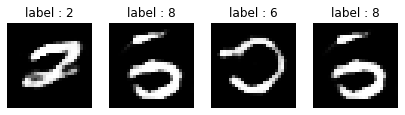

Generator loss: 1.8152758 Discriminator loss: 0.8813145
epoch 91 & 200/235 Result


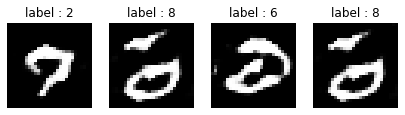

Generator loss: 1.709347 Discriminator loss: 0.7959277
Time for epoch 92 is 22.823655128479004 sec
epoch 92 & 0/235 Result


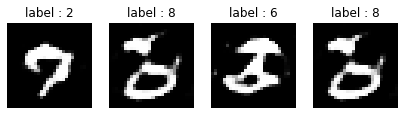

Generator loss: 1.4586828 Discriminator loss: 0.96970147
epoch 92 & 200/235 Result


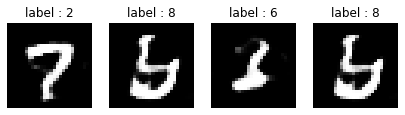

Generator loss: 1.7222818 Discriminator loss: 0.9396628
Time for epoch 93 is 22.882659196853638 sec
epoch 93 & 0/235 Result


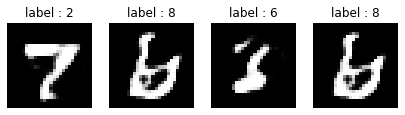

Generator loss: 1.7083653 Discriminator loss: 0.86318266
epoch 93 & 200/235 Result


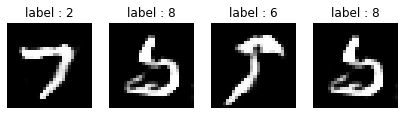

Generator loss: 1.5874355 Discriminator loss: 1.0234025
Time for epoch 94 is 23.019150972366333 sec
epoch 94 & 0/235 Result


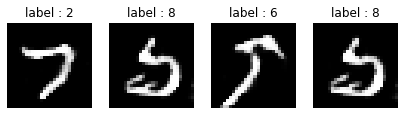

Generator loss: 1.6534048 Discriminator loss: 0.98474467
epoch 94 & 200/235 Result


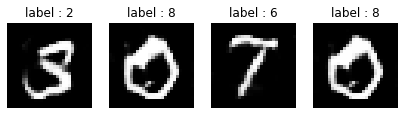

Generator loss: 1.8874416 Discriminator loss: 0.91825825
Time for epoch 95 is 22.785728216171265 sec
epoch 95 & 0/235 Result


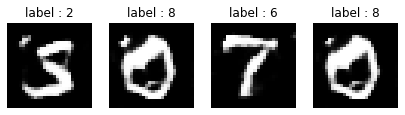

Generator loss: 2.149406 Discriminator loss: 0.94694984
epoch 95 & 200/235 Result


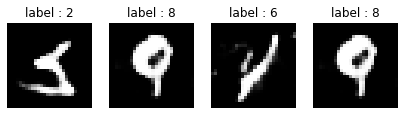

Generator loss: 1.6524924 Discriminator loss: 0.89640594
Time for epoch 96 is 22.75448513031006 sec
epoch 96 & 0/235 Result


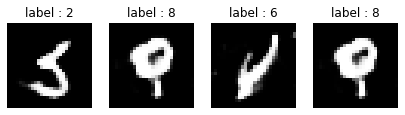

Generator loss: 1.4841222 Discriminator loss: 1.0420293
epoch 96 & 200/235 Result


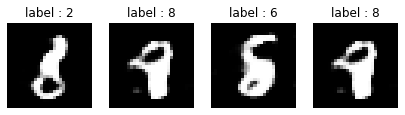

Generator loss: 1.6185869 Discriminator loss: 0.9108939
Time for epoch 97 is 22.730019330978394 sec
epoch 97 & 0/235 Result


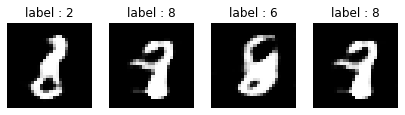

Generator loss: 1.5042676 Discriminator loss: 1.0380453
epoch 97 & 200/235 Result


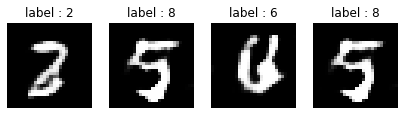

Generator loss: 2.0405304 Discriminator loss: 0.9099535
Time for epoch 98 is 22.74520468711853 sec
epoch 98 & 0/235 Result


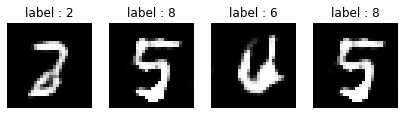

Generator loss: 1.9658008 Discriminator loss: 1.0058628
epoch 98 & 200/235 Result


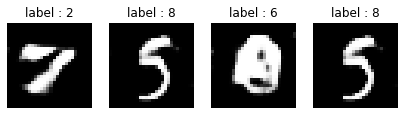

Generator loss: 1.5227866 Discriminator loss: 1.0720302
Time for epoch 99 is 22.755184412002563 sec
epoch 99 & 0/235 Result


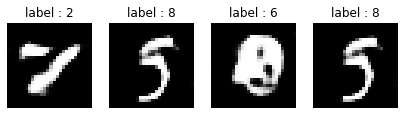

Generator loss: 1.5974481 Discriminator loss: 1.0761254
epoch 99 & 200/235 Result


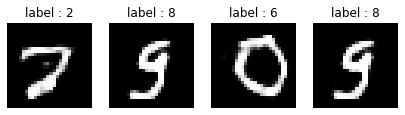

Generator loss: 1.5588738 Discriminator loss: 0.93295825
Time for epoch 100 is 22.960089445114136 sec
CPU times: user 21min 59s, sys: 16min 27s, total: 38min 26s
Wall time: 38min 4s


In [ ]:
# 학습!!!
%%time

g_losses, d_losses = train(train_dataset, EPOCHS)

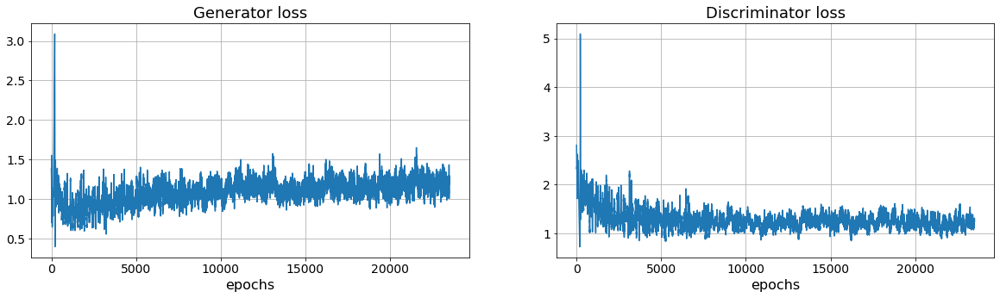

In [ ]:
import matplotlib.pyplot as plt 

plt.figure(figsize= (20,5)) 
plt.subplots_adjust(wspace = 0.2)

plt.subplot(1,2,1)  
plt.title("Generator loss",fontsize = 18) 
plt.plot(g_losses) 
plt.grid() 
plt.xlabel("epochs", fontsize = 16)          
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)


plt.subplot(1,2,2)
plt.title("Discriminator loss", fontsize = 18)
plt.plot(d_losses)
plt.grid()
plt.xlabel("epochs", fontsize = 16)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

plt.show()

- 학습 결과를 확인해 보면 , Generator의 loss와 Discriminator의 loss가 비슷한 값을 보인다. 원래 GAN의 최적의 조건은 Generator와 Discriminator의 loss가 비슷한 수준에 이를 때 학습이 잘된다고 한다. 하지만 이미 생성은 잘 못하는것을 확인할 수 있다.

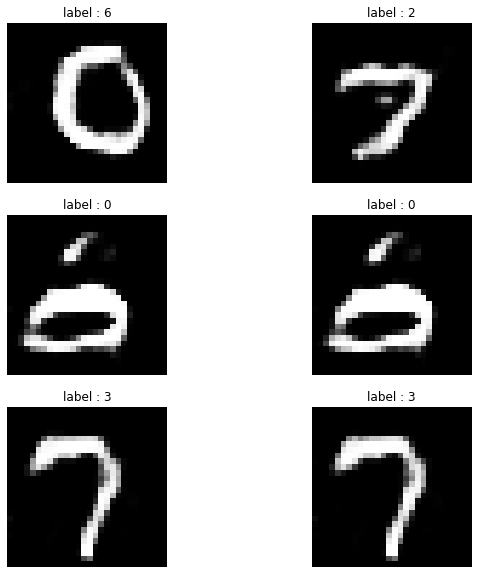

In [ ]:
# Generator가 만들어 낸 노이즈 이미지 테스트 해보기

import matplotlib.pyplot as plt

noises = tf.random.normal([50, 100])
test_number = tf.random.uniform(shape=(50,), minval=0, maxval=9, dtype=tf.int32).numpy()
test_con = tf.keras.utils.to_categorical(test_number, 10)

generated_image = G([noises,test_con], training=False)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,10))

for ax in axes.flat:
  ax.axis('off')

axes[0,0].imshow(generated_image[0], cmap='gray')
axes[0,0].set_title(f'label : {test_number[0]}')
axes[0,1].imshow(generated_image[1], cmap='gray')
axes[0,1].set_title(f'label : {test_number[1]}')
axes[1,0].imshow(generated_image[2], cmap='gray')
axes[1,0].set_title(f'label : {test_number[2]}')
axes[1,1].imshow(generated_image[3], cmap='gray')
axes[1,1].set_title(f'label : {test_number[3]}')
axes[2,0].imshow(generated_image[4], cmap='gray')
axes[2,0].set_title(f'label : {test_number[4]}')
axes[2,1].imshow(generated_image[5], cmap='gray')
axes[2,1].set_title(f'label : {test_number[5]}')

plt.show()

- 모델의 생성 결과를 확인하면 전혀 이상한 이미지들을 생성하는것을 확인할 수 있다. 